# <font color=#FFE6C7>**1.Extract Dataset**</font>

## <font color=#FFA559>1.1 Read Library That we use</font>

In [ ]:
import gdown
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.metrics import silhouette_score
from sklearn import cluster
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, PowerTransformer
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.decomposition import PCA
import warnings
from scipy.stats import shapiro, skew
from statsmodels.stats.outliers_influence import variance_inflation_factor


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix
from imblearn.pipeline import Pipeline as ImbPipeline  # Use imblearn's pipeline
from imblearn.over_sampling import SMOTE

from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

## <font color=#FFA559>**1.2 Download Data From GDrive**</font

In [ ]:
    url = f'https://drive.google.com/uc?id=1WDXotWlG5ne2KKCrTjm7LKYXo7TxYVya'
    output = 'dataset_bank.csv'
    gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1WDXotWlG5ne2KKCrTjm7LKYXo7TxYVya
To: /content/dataset_bank.csv
100%|██████████| 28.0M/28.0M [00:00<00:00, 65.8MB/s]


'dataset_bank.csv'

# <font color=#FFE6C7>**2.Read Data File**</font>

In [ ]:
df = pd.read_csv('dataset_bank.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 25 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   RowNumber                        115640 non-null  int64  
 1   CustomerId                       115640 non-null  object 
 2   Surname                          115640 non-null  object 
 3   First Name                       115640 non-null  object 
 4   Date of Birth                    115640 non-null  object 
 5   Gender                           115640 non-null  object 
 6   Marital Status                   115640 non-null  object 
 7   Number of Dependents             115640 non-null  int64  
 8   Occupation                       115640 non-null  object 
 9   Income                           115640 non-null  float64
 10  Education Level                  115640 non-null  object 
 11  Address                          115640 non-null  object 
 12  Co

In [ ]:
print(df.dtypes)

RowNumber                            int64
CustomerId                          object
Surname                             object
First Name                          object
Date of Birth                       object
Gender                              object
Marital Status                      object
Number of Dependents                 int64
Occupation                          object
Income                             float64
Education Level                     object
Address                             object
Contact Information                 object
Customer Tenure                      int64
Customer Segment                    object
Preferred Communication Channel     object
Credit Score                         int64
Credit History Length                int64
Outstanding Loans                  float64
Churn Flag                           int64
Churn Reason                        object
Churn Date                          object
Balance                            float64
NumOfProduc

In [ ]:
df.describe()

,RowNumber,Number of Dependents,Income,Customer Tenure,Credit Score,Credit History Length,Outstanding Loans,Churn Flag,Balance,NumOfProducts,NumComplaints
count,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000,115640.000000
mean,57820.500000,2.502923,52641.363046,15.490591,574.299775,15.546602,25502.731792,0.121878,124639.209748,2.999274,4.991724
std,33382.536902,1.707249,27429.756390,8.654217,159.067499,8.654630,14127.859827,0.327147,72210.476638,1.411361,3.159283
min,1.000000,0.000000,5000.960000,1.000000,300.000000,1.000000,1000.430000,0.000000,1.060000,1.000000,0.000000
25%,28910.750000,1.000000,28857.070000,8.000000,436.000000,8.000000,13226.060000,0.000000,61991.915000,2.000000,2.000000
50%,57820.500000,3.000000,52658.110000,15.000000,574.000000,16.000000,25505.285000,0.000000,124505.890000,3.000000,5.000000
75%,86730.250000,4.000000,76364.157500,23.000000,712.000000,23.000000,37742.250000,0.000000,187122.922500,4.000000,8.000000
max,115640.000000,5.000000,99999.510000,30.000000,850.000000,30.000000,49999.690000,1.000000,249998.910000,5.000000,10.000000


In [ ]:
columns_to_check = df.columns

In [ ]:
for column in columns_to_check:
    unique_values = df[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")



for column in columns_to_check:
  print(f"\nUnique values in {column}:")
  print(df[column].unique())
  print("-" * 50)

Column 'RowNumber' has 115640 unique values.
Column 'CustomerId' has 115640 unique values.
Column 'Surname' has 1000 unique values.
Column 'First Name' has 690 unique values.
Column 'Date of Birth' has 21094 unique values.
Column 'Gender' has 2 unique values.
Column 'Marital Status' has 3 unique values.
Column 'Number of Dependents' has 6 unique values.
Column 'Occupation' has 639 unique values.
Column 'Income' has 114953 unique values.
Column 'Education Level' has 4 unique values.
Column 'Address' has 115640 unique values.
Column 'Contact Information' has 115640 unique values.
Column 'Customer Tenure' has 30 unique values.
Column 'Customer Segment' has 3 unique values.
Column 'Preferred Communication Channel' has 2 unique values.
Column 'Credit Score' has 551 unique values.
Column 'Credit History Length' has 30 unique values.
Column 'Outstanding Loans' has 114298 unique values.
Column 'Churn Flag' has 2 unique values.
Column 'Churn Reason' has 4 unique values.
Column 'Churn Date' has 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 25 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   RowNumber                        115640 non-null  int64  
 1   CustomerId                       115640 non-null  object 
 2   Surname                          115640 non-null  object 
 3   First Name                       115640 non-null  object 
 4   Date of Birth                    115640 non-null  object 
 5   Gender                           115640 non-null  object 
 6   Marital Status                   115640 non-null  object 
 7   Number of Dependents             115640 non-null  int64  
 8   Occupation                       115640 non-null  object 
 9   Income                           115640 non-null  float64
 10  Education Level                  115640 non-null  object 
 11  Address                          115640 non-null  object 
 12  Co

# <font color=#FFE6C7>**3.Cleaning Data**</font>

## <font color=#FFA559>**3.1. Delete Unnecessary Column**</font>

In [ ]:
if 'RowNumber' in df.columns:
    df = df.drop('RowNumber', axis=1)

## <font color=#FFA559>**3.2. Data Types corrections and optimizations for a few columns**</font>

Observations and Suggestions

* Date of Birth and Churn Date:
>These should be converted to datetime64 for proper date operations (e.g., calculating age or tenure since churn).

* Categorical Columns (object):
>Fields like Gender, Marital Status, Occupation, Education Level, Customer Segment, and Preferred Communication Channel should be converted to category to optimize storage and processing.

* Numerical Columns:
>Already appropriately typed as int64 or float64 (e.g., Income, Credit Score, etc.). No changes needed.

* Text Columns (object):
>Fields like Surname, First Name, Address, and Contact Information can be left as object since they are identifiers or descriptive text.



In [ ]:
# 1. Convert Date Columns to Datetime
df['Date of Birth'] = pd.to_datetime(df['Date of Birth'], errors='coerce')
df['Churn Date'] = pd.to_datetime(df['Churn Date'], errors='coerce')

# 2. Convert Categorical Columns to Category
categorical_columns = [
    'Gender',
    'Marital Status',
    'Occupation',
    'Education Level',
    'Customer Segment',
    'Preferred Communication Channel',
    'Churn Reason'
]
for col in categorical_columns:
    df[col] = df[col].astype('category')

# 3. Validate Changes
print("Data Types After Correction:")
print(df.dtypes)


Data Types After Correction:
CustomerId                                 object
Surname                                    object
First Name                                 object
Date of Birth                      datetime64[ns]
Gender                                   category
Marital Status                           category
Number of Dependents                        int64
Occupation                               category
Income                                    float64
Education Level                          category
Address                                    object
Contact Information                        object
Customer Tenure                             int64
Customer Segment                         category
Preferred Communication Channel          category
Credit Score                                int64
Credit History Length                       int64
Outstanding Loans                         float64
Churn Flag                                  int64
Churn Reason         

## <font color=#FFA559>**3.3. Check and Handling Missing Values**</font>

In [ ]:
# Check missing values in the dataset
print("Missing Values Before Imputation:")
print(df.isnull().sum())

# 1. Handle Missing Data in Categorical Columns
# Replace missing values in 'Churn Reason' with 'Unknown'
df['Churn Reason'] = df['Churn Reason'].cat.add_categories(['Not Churn']).fillna('Not Churn')

# 2. Handle Missing Dates
# 'Churn Date' - For non-churned customers (Churn Flag = 0), fill with a placeholder date
df.loc[df['Churn Flag'] == 0, 'Churn Date'] = pd.NaT

# 3. Handle Missing Values in Numeric Columns
# For numeric columns, use median imputation
numeric_columns = ['Income', 'Outstanding Loans', 'Balance', 'Credit Score']
for col in numeric_columns:
    df[col].fillna(df[col].median(), inplace=True)

# Check for any remaining missing values
print('/n')
print("Missing Values After Imputation:")
print(df.isnull().sum())


Missing Values Before Imputation:
CustomerId                              0
Surname                                 0
First Name                              0
Date of Birth                           0
Gender                                  0
Marital Status                          0
Number of Dependents                    0
Occupation                              0
Income                                  0
Education Level                         0
Address                                 0
Contact Information                     0
Customer Tenure                         0
Customer Segment                        0
Preferred Communication Channel         0
Credit Score                            0
Credit History Length                   0
Outstanding Loans                       0
Churn Flag                              0
Churn Reason                       101546
Churn Date                         101546
Balance                                 0
NumOfProducts                           0


<ipython-input-118-4cdf4c6af04c>:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].median(), inplace=True)


## <font color=#FFA559>**3.4. Check and Handling Duplicate Rows**</font>

In [ ]:
duplicates = df.duplicated().sum()

if duplicates > 0:
    print(f"Found {duplicates} duplicate rows. Removing them.")
    df = df.drop_duplicates()

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 24 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   CustomerId                       115640 non-null  object        
 1   Surname                          115640 non-null  object        
 2   First Name                       115640 non-null  object        
 3   Date of Birth                    115640 non-null  datetime64[ns]
 4   Gender                           115640 non-null  category      
 5   Marital Status                   115640 non-null  category      
 6   Number of Dependents             115640 non-null  int64         
 7   Occupation                       115640 non-null  category      
 8   Income                           115640 non-null  float64       
 9   Education Level                  115640 non-null  category      
 10  Address                          115640 non-

In [ ]:
max_churn_date = df['Churn Date'].max()
print(f"The maximum churn date is: {max_churn_date}")

The maximum churn date is: 2024-08-07 00:00:00


## <font color=#FFA559>**3.5. Check Outliers**</font>

OUTLIERS OF  Income


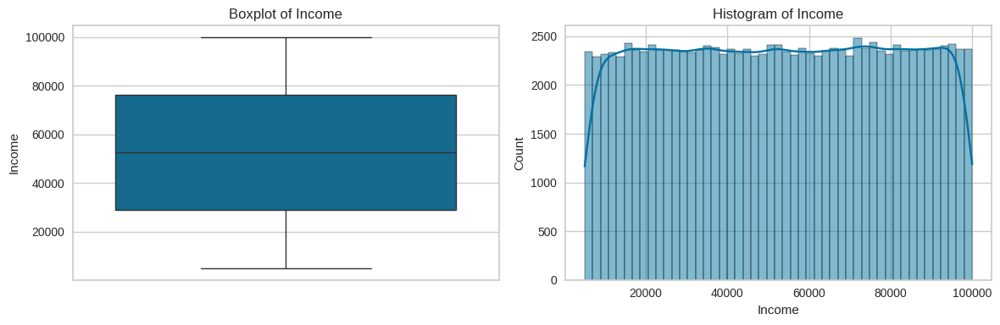

IQR-based lower bound: -42403.561250000006
IQR-based upper bound: 147624.78875
Number of outliers detected (IQR method): 0
Number of outliers detected (Z-score method): 0
Number of outliers detected (Isolation Forest): 1111


OUTLIERS OF  Credit Score


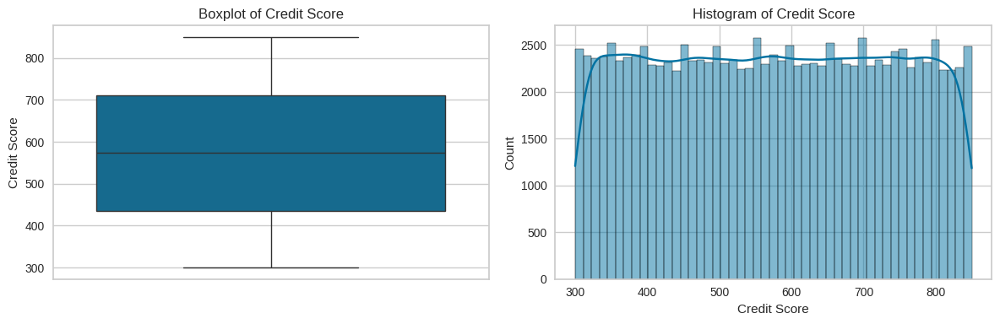

IQR-based lower bound: 22.0
IQR-based upper bound: 1126.0
Number of outliers detected (IQR method): 0
Number of outliers detected (Z-score method): 0
Number of outliers detected (Isolation Forest): 1044


OUTLIERS OF  Outstanding Loans


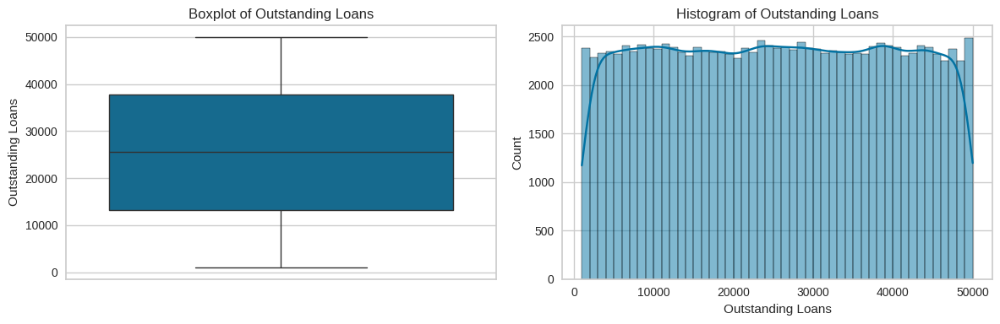

IQR-based lower bound: -23548.225000000006
IQR-based upper bound: 74516.535
Number of outliers detected (IQR method): 0
Number of outliers detected (Z-score method): 0
Number of outliers detected (Isolation Forest): 1135


OUTLIERS OF  Balance


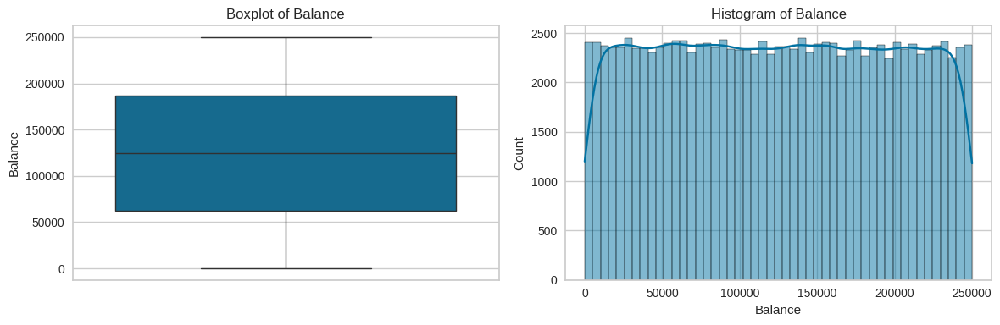

IQR-based lower bound: -125704.59624999997
IQR-based upper bound: 374819.43374999997
Number of outliers detected (IQR method): 0
Number of outliers detected (Z-score method): 0
Number of outliers detected (Isolation Forest): 1153




In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.ensemble import IsolationForest


numeric_cols = ['Income', 'Credit Score', 'Outstanding Loans', 'Balance']

for col in numeric_cols:
    print('OUTLIERS OF ',col)

    plt.figure(figsize=(12, 4))

    # Boxplot to see the spread and potential outliers
    plt.subplot(1, 2, 1)
    sns.boxplot(data=df[col])
    plt.title(f'Boxplot of {col}')

    # Histogram to see the distribution
    plt.subplot(1, 2, 2)
    sns.histplot(df[col], kde=True)
    plt.title(f'Histogram of {col}')

    plt.tight_layout()
    plt.show()

    # ------------------------------
    # Outlier Detection using IQR Method
    # ------------------------------
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    print("IQR-based lower bound:", lower_bound)
    print("IQR-based upper bound:", upper_bound)

    # Flag outliers in Income
    outliers_iqr = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    print("Number of outliers detected (IQR method):", outliers_iqr.shape[0])

    # ------------------------------
    # Outlier Detection using Z-Score Method
    # ------------------------------
    z_scores = stats.zscore(df[col])
    abs_z_scores = np.abs(z_scores)
    outliers_z = df[abs_z_scores > 3]
    print("Number of outliers detected (Z-score method):", outliers_z.shape[0])

    # ------------------------------
    # Outlier Detection using Isolation Forest
    # ------------------------------
    # Configure the IsolationForest
    iso = IsolationForest(contamination=0.01, random_state=42)
    df[f'Outlier', col] = iso.fit_predict(df[[col]])

    # Outliers are labeled as -1
    iso_outliers = df[df[f'Outlier', col] == -1]
    print("Number of outliers detected (Isolation Forest):", iso_outliers.shape[0])
    print('\n')


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


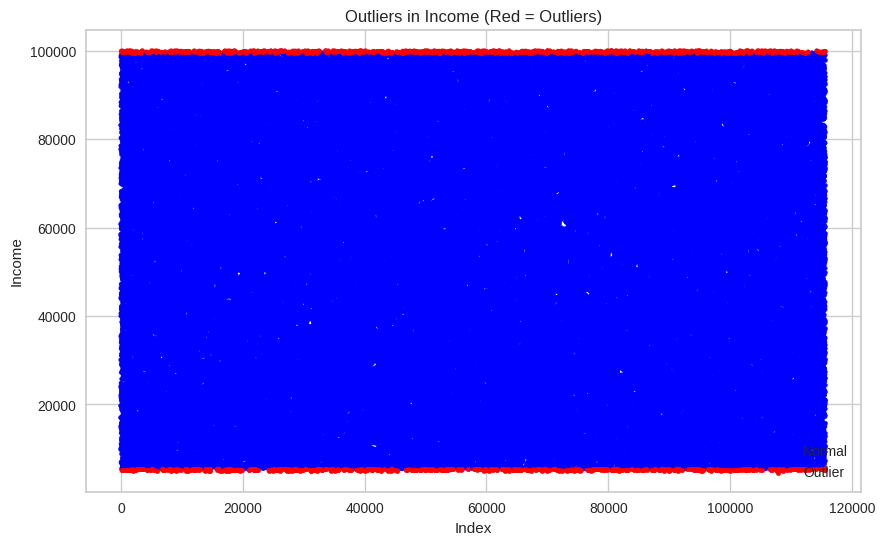

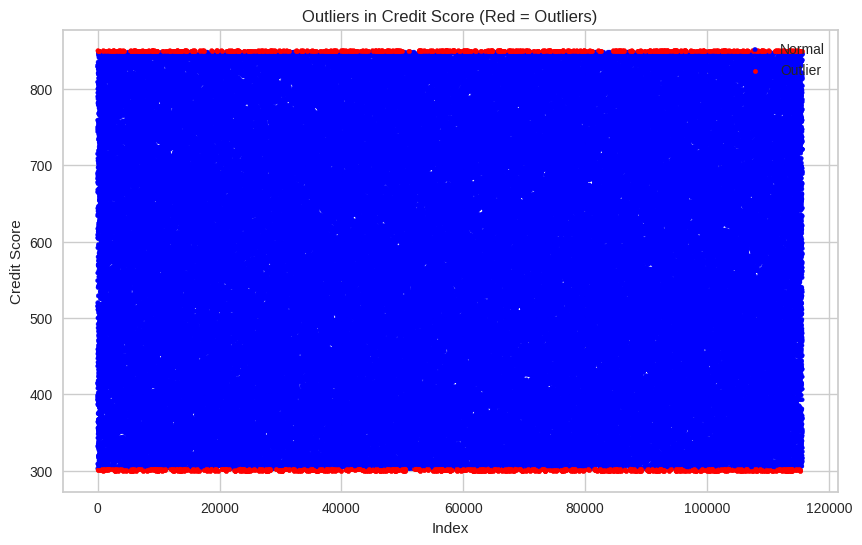

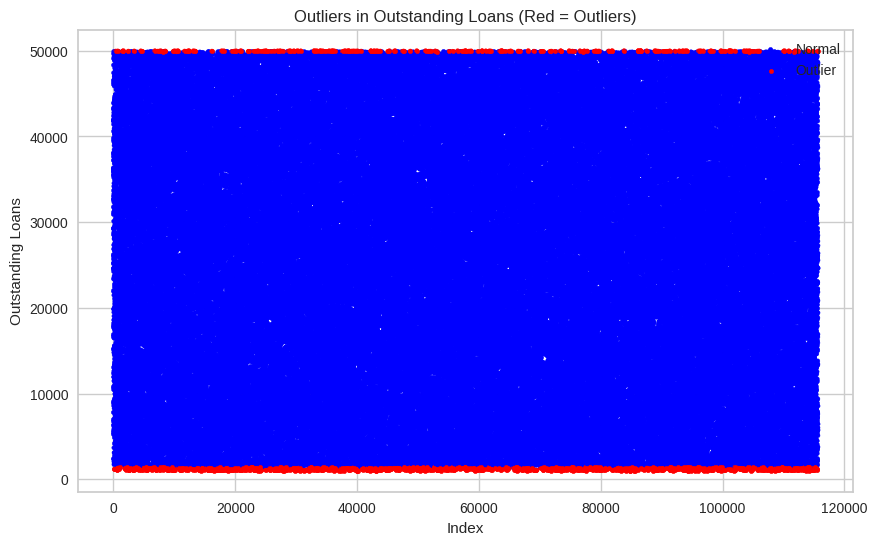

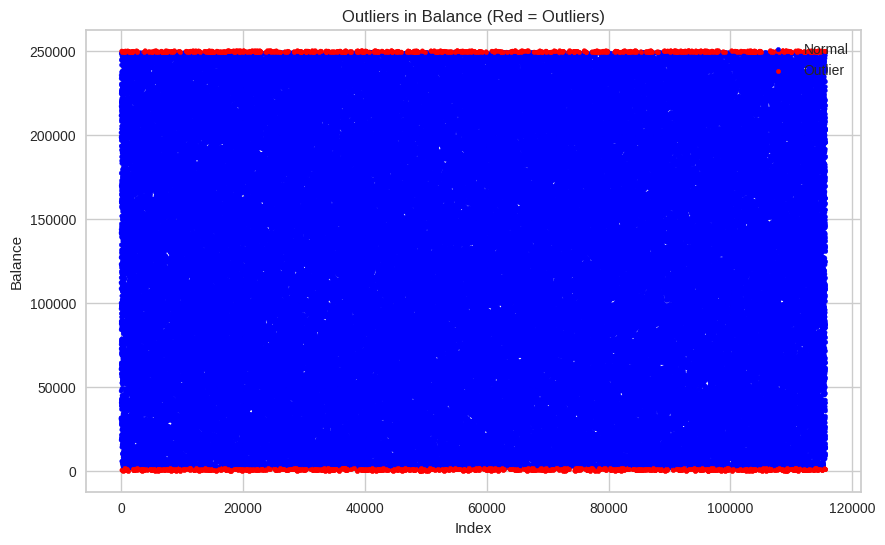

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest


# List of numerical columns to check for outliers
columns_to_check = ["Income", "Credit Score", "Outstanding Loans", "Balance"]

# Function to detect outliers using Isolation Forest
def detect_outliers_isolation_forest(data, feature, contamination=0.01):
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    predictions = iso_forest.fit_predict(data[[feature]])
    return predictions

# Plot outliers for each feature
for feature in columns_to_check:
    df["Outlier"] = detect_outliers_isolation_forest(df, feature)

    plt.figure(figsize=(10, 6))
    plt.scatter(df.index, df[feature], c=np.where(df["Outlier"] == -1, "red", "blue"), s=10, label="Normal")
    plt.scatter(df[df["Outlier"] == -1].index, df[df["Outlier"] == -1][feature], c="red", s=10, label="Outlier")
    plt.xlabel("Index")
    plt.ylabel(feature)
    plt.title(f"Outliers in {feature} (Red = Outliers)")
    plt.legend()
    plt.show()


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 29 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   CustomerId                       115640 non-null  object        
 1   Surname                          115640 non-null  object        
 2   First Name                       115640 non-null  object        
 3   Date of Birth                    115640 non-null  datetime64[ns]
 4   Gender                           115640 non-null  category      
 5   Marital Status                   115640 non-null  category      
 6   Number of Dependents             115640 non-null  int64         
 7   Occupation                       115640 non-null  category      
 8   Income                           115640 non-null  float64       
 9   Education Level                  115640 non-null  category      
 10  Address                          115640 non-

In [ ]:
# prompt: drop column (Outlier, Income), (Outlier, Credit Score), (Outlier, Outstanding Loans), (Outlier, Balance), Outlier

# Drop specified columns
columns_to_drop = [('Outlier', 'Income'), ('Outlier', 'Credit Score'),
                   ('Outlier', 'Outstanding Loans'), ('Outlier', 'Balance'), 'Outlier']

# Check if columns exist before dropping
for col in columns_to_drop:
    if isinstance(col, tuple) and col in df.columns:
        df = df.drop(columns=col)
    elif col in df.columns:
        df = df.drop(columns=col)
    else:
        print(f"Column '{col}' not found in DataFrame. Skipping...")

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 24 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   CustomerId                       115640 non-null  object        
 1   Surname                          115640 non-null  object        
 2   First Name                       115640 non-null  object        
 3   Date of Birth                    115640 non-null  datetime64[ns]
 4   Gender                           115640 non-null  category      
 5   Marital Status                   115640 non-null  category      
 6   Number of Dependents             115640 non-null  int64         
 7   Occupation                       115640 non-null  category      
 8   Income                           115640 non-null  float64       
 9   Education Level                  115640 non-null  category      
 10  Address                          115640 non-

## <font color=#FFA559>**3.6. Feature Engineering**</font>

We’ll create new features to enhance the dataset for analysis:

* **Age:** Derived from Date of Birth.
* **Debt-to-Income Ratio:** Outstanding Loans / Income.
* **Tenure Category:** Categorize Customer Tenure into groups (New, Loyal, Established, Veteran, Lifetime).
* **Churn Duration:** Time since churn for churned customers.

### <font color=#FF6000>**3.6.1. Create Age from Date of Birth**</font>

In [ ]:
# 1. Calculate Age
current_date = pd.Timestamp.now()
df['Age'] = (current_date - df['Date of Birth']).dt.days // 365  # Approximate age in years

### <font color=#FF6000>**3.6.2. Calculate Debt-To-Income Ratio**</font>

In [ ]:
# 2. Calculate Debt-to-Income Ratio
df['Debt-to-Income Ratio'] = df['Outstanding Loans'] / df['Income']
df['Debt-to-Income Ratio'] = df['Debt-to-Income Ratio'].fillna(0)  # Handle divisions by zero

### <font color=#FF6000>**3.6.3. Categorize Customer Tenure**</font>

In [ ]:
# 3. Categorize Customer Tenure
bins = [0, 2, 5, 10, 20, np.inf]
labels = ['New', 'Established', 'Loyal', 'Veteran', 'Lifetime']
df['Tenure Category'] = pd.cut(df['Customer Tenure'], bins=bins, labels=labels)

### <font color=#FF6000>**3.6.4. Categorize Occupation**</font>

#### <font color=#ffc800>**1. Occupation Mapping**</font>

In [ ]:
occupation_mapping = {
    "Education and Training": [
        "Teacher, early years/pre", "Secondary school teacher", "Teacher, primary school",
        "Teacher, special educational needs", "Higher education lecturer", "Lecturer, higher education",
        "Lecturer, further education", "English as a foreign language teacher", "Special educational needs teacher",
        "Early years teacher", "Teacher, adult education", "Teacher, music", "Teacher, English as a foreign language",
        "University professor", "Training and development officer", "Education officer, community",
        "Education officer, museum", "Education officer, environmental", "Music tutor", "Special effects artist", "Education administrator", "Learning mentor", "Lexicographer", "Outdoor educator", "Private music teacher", "Teacher, secondary school", "Instructional designer", "Life coach", "Further education lecturer", "TEFL teacher", "English as a second language teacher", "Teaching laboratory technician", "Primary school teacher", "Academic librarian", "Adult guidance worker", "Sports coach"
    ],
    "Engineering and Technology": [
        "Information systems manager", "Agricultural engineer", "Engineer, biomedical", "Engineer, site",
        "Engineer, civil (contracting)", "Engineer, civil (consulting)", "Broadcast engineer", "Communications engineer",
        "Electrical engineer", "Structural engineer", "Maintenance engineer", "Materials engineer", "Engineer, aeronautical",
        "Civil engineer, consulting", "Civil engineer, contracting", "Control and instrumentation engineer",
        "Drilling engineer", "Energy engineer", "Engineer, energy", "Engineer, automotive", "Mechanical engineer",
        "Network engineer", "Software engineer", "Systems developer", "Web designer", "IT consultant",
        "Applications developer", "Multimedia programmer", "Programmer, applications", "Programmer, multimedia",
        "Programmer, systems", "Data processing manager", "IT technical support officer", "Technical brewer",
        "Telecommunications researcher", "Product/process development scientist", "Scientist, product/process development",
        "Biomedical engineer", "Clinical research associate", "Clinical scientist, histocompatibility and immunogenetics",
        "Manufacturing systems engineer", "Manufacturing engineer", "Operational researcher", "Research scientist (life sciences)",
        "Research scientist (physical sciences)", "Research scientist (medical)", "Scientist, clinical (histocompatibility and immunogenetics)",
        "Scientist, marine", "Scientist, water quality", "Scientist, forensic", "Scientist, physiological", "Scientist, audiological",
        "Scientist, biomedical", "Scientist, research (maths)", "Scientist, research (physical sciences)",
        "Scientist, research (life sciences)","Autonomous vehicle engineer", "Aviation engineer", "Building services engineer", "Communications engineer", "Control and instrumentation engineer", "Drilling engineer", "Electronics engineer", "Engineering geologist", "Geologist, engineering", "Geologist, wellsite", "Mechanical engineer", "Mining engineer", "Nuclear engineer", "Petroleum engineer", "Telecommunications engineer", "Water engineer", "Wind energy engineer", "Draughtsperson", "Architectural technologist", "Engineer, production", "Engineer, structural", "Engineer, materials", "Engineer, water", "Engineer, manufacturing", "Engineer, mining", "Engineer, broadcasting (operations)", "Engineer, electronics", "Engineer, petroleum", "Engineer, drilling", "Engineer, chemical", "Engineer, control and instrumentation", "Engineer, maintenance", "Engineer, agricultural", "Engineer, building services", "Engineer, electrical", "Aeronautical engineer", "Engineer, communications", "Contracting civil engineer", "Engineer, manufacturing systems", "Mudlogger", "Site engineer", "Production engineer", "Chemical engineer", "Engineer, technical sales", "Engineer, land", "Engineer, maintenance (IT)", "Technical sales engineer", "Geographical information systems officer", "Games developer", "Surveyor, mining"
    ],
    "Healthcare and Medicine": [
        "Doctor, hospital", "Doctor, general practice", "General practice doctor", "Hospital doctor", "Nurse, mental health",
        "Nurse, adult", "Adult nurse", "Nurse, children's", "Nurse, learning disability", "Midwife", "Paramedic", "Pharmacist, community",
        "Pharmacist, hospital", "Physiotherapist", "Therapist, sports", "Therapist, occupational", "Therapist, speech and language",
        "Therapist, art", "Therapist, drama", "Therapist, nutritional", "Nutritional therapist", "Sports therapist", "Medical physicist",
        "Medical laboratory scientific officer", "Medical secretary", "Clinical psychologist", "Clinical biochemist", "Psychologist, prison and probation services",
        "Psychologist, sport and exercise", "Psychotherapist", "Counselling psychologist", "Occupational therapist", "Child psychotherapist",
        "Forensic psychologist", "Dietitian", "Orthoptist", "Radiographer, diagnostic", "Radiographer, therapeutic", "Therapeutic radiographer",
        "Medical sales representative", "Health visitor", "Health service manager", "Medical illustrator", "Audiological scientist",
        "Health and safety adviser", "Health and safety inspector", "Medical technical officer", "Medical physicist", "Oncologist",
        "Neurosurgeon", "Surgeon", "Veterinary surgeon", "Clinical molecular geneticist", "Clinical cytogeneticist", "Clinical embryologist",
        "Clinical scientist, histocompatibility and immunogenetics", "Pathologist", "Toxicologist", "Geneticist, molecular", "Plant breeder/geneticist", "Audiologist", "Child psychotherapist", "Chiropractor", "Clinical biochemist", "Clinical cytogeneticist", "Clinical embryologist", "Clinical molecular geneticist", "Clinical psychologist", "Dental hygienist", "Dentist", "Dietitian", "Disability support worker", "Dispensing optician", "Embryologist, clinical", "Genetic counsellor", "Herbalist", "Homeopath", "Massage therapist", "Mental health nurse", "Music therapist", "Occupational therapist", "Optometrist", "Orthodontist", "Orthoptist", "Pediatrician", "Perfusionist", "Pharmacologist", "Podiatrist", "Psychiatrist", "Psychologist, counselling", "Psychologist, educational", "Psychologist, forensic", "Psychologist, occupational", "Radiation therapist", "Rehabilitation counselor", "Speech and language therapist", "Sport and exercise psychologist", "Veterinarian", "Vocational rehabilitation counselor", "Occupational psychologist", "Educational psychologist", "Chiropodist", "Diagnostic radiographer", "Ophthalmologist", "Learning disability nurse", "Therapist, music", "Hospital pharmacist", "Psychologist, clinical", "Counsellor", "Occupational hygienist", "Psychiatric nurse", "Haematologist", "Dramatherapist", "Health promotion specialist", "Radiation protection practitioner", "Paediatric nurse", "Community pharmacist", "Optician, dispensing", "Therapist, horticultural"
    ],
    "Business and Management": [
        "Charity fundraiser", "Conference centre manager", "Customer service manager", "Leisure centre manager", "Manager, fast food restaurant",
        "Hotel manager", "Barista", "Sales executive", "Product manager", "Chief Technology Officer", "Chief Operating Officer",
        "Chief Financial Officer", "Chief Executive Officer", "Chief Marketing Officer", "Chief Strategy Officer", "Management consultant",
        "Operations geologist", "Office manager", "Waste management officer", "Risk manager", "Financial risk analyst", "Human resources officer",
        "Recruitment consultant", "Retail manager", "Warehouse manager", "Logistics and distribution manager", "Quality manager", "Production manager",
        "Event organiser", "Project manager", "Facilities manager", "Intelligence analyst", "Location manager", "Holiday representative",
        "Emergency planning/management officer", "Naval architect", "Corporate treasurer", "Corporate investment banker", "Investment banker, corporate",
        "Investment banker, operational", "Banker", "Retail banker", "Financial controller", "Financial planner", "Financial adviser", "Financial manager",
        "Energy manager", "Environmental manager", "Housing manager/officer", "Estate manager/land agent", "Armed forces operational officer",
        "Diplomatic Services operational officer", "Comptroller", "Loss adjuster, chartered", "Insurance claims handler", "Insurance account manager",
        "Insurance underwriter", "Insurance broker", "Patent attorney", "Tax adviser", "Tax inspector", "Senior tax professional/tax inspector",
        "Claims inspector/assessor", "Trading standards officer", "Regulatory affairs officer", "Public affairs consultant", "Equalities and diversity officer",
        "Community development worker", "Probation officer", "Prison officer", "Youth worker", "Careers information officer", "Careers adviser",
        "Higher education careers adviser", "Adviser, advice worker", "Advice worker", "Personal assistant", "Secretary/administrator", "Secretary, company",
        "Administrator", "Administrator, Civil Service", "Administrator, education", "Administrator, arts", "Administrator, sports", "Administrator, local government",
        "Administrator, charities/voluntary organisations", "Office manager", "Records manager", "Call centre manager", "Private music teacher",
        "Armed forces training and education officer", "Civil Service fast streamer", "Local government officer", "Chartered legal executive (England and Wales)",
        "Legal executive", "Licensed conveyancer", "Barrister's clerk", "Solicitor", "Solicitor, Scotland", "Lawyer", "Legal secretary", "Associate Professor",
        "Professor Emeritus", "Development worker, community", "Community arts worker", "Actor", "Dancer", "Artist", "Animator", "Graphic designer",
        "Interior and spatial designer", "Fashion designer", "Jewellery designer", "Furniture designer", "Textile designer", "Industrial/product designer",
        "Exhibition/display designer", "Set designer", "Television/film set designer", "Production designer, theatre/television/film", "Catering manager", "Chartered surveyor", "Construction manager", "Contractor", "Event organiser", "Executive assistant", "Farm manager", "Fish farm manager", "Freight forwarder", "Industrial buyer", "Logistics coordinator", "Media buyer", "Political campaign manager", "Project coordinator", "Quantity surveyor", "Real estate agent", "Surveyor, commercial/residential", "Tour manager", "Quarry manager", "Purchasing manager", "Accommodation manager", "Estate agent", "Commercial/residential surveyor", "Chief of Staff", "Personnel officer", "Company secretary", "Print production planner", "Surveyor, quantity"
    ],
    "Creative Arts and Design": [
        "Television production assistant", "Publishing copy", "Illustrator", "Fine artist", "Designer, interior/spatial",
        "Designer, industrial/product", "Designer, ceramics/pottery", "Designer, blown glass/stained glass", "Designer, fashion/clothing",
        "Designer, furniture", "Designer, television/film set", "Printmaker", "Photographer", "Press photographer", "Stage manager",
        "Theatre manager", "Museum/gallery exhibitions officer", "Museum/gallery curator", "Art gallery manager", "Art therapist",
        "Musician", "Composer", "Music therapist", "Editorial assistant", "Editor, magazine features", "Editor, film/video",
        "Film/video editor", "Video editor", "Science writer", "Copywriter, advertising", "Advertising art director", "Advertising copywriter",
        "Journalist, broadcasting", "Journalist, newspaper", "Journalist, magazine", "Producer, radio", "Producer, television/film/video",
        "Radio producer", "Broadcast journalist", "Public relations officer", "Public relations account executive", "Media planner",
        "Programme researcher, broadcasting/film/video", "Best boy", "Gaffer", "Lighting technician, broadcasting/film/video",
        "Sound technician, broadcasting/film/video", "Makeup artist", "Hair stylist", "Costume designer", "Set designer", "Props master",
        "Wardrobe", "Scenic artist", "Projection designer", "Voice artist", "Model", "Influencer", "Brand ambassador", "Storyteller",
        "Copywriter", "Content creator", "Visual effects artist", "Special effects artist", "Animator", "Game developer", "Computer games developer",
        "Web designer", "Graphic designer", "Multimedia specialist", "Technical author", "Writer", "Playwright", "Screenwriter", "Novelist",
        "Poet", "Lyricist", "Scriptwriter", "Editor", "Lexicographer", "Translator", "Interpreter", "Archivist", "Librarian, academic",
        "Librarian, public", "Heritage manager", "Conservator, museum/gallery", "Conservator, furniture", "Furniture conservator/restorer",
        "Public librarian", "Bookseller", "Dealer", "Gallery manager", "Arts administrator", "Arts development officer", "Community arts worker",
        "Art gallery manager", "Museum/gallery conservator", "Tourist information centre manager", "Outdoor activities/education manager",
        "Theme park manager", "Tourism officer", "Travel agency manager", "Fisheries officer", "Air cabin crew", "Cabin crew", "Flight attendant", "Architect", "Fashion designer", "Furniture designer", "Glass blower/designer", "Graphic designer", "Illustrator", "Interior designer", "Landscape architect", "Medical illustrator", "Photographer", "Product designer", "Textile designer", "Theatre director", "Copywriter", "Film editor", "Clothing/textile technologist", "Garment/textile technologist", "Ceramics designer", "Designer, jewellery", "Designer, exhibition/display", "Designer, graphic", "Designer, textile", "Designer, multimedia", "Exhibition designer", "Colour technologist", " Creative Arts and Design", "Copy"
    ],
    "Legal and Compliance": [
        "Patent attorney", "Barrister", "Solicitor", "Solicitor, Scotland", "Legal executive", "Chartered legal executive (England and Wales)",
        "Lawyer", "Legal secretary", "Probation officer", "Immigration officer", "Chartered loss adjuster", "Chartered public finance accountant",
        "Chartered accountant", "Chartered certified accountant", "Chartered management accountant", "Chartered surveyor", "Chartered public finance accountant",
        "Chartered legal executive", "Chartered loss adjuster", "Chartered surveyor", "Chartered physiotherapist", "Chartered engineer", "Entertainment lawyer", "Mediator", "Paralegal", "Patent examiner", "Private detective", "Trade mark attorney"
    ],
    "Finance and Accounting": [
        "Accountant, chartered", "Accountant, chartered certified", "Accountant, chartered public finance", "Accountant, chartered management",
        "Actuary", "Auditor", "Bookkeeper", "Budget analyst", "Chief Financial Officer", "Comptroller", "Controller", "Cost accountant",
        "Credit analyst", "Financial analyst", "Financial controller", "Financial manager", "Forensic accountant", "Fraud investigator",
        "Internal auditor", "Management accountant", "Payroll administrator", "Pension scheme manager", "Tax adviser", "Tax inspector",
        "Treasury analyst", "Valuation surveyor", "Venture capitalist", "Wealth manager", "Stockbroker", "Bond trader", "Currency trader",
        "Futures trader", "Options trader", "Equities trader", "Financial risk analyst", "Financial planner", "Investment analyst",
        "Investment banker, corporate", "Investment banker, operational", "Portfolio manager", "Risk analyst", "Underwriter", "Economist", "Investment analyst", "Loan officer", "Accounting technician", "Insurance risk surveyor", "Surveyor, insurance"
    ],
    "Sales and Marketing": [
        "Sales executive", "Media buyer", "Advertising copywriter", "Advertising account executive", "Advertising account planner",
        "Marketing executive", "Sales promotion account executive", "Retail merchandiser", "Retail buyer", "Buyer, retail", "Buyer, industrial",
        "Merchandiser, retail", "Sales professional, IT", "Sales representative", "Sales associate", "Sales manager", "Sales coordinator",
        "Sales associate", "Sales representative", "Sales coordinator", "Sales manager", "Sales associate", "Medical sales representative", "Pharmaceutical sales rep", "Market researcher", "Equities trader", "Financial trader", "Bonds trader", "Air broker"
    ],
    "IT and Software Development": [
        "Information systems manager", "IT consultant", "Applications developer", "Database administrator", "IT trainer", "IT sales professional",
        "IT technical support officer", "Software engineer", "Systems analyst", "Technical author", "Web designer", "Data scientist",
        "Programmer, applications", "Programmer, multimedia", "Programmer, systems", "Systems developer", "Network engineer", "Cybersecurity analyst",
        "Cloud engineer", "DevOps engineer", "AI specialist", "Machine learning engineer", "Data scientist", "Blockchain developer",
        "Full-stack developer", "Front-end developer", "Back-end developer", "Mobile app developer", "Game developer", "UI/UX designer", "Computer games developer", "Database administrator", "Mobile app developer", "Web developer", "Data scientist"
    ],
    "Science and Research": [
        "Scientist, research (maths)", "Scientist, research (physical sciences)", "Scientist, research (life sciences)",
        "Scientist, research (medical)", "Scientist, marine", "Scientist, water quality", "Scientist, forensic", "Scientist, physiological",
        "Scientist, audiological", "Scientist, biomedical", "Scientist, product/process development", "Biochemist, clinical",
        "Clinical molecular geneticist", "Clinical cytogeneticist", "Clinical embryologist", "Clinical scientist, histocompatibility and immunogenetics",
        "Clinical research associate", "Cytogeneticist", "Embryologist, clinical", "Geneticist, molecular", "Geoscientist", "Geophysicist/field seismologist",
        "Immunologist", "Microbiologist", "Oceanographer", "Petroleum engineer", "Plant breeder/geneticist", "Seismic interpreter",
        "Toxicologist", "Wellsite geologist", "Field trials officer", "Exercise physiologist", "Audiological scientist", "Astrophysicist",
        "Astronomer", "Hydrologist", "Hydrogeologist", "Meteorologist", "Physical scientist", "Social researcher", "Statistical analyst",
        "Surveyor, hydrographic", "Water quality scientist", "Animal nutritionist", "Anthropologist", "Archaeologist", "Astronomer", "Astrophysicist", "Biochemist", "Botanist", "Criminologist", "Data scientist", "Food technologist", "Forensic scientist", "Geneticist, molecular", "Geographer", "Geophysicist/field seismologist", "Herpetologist", "Hydrologist", "Marine biologist", "Marine scientist", "Mathematician", "Meteorologist", "Naturalist", "Oceanographer", "Ornithologist", "Paleontologist", "Philosopher", "Physicist", "Political scientist", "Scientist, clinical (histocompatibility and immunogenetics)", "Scientist, marine", "Scientist, water quality", "Scientist, forensic", "Scientist, physiological", "Scientist, audiological", "Scientist, biomedical", "Scientist, product/process development", "Scientist, research (maths)", "Scientist, research (physical sciences)", "Scientist, research (life sciences)", "Seismic interpreter", "Wildlife biologist", "Ballistics expert", "Genealogist", "Soil scientist", "Geochemist", "Cartographer", "Statistician", "Scientific laboratory technician", "Animal technologist", "Field seismologist", "Analytical chemist", "Research scientist (maths)", "Geophysical data processor", "Metallurgist", "Brewing technologist", "Ergonomist", "Biomedical scientist", "Physiological scientist", "Chemist, analytical"
    ],
    "Public Service and Administration": [
        "Civil Service administrator", "Civil Service fast streamer", "Community education officer", "Community development worker",
        "Government social research officer", "Local government officer", "Probation officer", "Prison officer", "Police officer",
        "Social worker", "Social researcher", "Social research officer, government", "Research officer, government", "Research officer, political party",
        "Research officer, trade union", "Welfare rights adviser", "Youth worker", "Charity officer", "International aid/development worker",
        "Diplomatic Services operational officer", "Ambassador", "Consul", "Foreign service officer", "Immigration officer", "Customs officer",
        "Firefighter", "Emergency medical technician", "Paramedic", "Ambulance person", "Air traffic controller", "Naval architect", "Military personnel",
        "Armed forces logistics/support/administrative officer", "Armed forces technical officer", "Armed forces operational officer",
        "Armed forces training and education officer", "Armed forces training and education officer", "Merchant navy officer", "Airline pilot",
        "Pilot, airline", "Air cabin crew", "Cabin crew", "Flight attendant", "Aviation engineer", "Aviation mechanic", "Aviation technician", "Aid worker", "Building control surveyor", "City planner", "Development worker, community", "Development worker, international aid", "Environmental health practitioner", "Gender equality advocate", "Immigration officer", "Indigenous rights advocate", "Intelligence analyst", "Park ranger", "Public health inspector", "Social worker", "Urban planner", "Funeral director", "Surveyor, building", "Building surveyor", "Lobbyist", "Politician's assistant", "Volunteer coordinator", "Trade union research officer", "Planning and development surveyor", "Surveyor, planning and development", "Equality and diversity officer", "Sports development officer", "Environmental education officer", "Surveyor, building control"
    ],
    "Environmental and Conservation": [
        "Environmental manager", "Conservation officer, historic buildings", "Conservation officer, nature", "Nature conservation officer",
        "Ecologist", "Environmental health practitioner", "Environmental consultant", "Forest/woodland manager", "Horticulturist, amenity",
        "Horticulturist, commercial", "Horticultural consultant", "Horticultural therapist", "Land/geomatics surveyor", "Ranger/warden",
        "Warden/ranger", "Fish farm manager", "Fisheries officer", "Recycling officer", "Waste management officer", "Water engineer",
        "Hydrologist", "Hydrogeologist", "Environmental scientist", "Renewable energy engineer", "Sustainability consultant",
        "Climate change analyst", "Energy consultant", "Green building consultant", "Urban planner", "Town planner", "Conservator, museum/gallery",
        "Conservator, furniture", "Furniture conservator/restorer", "Herbalist", "Phytotherapist", "Osteopath", "Acupuncturist", "Chiropractor",
        "Holistic healer", "Homeopath", "Environmental consultant", "Forester", "Forest/woodland manager", "Hazardous materials specialist", "Recycling officer", "Scientist, water quality", "Land", "Minerals surveyor", "Arboriculturist", "Surveyor, minerals", "Surveyor, land/geomatics", "Commercial horticulturist", "Amenity horticulturist"
    ],
    "Skilled Trades and Crafts": [
        "Carpenter", "Craftsperson", "Electrician", "Gardener", "Plumber", "Tree surgeon", "Taxidermist", "Make", "Sub"
    ],
    "Retail and Customer Service": [
        "Retail buyer", "Retail manager", "Sales associate", "Sales representative", "Customer service manager", "Retail merchandiser",
        "Visual merchandiser", "Store manager", "Fast food restaurant manager", "Public house manager", "Restaurant manager", "Restaurant manager, fast food",
        "Hotel manager", "Catering manager", "Barista", "Fitness centre manager", "Call centre manager", "Retail banker", "Retail salesperson",
        "Sales clerk", "Cashier", "Receptionist", "Travel agency manager", "Tourist information centre manager", "Tour guide", "Theme park manager",
        "Holiday representative"
    ],
    "Transportation and Logistics": [
        "Transport planner", "Passenger transport manager", "Freight forwarder", "Shipping broker", "Ship broker", "Airline pilot", "Pilot, airline",
        "Air traffic controller", "Train driver", "Bus driver", "Truck driver", "Logistics and distribution manager", "Supply chain manager",
        "Warehousing manager", "Marine engineer", "Naval architect", "Merchant navy officer", "Railway engineer", "Automotive engineer",
        "Aerospace engineer", "Drone operator", "Airport operations manager", "Port manager", "Maritime officer", "Aviation mechanic", "Aviation technician", "Hydrographic surveyor"
    ],
    "Media and Communication": [
        "Journalist, broadcasting", "Journalist, newspaper", "Journalist, magazine", "Broadcast engineer", "Radio broadcast assistant",
        "Production assistant, radio", "Production assistant, television", "Broadcast presenter", "Presenter, broadcasting", "Television camera operator",
        "Camera operator", "Editor, magazine features", "Editor, film/video", "Editorial assistant", "Proofreader", "Copywriter, advertising",
        "Advertising art director", "Advertising account executive", "Advertising account planner", "Public relations officer", "Public relations account executive",
        "Media planner", "Race relations officer", "Political correspondent", "Sports commentator", "Weather forecaster", "News anchor", "Reporter",
        "Sub-editor", "Press sub", "Press photographer", "Press officer", "Programme researcher, broadcasting/film/video", "Radio producer",
        "Producer, radio", "Producer, television/film/video", "TV producer", "Film producer", "Sound technician, broadcasting/film/video",
        "Lighting technician, broadcasting/film/video", "Makeup artist", "Hair stylist", "Stylist", "Wardrobe", "Props master", "Scenic artist",
        "Projection designer", "Visual effects artist", "Special effects artist", "Animator", "Game developer", "Computer games developer",
        "Web designer", "Graphic designer", "Multimedia specialist", "UI/UX designer", "Copywriter", "Content creator", "Social media manager",
        "Digital marketer", "SEO specialist", "SEM specialist", "Content strategist", "Brand manager", "Product manager", "Market researcher",
        "Marketing executive", "Public relations officer", "Public relations account executive", "Media planner", "Race relations officer",
        "Political correspondent", "Sports commentator", "Weather forecaster", "News anchor", "Reporter", "Sub-editor", "Press sub", "Press photographer",
        "Press officer", "Programme researcher, broadcasting/film/video", "Radio producer", "Producer, radio", "Producer, television/film/video",
        "TV producer", "Film producer", "Audiovisual technician", "Commissioning editor", "Information officer", "Interpreter", "Journalist", "New media specialist", "Programme researcher, broadcasting/film/video", "Public affairs consultant", "Social media manager", "Technical author", "Translation specialist", "Runner, broadcasting/film/video", "Television/film/video producer", "Television floor manager", "Publishing rights manager"
    ],
    "Agriculture and Farming": [
        "Farm manager", "Fish farm manager", "Horticultural consultant", "Surveyor, rural practice", "Rural practice surveyor"
    ],
    "Cultural and Heritage Preservation": [
        "Conservator, museum/gallery", "Conservator, furniture", "Cultural heritage manager", "Curator", "Historic buildings inspector/conservation officer", "Exhibitions officer, museum/gallery", "Museum education officer"
    ]

}

#### <font color=#ffc800>**2. Mapping Occupation Implementation**</font>

In [ ]:
# Function to map occupation to category
def map_occupation_to_category(occupation, mapping):
    for category, occupations_list in mapping.items():
        if any(keyword.lower() in occupation.lower() for keyword in occupations_list):
            return category
    return "Other Specialized Roles"  # Default fallback

# Apply the mapping function to create a new column 'Category'
df['Occupation Category'] = df['Occupation'].apply(lambda x: map_occupation_to_category(x, occupation_mapping))

In [ ]:
unique_categories = df['Occupation Category'].unique()
sorted_unique_categories = sorted(unique_categories)
sorted_unique_categories


['Agriculture and Farming',
 'Business and Management',
 'Creative Arts and Design',
 'Cultural and Heritage Preservation',
 'Education and Training',
 'Engineering and Technology',
 'Environmental and Conservation',
 'Finance and Accounting',
 'Healthcare and Medicine',
 'IT and Software Development',
 'Legal and Compliance',
 'Media and Communication',
 'Public Service and Administration',
 'Retail and Customer Service',
 'Sales and Marketing',
 'Science and Research',
 'Skilled Trades and Crafts',
 'Transportation and Logistics']

### <font color=#FF6000>**3.6.5. Extract the state from address columns**</font>

In [ ]:
# Extract the state from Adress columns
def extract_zip_code_state(address):
    parts = address.split("\n")
    zip_code_state = parts[1].split(" ")
    return zip_code_state

df['zip_code_state'] = df['Address'].apply(extract_zip_code_state)
df['zip_code'] = df['zip_code_state'].apply(lambda x: x[-1])
df['state'] = df['zip_code_state'].apply(lambda x: x[-2])

# Create the 'Region_West', 'Region_Midwest', 'Region_South', 'Region_Northeast' columns: 1 if the state is in corresponding list, otherwise 0

western_states = ['WA', 'OR', 'CA', 'ID', 'NV', 'WY', 'UT', 'AZ', 'CO', 'NM', 'AK']
midwest_states = ['ND','SD','NE','KS','MN','IA','MO','WI','IL','IN','MI','OH']
south_states = ['TX','OK','AR','LA','KY','TN','MS','AL','WV','DE','MD','DC','VA','NC','SC','GA','FL', 'PR']
northeast_states = ['ME','VT','NH','MA','CT','RI','NY','PA','NJ']

df = df.drop('zip_code_state', axis=1)
df = df.drop('Address', axis=1)

In [ ]:
df.to_csv('df_cleaned.csv', index=False)

## <font color=#FFA559>**3.7. Outcome of the Process**</font>


1.   Missing data is handled appropriately.
2.   New features are added.
3.   Outliers are capped using the IQR method to reduce their impact on analysis.
4.   A clean, enriched dataset is saved for downstream analysis.

In [ ]:
df.info()
df.describe()
df['Churn Flag'].value_counts(normalize=True)  # Check class balance


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 29 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   CustomerId                       115640 non-null  object        
 1   Surname                          115640 non-null  object        
 2   First Name                       115640 non-null  object        
 3   Date of Birth                    115640 non-null  datetime64[ns]
 4   Gender                           115640 non-null  category      
 5   Marital Status                   115640 non-null  category      
 6   Number of Dependents             115640 non-null  int64         
 7   Occupation                       115640 non-null  category      
 8   Income                           115640 non-null  float64       
 9   Education Level                  115640 non-null  category      
 10  Contact Information              115640 non-

,proportion
Churn Flag,
0,0.878122
1,0.121878


2. Feature Distribution & Correlations <br/>
Numerical Features

<Axes: >

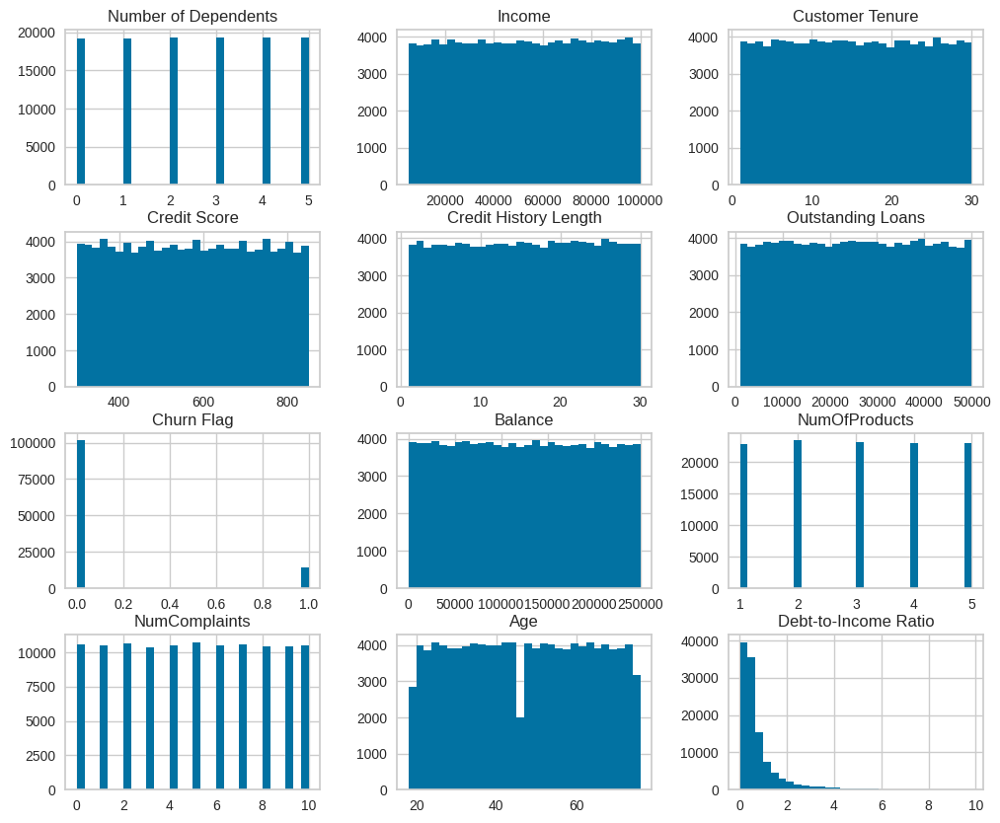

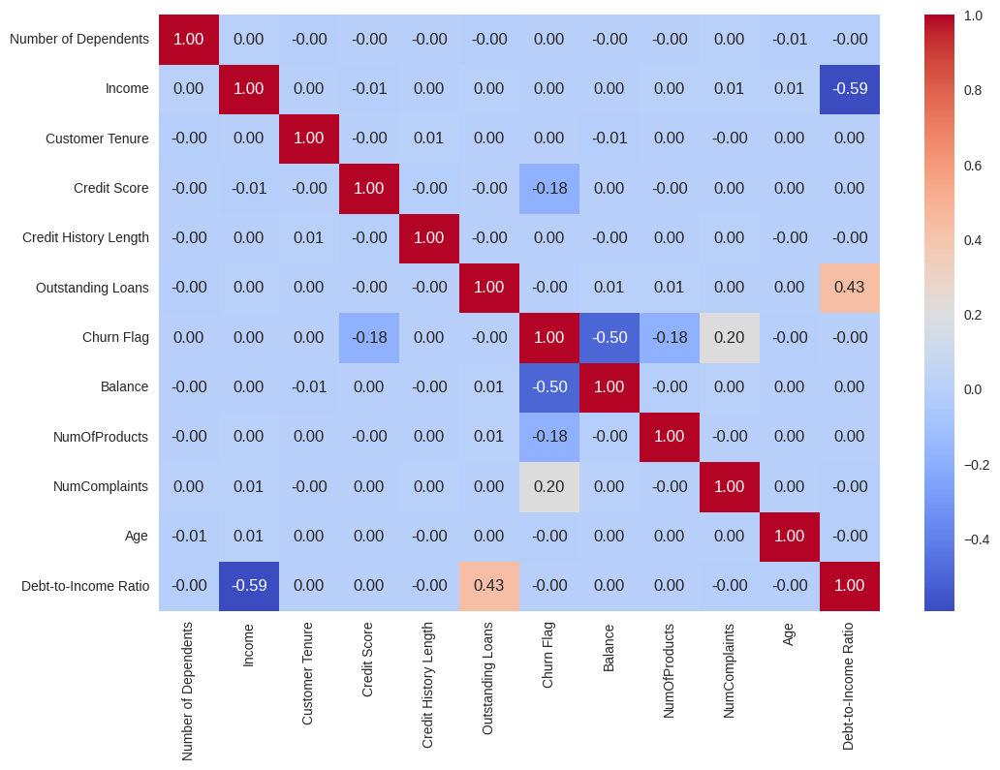

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numerical features for correlation
numerical_features = df.select_dtypes(include=['number'])  # Select numerical columns only

# Histogram for numerical features
numerical_features.hist(figsize=(12,10), bins=30)

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numerical_features.corr(), annot=True, cmap="coolwarm", fmt=".2f")

Categorical Features
Bar plots: Understand churn distribution across categories.
Chi-square test: Check statistical significance of categorical features.

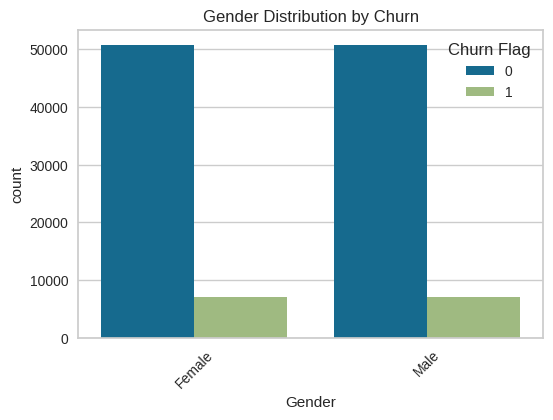

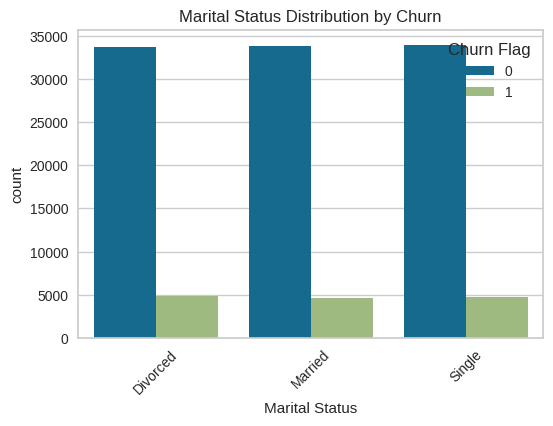

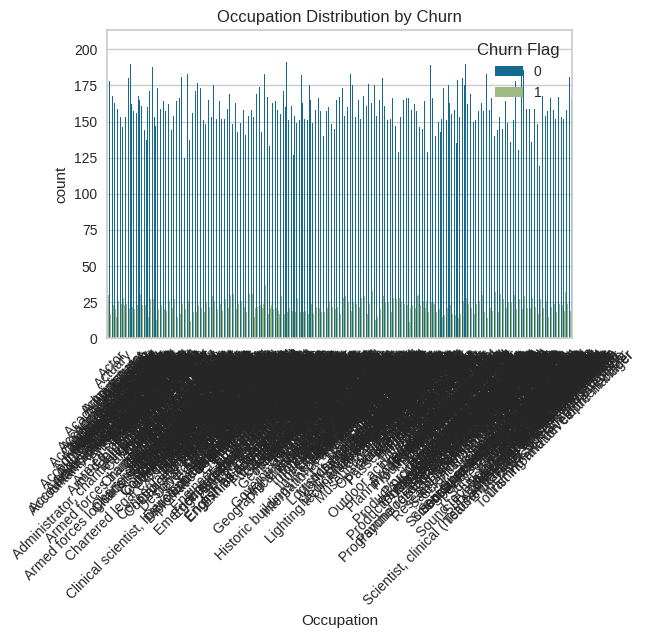

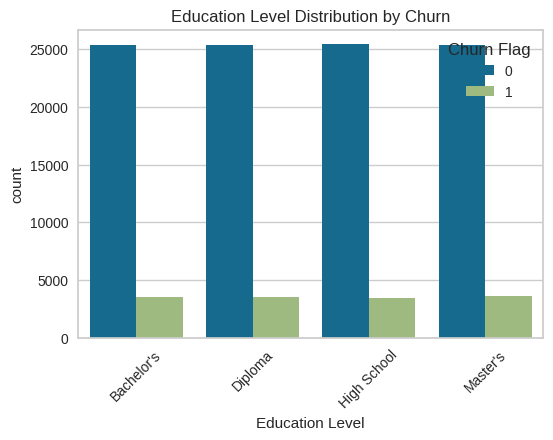

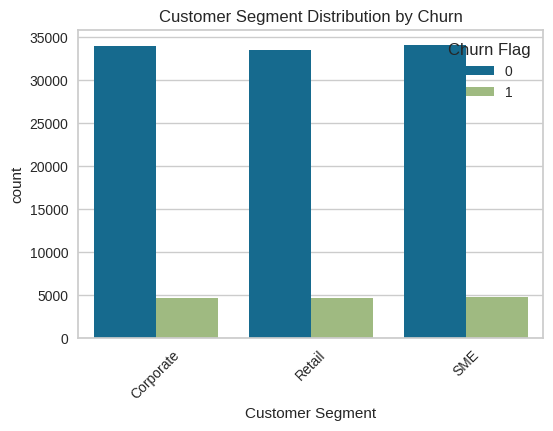

In [ ]:
# Bar plot for categorical features
categorical_features = ['Gender', 'Marital Status', 'Occupation', 'Education Level', 'Customer Segment']
for col in categorical_features:
    plt.figure(figsize=(6,4))
    sns.countplot(data=df, x=col, hue='Churn Flag')
    plt.title(f'{col} Distribution by Churn')
    plt.xticks(rotation=45)
    plt.show()


3. Churn Risk Analysis

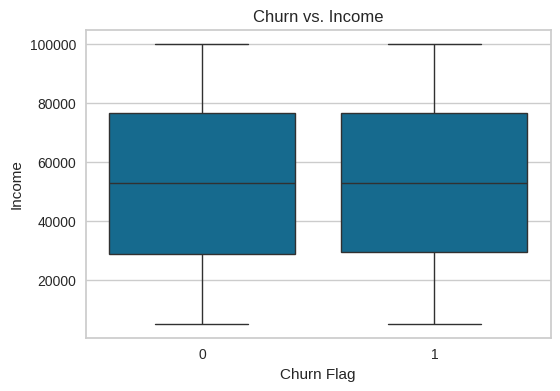

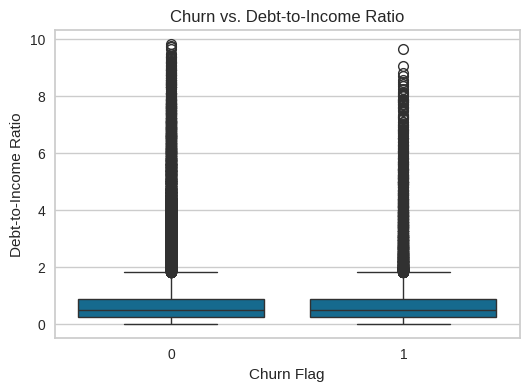

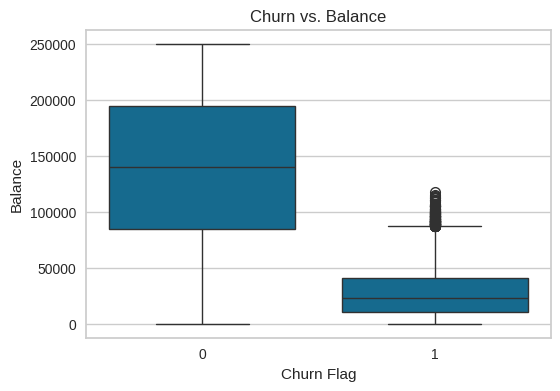

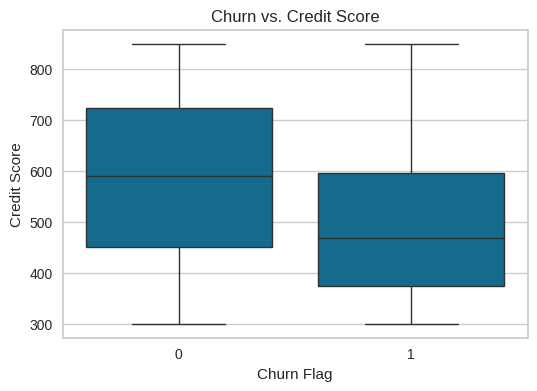

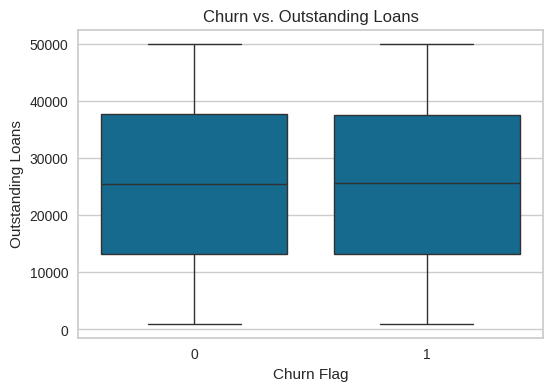

In [ ]:
# Boxplot of churned vs. retained customers for financial features
features = ['Income', 'Debt-to-Income Ratio', 'Balance', 'Credit Score', 'Outstanding Loans']
for col in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(data=df, x='Churn Flag', y=col)
    plt.title(f'Churn vs. {col}')
    plt.show()


4. Churn Reason Segmentation

In [ ]:
df.groupby('Churn Reason')['Churn Flag'].count().sort_values(ascending=False)


<ipython-input-148-bfceab733992>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby('Churn Reason')['Churn Flag'].count().sort_values(ascending=False)


,Churn Flag
Churn Reason,
Not Churn,101546
Service Issues,3573
Account Closure,3548
Relocation,3528
Better Offers Elsewhere,3445


In [ ]:
df.groupby('Customer Segment')['Churn Flag'].mean().sort_values(ascending=False)

<ipython-input-150-002f86705c29>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby('Customer Segment')['Churn Flag'].mean().sort_values(ascending=False)


,Churn Flag
Customer Segment,
SME,0.123024
Retail,0.121555
Corporate,0.121043


# <font color=#FFE6C7>**4. Model Predict : Random Forest Predict**</font>

## <font color=#FFA559>**4.1. Data Preparation**</font>

In [ ]:
from sklearn.impute import SimpleImputer

In [ ]:
df = pd.read_csv('df_cleaned.csv')

In [ ]:
data_original=df.copy()

In [ ]:
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 29 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   CustomerId                       115640 non-null  object 
 1   Surname                          115640 non-null  object 
 2   First Name                       115640 non-null  object 
 3   Date of Birth                    115640 non-null  object 
 4   Gender                           115640 non-null  object 
 5   Marital Status                   115640 non-null  object 
 6   Number of Dependents             115640 non-null  int64  
 7   Occupation                       115640 non-null  object 
 8   Income                           115640 non-null  float64
 9   Education Level                  115640 non-null  object 
 10  Contact Information              115640 non-null  object 
 11  Customer Tenure                  115640 non-null  int64  
 12  Cu

### <font color=#FF6000>**4.1.1. Drop Unnecessary Columns**</font>

In [ ]:
# Drop columns that don't contribute to prediction or could cause data leakage
drop_cols = [
    "CustomerId", "Surname", "First Name", "Contact Information",
    "Churn Date", "Churn Reason", "Date of Birth"
]
df.drop(columns=drop_cols, inplace=True)

# Check for missing values
print("Missing values per column:\n", df.isnull().sum())

Missing values per column:
 Gender                             0
Marital Status                     0
Number of Dependents               0
Occupation                         0
Income                             0
Education Level                    0
Customer Tenure                    0
Customer Segment                   0
Preferred Communication Channel    0
Credit Score                       0
Credit History Length              0
Outstanding Loans                  0
Churn Flag                         0
Balance                            0
NumOfProducts                      0
NumComplaints                      0
Age                                0
Debt-to-Income Ratio               0
Tenure Category                    0
Occupation Category                0
zip_code                           0
state                              0
dtype: int64


### <font color=#FF6000>**4.1.2. Encode Categorical Features**</font>

In [ ]:
# One-hot encode categorical variables to convert them into numeric values
df_encoded = pd.get_dummies(df, drop_first=True)

## <font color=#FFA559>**4.2. Feature Selection and Target Definition**</font>

In [ ]:
# Define the feature set and target variable
X = df_encoded.drop("Churn Flag", axis=1)
y = df_encoded["Churn Flag"]

## <font color=#FFA559>**4.3. Split the Data into Training and Testing Sets**</font>

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


## <font color=#FFA559>**4.4. Train a Baseline Random Forest Model**</font>

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Initialize and train the Random Forest model
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf.predict(X_test)

# Evaluate the baseline model performance
print("Baseline Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Baseline Model Performance:
Accuracy: 0.973235904531304
Precision: 0.9884547069271759
Recall: 0.7896417169208939
F1 Score: 0.8779333464799842

Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98     20309
           1       0.99      0.79      0.88      2819

    accuracy                           0.97     23128
   macro avg       0.98      0.89      0.93     23128
weighted avg       0.97      0.97      0.97     23128



## <font color=#FFA559>**4.5. Save then upload all variable in pickle**</font>

In [ ]:
# prompt: save above all importance variable in pickle (df, drop_cols, data, rf, y_pred, X_train, X_test, y_train, y_test, x, y, df_encoded

import pickle

# Assuming df, drop_cols, data, rf, y_pred, X_train, X_test, y_train, y_test, x, y, df_encoded are defined as in Our previous code

# Create a dictionary to store the variables
variables_to_save = {
    "df": df,
    "drop_cols": drop_cols,
    "rf": rf,
    "y_pred": y_pred,
    "X_train": X_train,
    "X_test": X_test,
    "y_train": y_train,
    "y_test": y_test,
    "x": X, # Assuming 'x' refers to X
    "y": y,
    "df_encoded": df_encoded
}

# Save the variables to a pickle file
with open("model_variables.pkl", "wb") as file:
    pickle.dump(variables_to_save, file)


## <font color=#FFA559>**4.6. (Optional) Hyperparameter Tuning with RandomSearchCV**</font>

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Define a narrower distribution of hyperparameters to speed up the search
param_dist = {
    "n_estimators": [100, 200, 300],  # Fewer estimators
    "max_depth": [10, 20, None],       # Fewer depths
    "min_samples_split": [2, 5],       # Fewer options for split
    "min_samples_leaf": [1, 2],        # Fewer leaf options
    "bootstrap": [True]                # Keep only one bootstrap option for speed
}

# Set up Randomized Search with cross-validation (fewer iterations for speed)
#random_search = RandomizedSearchCV(
#    estimator=RandomForestClassifier(random_state=42),
#    param_distributions=param_dist,
#    n_iter=30,  # Lower number of iterations for faster search
#    cv=3,  # Fewer cross-validation folds for speed (lower from 5)
#    scoring="f1",  # Can choose another metric like accuracy if needed
#    n_jobs=-1,  # Use all cores for parallelization
#    random_state=42
#)

random_search = RandomForestClassifier(
    n_estimators=200,          # Increased number of trees
    max_depth=15,              # Slightly deeper trees
    class_weight='balanced',   # Handle class imbalance
    random_state=42            # For reproducibility
)

# Fit the model on the training data
random_search.fit(X_train, y_train)

## <font color=#FFA559>**4.7. Train the final model with the best parameters**</font>

In [ ]:
# Train the final model using the best parameters from RandomizedSearchCV
best_rf = RandomForestClassifier(
    n_estimators=200,          # Increased number of trees
    max_depth=30,              # Slightly deeper trees
    class_weight='balanced',   # Handle class imbalance
    random_state=42 # Use all cores for parallelization
)
best_rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=30, n_estimators=200,
                       random_state=42)

In [ ]:
# Train the final model using the best parameters from RandomizedSearchCV
best_rf = RandomForestClassifier(
    n_estimators=200,          # Increased number of trees
    max_depth=30,              # Slightly deeper trees
    class_weight='balanced',   # Handle class imbalance
    random_state=42 # Use all cores for parallelization
)
best_rf.fit(X_train, y_train)

# Predict on the test data
y_pred_best = best_rf.predict(X_test)
print('Predict on the test data')
# Evaluate the optimized model performance
print("Optimized Model Performance (Data Test):")
print("Accuracy (Data Test):", accuracy_score(y_test, y_pred_best))
print("Precision (Data Test):", precision_score(y_test, y_pred_best))
print("Recall (Data Test):", recall_score(y_test, y_pred_best))
print("F1 Score (Data Test):", f1_score(y_test, y_pred_best))
print("\nClassification Report (Data Test):\n", classification_report(y_test, y_pred_best))
print('\n')


# Predict on the train data
y_pred_best_train = best_rf.predict(X_train)
print('Predict on the train data')
# Evaluate the optimized model performance
print("Optimized Model Performance (Data Train):")
print("Accuracy (Data Train):", accuracy_score(y_train, y_pred_best_train))
print("Precision (Data Train):", precision_score(y_train, y_pred_best_train))
print("Recall (Data Train):", recall_score(y_train, y_pred_best_train))
print("F1 Score (Data Train):", f1_score(y_train, y_pred_best_train))
print("\nClassification Report (Data Train):\n", classification_report(y_train, y_pred_best_train))


## <font color=#FFA559>**4.8. Feature Importance Visualization**</font>

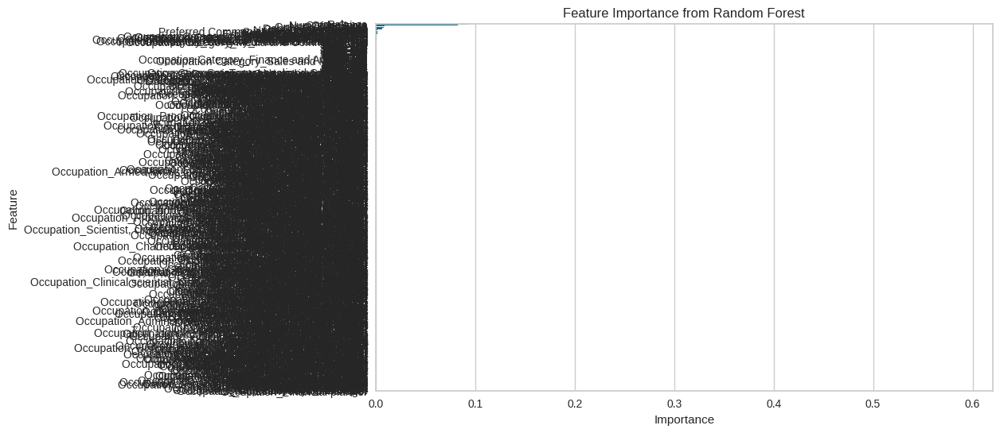

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Assuming 'best_rf' and 'X_train' are defined from the previous code

# Get feature importances
importances = best_rf.feature_importances_

# Create a DataFrame for easier visualization
feature_importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})
# Sort the DataFrame by importance (descending order)
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False)


# Plot feature importances
plt.figure(figsize=(10, 6))
# Use the sorted DataFrame in the plot
sns.barplot(x='importance', y='feature', data=feature_importance_df)
plt.title('Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

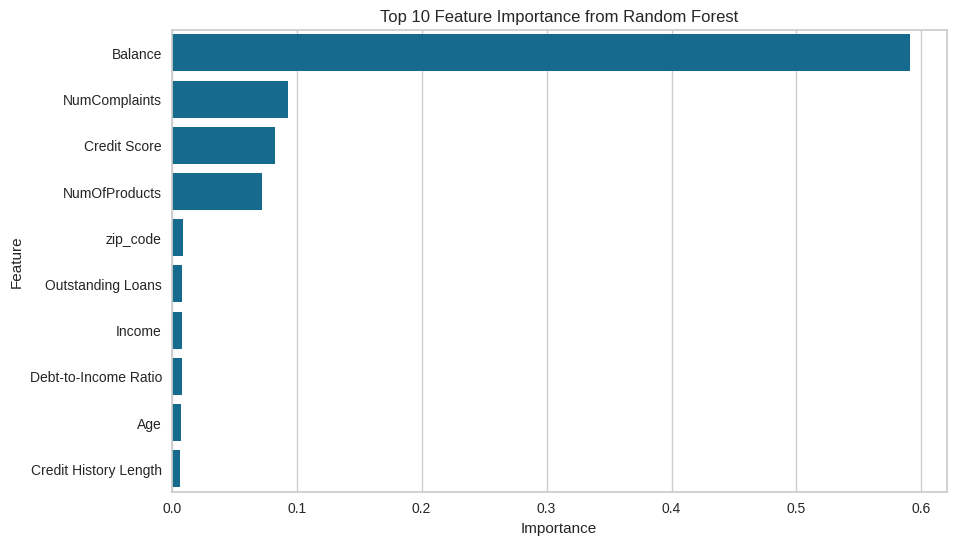

In [ ]:
# prompt: top 10 features importance

import matplotlib.pyplot as plt
# Assuming 'feature_importance_df' is defined as in the provided code.

# Get the top 10 features
top_10_features = feature_importance_df.head(10)
top_4_features = feature_importance_df.head(4)

# Plot the top 10 features
plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=top_10_features)
plt.title('Top 10 Feature Importance from Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [ ]:
# prompt: read the column 'feature' values

# Assuming 'feature_importance_df' is defined as in the provided code.

# Access the 'feature' column values
importance_feature_clustering = top_4_features['feature'].values

# Print the feature values
importance_feature_clustering


array(['Balance', 'NumComplaints', 'Credit Score', 'NumOfProducts'],
      dtype=object)

## <font color=#FFA559> **4.9. Confusion Matrix**</font>

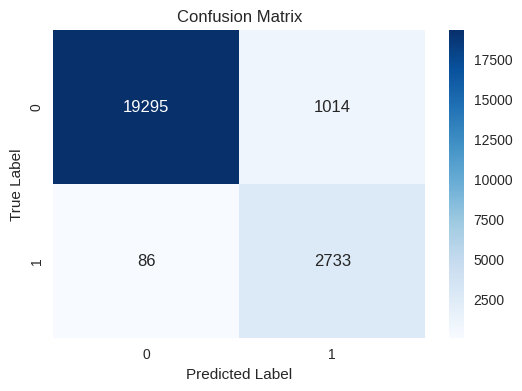

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred_best)

# Visualize the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()

## <font color=#FFA559>**4.10. ROC AUC Curve**</font>

ROC AUC Score: 0.9926132560908772


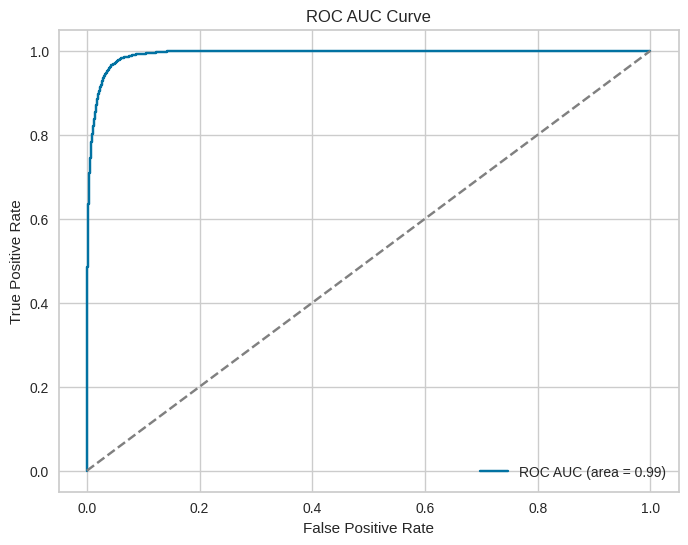

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve

# Obtain predicted probabilities for the positive class
y_proba = best_rf.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_proba)
print("ROC AUC Score:", roc_auc)

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC AUC (area = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC AUC Curve")
plt.legend()
plt.show()


## <font color=#FFA559>**4.11. (Optional) Model Interpretability `SHAP for Feature Interpretation`**</font>

In [ ]:
import shap

# Create a SHAP explainer object using the tree-based model
explainer = shap.TreeExplainer(best_rf)
shap_values = explainer.shap_values(X_test)

# Plot a SHAP summary plot for the positive class (index 1 for binary classification)
shap.summary_plot(shap_values[1], X_test, plot_type="bar")


## <font color=#FFA559>**4.12. Building a Model Pipeline and Deployment Considerations**</font>

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Define a simple pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),  # Ensures missing values are handled
    ('scaler', StandardScaler()),  # Optional: helps some algorithms perform better
    ('classifier', best_rf)
])

# We can now train the pipeline directly
pipeline.fit(X_train, y_train)

# And use it to predict on new data
y_pipeline_pred = pipeline.predict(X_test)


## <font color=#FFA559>**4.13. Predicting and Calculating Probabilities**</font>

In [ ]:
y_proba = pipeline.predict_proba(X_test)[:, 1]  # Probability of class '1' (Churn)

# Display the first 10 probability predictions
print("Predicted probabilities for the positive class (Churn):")
print(y_proba[:10])


Predicted probabilities for the positive class (Churn):
[0.13649704 0.66639026 0.05741792 0.18463377 0.30873127 0.21363816
 0.20537105 0.22764158 0.2002593  0.29169174]


## <font color=#FFA559>**4.14. Implementation using dataset**</font>

In [ ]:
df_unchurn = df.copy()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

df_encoded_unchurn = pd.get_dummies(df_unchurn, drop_first=True)

# Align the columns of the new data with the training data
# This ensures the columns are in the same order
df_encoded_unchurn = df_encoded_unchurn.reindex(columns=X.columns, fill_value=0)


# Make predictions on the entire unchurn data using the pipeline.
unchurn_predictions = pipeline.predict(df_encoded_unchurn)
unchurn_probabilities = pipeline.predict_proba(df_encoded_unchurn)[:, 1] # Probability of class '1' (Churn)


# Add the predictions and probabilities to the original DataFrame
df['Predicted Churn'] = unchurn_predictions
df['Churn Probability'] = unchurn_probabilities

print(df.head()) # display the first few rows of the updated data



   Gender Marital Status  Number of Dependents  \
0    Male       Divorced                     3   
1  Female        Married                     1   
2  Female         Single                     1   
3  Female       Divorced                     5   
4  Female       Divorced                     2   

                        Occupation    Income Education Level  Customer Tenure  \
0      Information systems manager  77710.14     High School               30   
1               Charity fundraiser  58209.87     High School               27   
2  Television production assistant   9794.01     High School               14   
3            Agricultural engineer  15088.98     High School               23   
4         Teacher, early years/pre  60726.56        Master's               22   

  Customer Segment Preferred Communication Channel  Credit Score  ...  \
0           Retail                           Phone           397  ...   
1              SME                           Email           665  

In [ ]:
filtered_df = df[(df['Predicted Churn'] == 1) & (df['Churn Flag'] == 0)].copy()

filtered_df


,Gender,Marital Status,Number of Dependents,Occupation,Income,Education Level,Customer Tenure,Customer Segment,Preferred Communication Channel,Credit Score,...,NumOfProducts,NumComplaints,Age,Debt-to-Income Ratio,Tenure Category,Occupation Category,zip_code,state,Predicted Churn,Churn Probability
45,Male,Divorced,2,Restaurant manager,23819.57,Diploma,27,Corporate,Email,850,...,3,7,47,0.548103,Lifetime,Retail and Customer Service,84553,AE,1,0.505029
216,Female,Divorced,4,"Doctor, general practice",94053.63,Bachelor's,14,Corporate,Email,469,...,1,3,26,0.474633,Veteran,Healthcare and Medicine,44842,CO,1,0.560650
218,Female,Single,5,Ship broker,34568.13,Master's,29,Retail,Email,841,...,2,9,76,0.202302,Lifetime,Transportation and Logistics,51512,AA,1,0.568981
254,Female,Divorced,5,Broadcast engineer,34974.08,Bachelor's,14,SME,Email,810,...,2,4,50,0.848175,Veteran,Engineering and Technology,94983,IL,1,0.500102
321,Female,Single,4,Commercial/residential surveyor,84354.95,Diploma,8,SME,Phone,577,...,5,5,64,0.223649,Loyal,Business and Management,89375,GU,1,0.519869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115578,Female,Married,4,"Production designer, theatre/television/film",90831.72,Diploma,4,SME,Phone,537,...,2,0,29,0.219557,Established,Business and Management,10423,PA,1,0.597715
115584,Male,Divorced,2,Training and development officer,73514.60,Master's,26,SME,Phone,731,...,3,6,39,0.623342,Lifetime,Education and Training,85583,SC,1,0.573556
115585,Male,Married,3,Illustrator,88675.07,Diploma,8,Retail,Phone,634,...,5,8,52,0.289219,Loyal,Creative Arts and Design,77769,AE,1,0.534014
115609,Male,Married,4,Visual merchandiser,53050.12,Master's,18,Corporate,Email,598,...,3,6,31,0.312825,Veteran,Retail and Customer Service,45333,VI,1,0.501649


## <font color=#FFA559>**4.15. Save the predicted data**</font>

In [ ]:
data = data_original.copy()

In [ ]:
column_churn = list(set(df.columns) - set(data.columns))

In [ ]:
data[column_churn] = df[column_churn]

In [ ]:
data.to_csv('Bank_Bostwana_predicted_Churn.csv', index=False)

In [ ]:
data

,CustomerId,Surname,First Name,Date of Birth,Gender,Marital Status,Number of Dependents,Occupation,Income,Education Level,...,NumOfProducts,NumComplaints,Age,Debt-to-Income Ratio,Tenure Category,Occupation Category,zip_code,state,Predicted Churn,Churn Probability
0,83ef0b54-35f6-4f84-af58-5653ac0c0dc4,Smith,Troy,1987-08-29,Male,Divorced,3,Information systems manager,77710.14,High School,...,1,0,37,0.539952,Lifetime,Engineering and Technology,14852,VI,0,0.182096
1,009f115a-e5ca-4cf4-97d6-530140545e4e,Sullivan,Katrina,2000-02-07,Female,Married,1,Charity fundraiser,58209.87,High School,...,4,1,25,0.153181,Lifetime,Business and Management,75805,RI,0,0.205163
2,66309fd3-5009-44d3-a3f7-1657c869d573,Fuller,Henry,1954-02-03,Female,Single,1,Television production assistant,9794.01,High School,...,2,6,71,4.418062,Veteran,Creative Arts and Design,69279,MH,0,0.149905
3,b02a30df-1a5f-4087-8075-2a35432da641,Young,Antonio,1991-01-15,Female,Divorced,5,Agricultural engineer,15088.98,High School,...,1,0,34,1.185478,Lifetime,Engineering and Technology,71940,AE,0,0.086010
4,0d932e5b-bb3a-4104-8c83-f84270f7f2ea,Andersen,John,1992-04-08,Female,Divorced,2,"Teacher, early years/pre",60726.56,Master's,...,5,6,32,0.538263,Lifetime,Education and Training,98290,MN,0,0.369375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115635,b4ef7eba-1a9e-4956-b827-50037a1087d5,Russell,Gregory,1965-03-09,Male,Divorced,2,Chemical engineer,15704.15,Diploma,...,2,7,60,1.679193,Loyal,Engineering and Technology,82178,MS,1,0.867211
115636,578e6b99-b42a-4af1-afb4-fd570ea0721f,Ramirez,Thomas,1955-01-10,Female,Single,3,Chartered legal executive (England and Wales),75792.62,High School,...,4,7,70,0.478010,Loyal,Business and Management,52386,OH,1,0.544537
115637,73a64c22-da8f-4c3e-8f62-d92f03636a1e,Clark,Tonya,1955-08-29,Male,Married,4,Field trials officer,30142.28,Diploma,...,1,4,69,0.213682,Lifetime,Science and Research,41106,GU,0,0.119944
115638,00affc66-75c4-43c4-9019-f28c434b5012,Stewart,Lisa,1992-12-27,Female,Married,0,Legal secretary,58636.06,High School,...,5,6,32,0.097893,Lifetime,Business and Management,2190,KS,0,0.127768


## <font color=#FFA559>**4.16. Memory Check**</font>

In [ ]:
!pip install psutil

In [ ]:
import psutil

print(f"Memory used: {psutil.virtual_memory().used / (1024**2):.2f} MB")
print(f"Available memory: {psutil.virtual_memory().available / (1024**2):.2f} MB")

Memory used: 3151.46 MB
Available memory: 9504.18 MB


# <font color=#FFE6C7>**5. K-Means no PCA (Financial Cluster & Customer Activity)**</font>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Load dataset
df = pd.read_csv('Bank_Bostwana_predicted_Churn.csv')
data_original = df.copy()

<font color=#ff9700>Segmentation Approach</font>
We have **multiple numerical and categorical features** like:  
✅ **Financial features**: Income, Balance, Outstanding Loans, Debt-to-Income Ratio  
✅ **Customer activity**: Customer Tenure, NumOfProducts, NumComplaints, Credit History Length  
✅ **Feature Importances** : Balance, NumComplaints, Credit Score, NumOfProducts

To segment customers:  
1. **Feature Selection** -> Using relevant features for segmentation.  
2. **Scaling** -> Standardizing numerical variables.  
3. **K-Means Clustering** -> A popular technique for customer segmentation.  
4. **Analyzing Segments** -> Interpreting the characteristics of each cluster.  


## <font color=#FFA559>**5.1. Understand the Data**</font>

In [ ]:
if 'data' in locals():
    del data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 31 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   CustomerId                       115640 non-null  object 
 1   Surname                          115640 non-null  object 
 2   First Name                       115640 non-null  object 
 3   Date of Birth                    115640 non-null  object 
 4   Gender                           115640 non-null  object 
 5   Marital Status                   115640 non-null  object 
 6   Number of Dependents             115640 non-null  int64  
 7   Occupation                       115640 non-null  object 
 8   Income                           115640 non-null  float64
 9   Education Level                  115640 non-null  object 
 10  Contact Information              115640 non-null  object 
 11  Customer Tenure                  115640 non-null  int64  
 12  Cu

## <font color=#FFA559>**5.2. Feature Selection**</font>

In [ ]:
financial_features = ["Income", "Balance", "Outstanding Loans", "Debt-to-Income Ratio"]
activity_features = ["Customer Tenure", "NumOfProducts", "NumComplaints", "Credit History Length"]
importance_feature_clustering = ['Balance', 'NumComplaints', 'Credit Score', 'NumOfProducts']

## <font color=#FFA559>**5.3. Data Scaler**</font>

In [ ]:
scaler = StandardScaler()

df_financial_scaled = scaler.fit_transform(df[financial_features])
df_activity_scaled = scaler.fit_transform(df[activity_features])
df_importance_features = scaler.fit_transform(df[importance_feature_clustering])

In [ ]:
all_features = financial_features + activity_features + list(importance_feature_clustering)
complete_features = list(set(all_features))
complete_features

['NumOfProducts',
 'Income',
 'Credit Score',
 'Credit History Length',
 'Outstanding Loans',
 'Customer Tenure',
 'NumComplaints',
 'Debt-to-Income Ratio',
 'Balance']

In [ ]:
ss_scaler = StandardScaler()

ss_scaler.fit(df[complete_features])
df_ss = pd.DataFrame(
    ss_scaler.transform(df[complete_features]),
    columns=complete_features,
    index=df.index
)


In [ ]:
data_original.isna().sum()

,0
CustomerId,0
Surname,0
First Name,0
Date of Birth,0
Gender,0
Marital Status,0
Number of Dependents,0
Occupation,0
Income,0
Education Level,0


In [ ]:
# prompt: how to handle null datetype data

import pandas as pd

# Assuming your DataFrame is named 'df'
# Replace 'your_date_column' with the actual name of your date column

# Method 1: Convert to datetime and handle NaT (Not a Time) values
df['your_date_column'] = pd.to_datetime(df['your_date_column'], errors='coerce')
# Now NaT values represent missing dates
# You can further replace them with a specific date or drop the rows

# Example: Replace NaT with a specific date (e.g., 1900-01-01)
df['your_date_column'] = df['your_date_column'].fillna(pd.to_datetime('1900-01-01'))

# Example: Drop rows where the date is missing
df.dropna(subset=['your_date_column'], inplace=True)

# Method 2: If your dates are strings and you want to replace Null values with a string
df['your_date_column'].fillna('Null Date', inplace=True) # Replace 'Null Date' with the string you prefer.

# Method 3: If you have other nulls that are actually strings (e.g., "None" or "N/A")

# Replace various string representations of nulls with pd.NA
null_strings = ["None", "N/A", " ", "NULL"] # Add more as needed
df['your_date_column'] = df['your_date_column'].replace(null_strings, pd.NA)

# convert to datetime after replacing nulls
df['your_date_column'] = pd.to_datetime(df['your_date_column'], errors='coerce')
# fill missing values
df['your_date_column'] = df['your_date_column'].fillna(pd.to_datetime('1900-01-01'))
# or drop rows
df.dropna(subset=['your_date_column'], inplace=True)


# After handling nulls, you might want to convert the column to a specific data type
# Example: Converting to datetime if the column is expected to hold dates
# df['your_date_column'] = pd.to_datetime(df['your_date_column'], format='%Y-%m-%d') # Modify the format if needed




## <font color=#FFA559>**5.4. Find Optimal K**</font>

### <font color=#FF6000>**5.4.1. Option 1**</font>

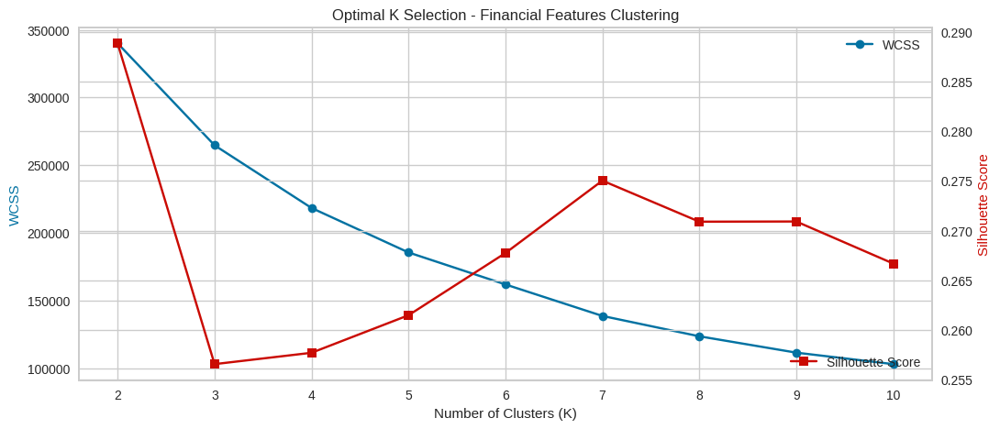

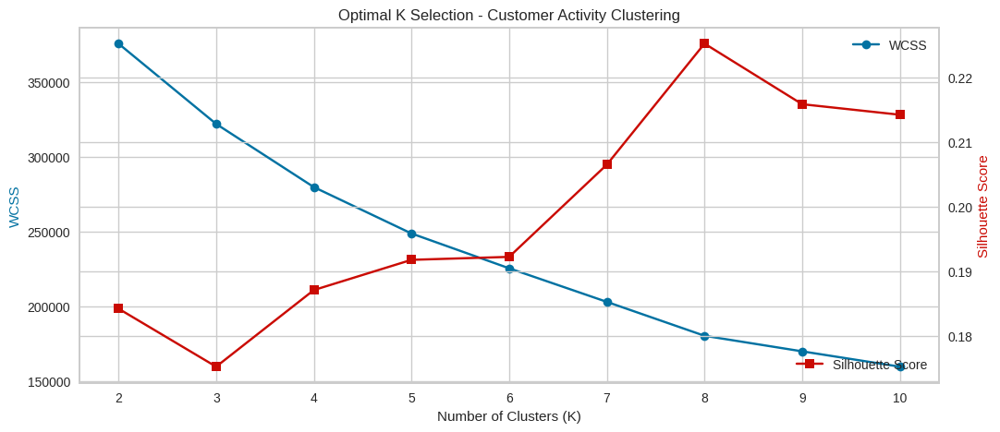

In [ ]:
def find_optimal_k(data, title):
    wcss = []
    silhouette_scores = []
    k_range = range(2, 11)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(data)
        wcss.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data, labels))

    fig, ax1 = plt.subplots(figsize=(12, 5))
    ax2 = ax1.twinx()

    ax1.plot(k_range, wcss, marker='o', linestyle='-', color='b', label='WCSS')
    ax2.plot(k_range, silhouette_scores, marker='s', linestyle='-', color='r', label='Silhouette Score')

    ax1.set_xlabel("Number of Clusters (K)")
    ax1.set_ylabel("WCSS", color='b')
    ax2.set_ylabel("Silhouette Score", color='r')
    plt.title(f"Optimal K Selection - {title}")

    ax1.legend(loc='upper right')
    ax2.legend(loc='lower right')
    plt.show()

find_optimal_k(df_financial_scaled, "Financial Features Clustering")

find_optimal_k(df_activity_scaled, "Customer Activity Clustering")

### <font color=#FF6000>**5.4.2. Option 2**</font>

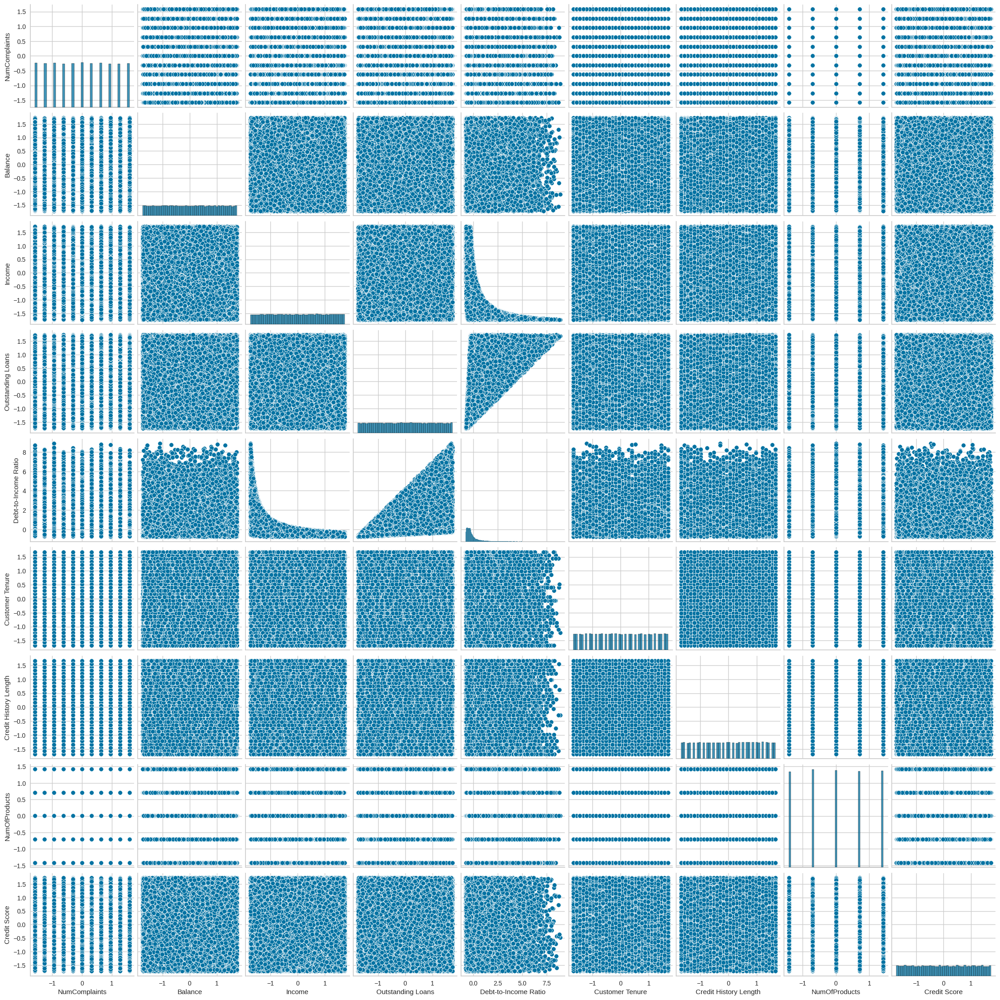

In [ ]:
sns.pairplot(df_ss)

#### **1. Financial Features**

In [ ]:
distortions_ff = []
K = range(1, 11)
for n_clusters in K:
  model = KMeans(n_clusters, random_state=1000, n_init='auto')
  df_ss_imputed_ff = df_ss[financial_features].fillna(df_ss[financial_features].mean())
  model.fit(df_ss_imputed_ff)
  distortions_ff.append(model.inertia_)

  print(f'For Financial Features k = {n_clusters}, distortion = {model.inertia_}')

For Financial Features k = 1, distortion = 282816.9999999986
For Financial Features k = 2, distortion = 208446.99267517868
For Financial Features k = 3, distortion = 162275.77901020276
For Financial Features k = 4, distortion = 136020.50812021305
For Financial Features k = 5, distortion = 113492.28422276392
For Financial Features k = 6, distortion = 99251.4538360239
For Financial Features k = 7, distortion = 84924.49406575963
For Financial Features k = 8, distortion = 75656.26167371418
For Financial Features k = 9, distortion = 68299.94579397293
For Financial Features k = 10, distortion = 62970.753347595426


<Figure size 1600x800 with 0 Axes>

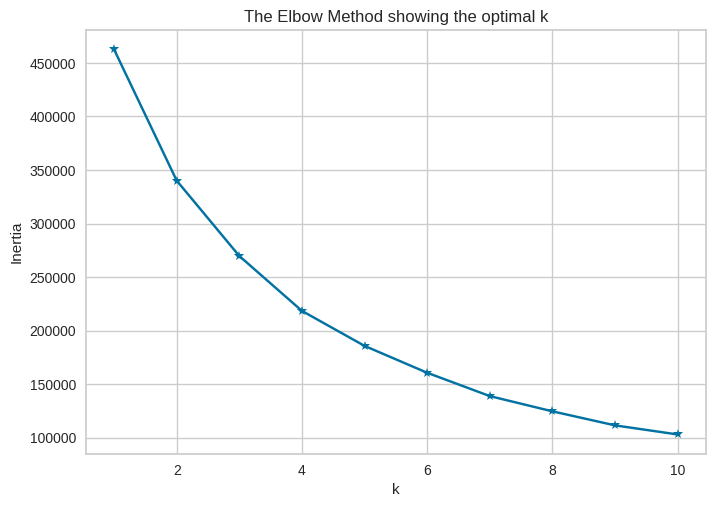

In [ ]:
plt.figure(figsize=(16, 8))
plt.figure()
plt.plot(K, distortions_ff, 'b*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

For k=2, the average silhouette score is 0.2888563688030399
For k=3, the average silhouette score is 0.24807085412556407
For k=4, the average silhouette score is 0.2576885463800329
For k=5, the average silhouette score is 0.26438032226892216
For k=6, the average silhouette score is 0.2579280224355586
For k=7, the average silhouette score is 0.27367145436479934
For k=8, the average silhouette score is 0.2728098503519099
For k=9, the average silhouette score is 0.2709481119909387
For k=10, the average silhouette score is 0.2668242866369216


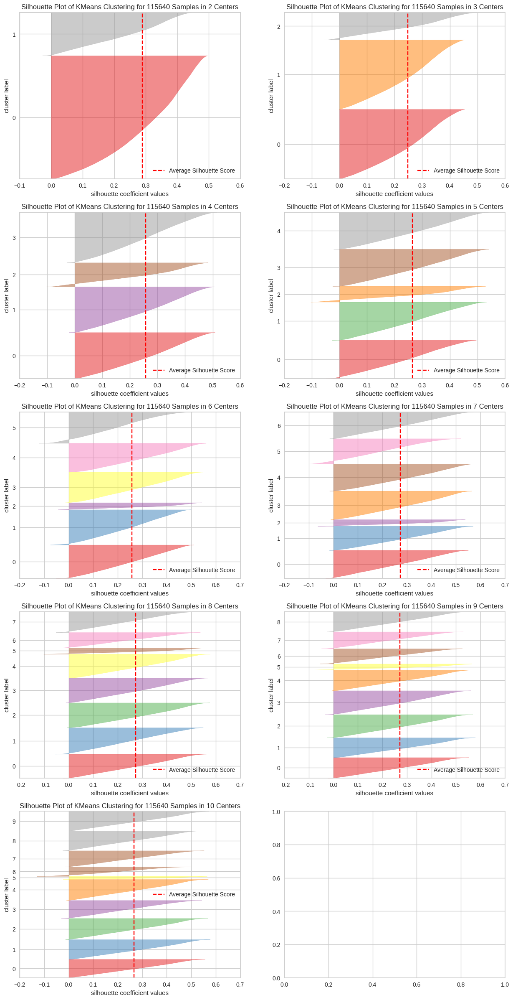

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
import numpy as np
import matplotlib.pyplot as plt

K = range(2, 11)
max_K = max(K)
fig, ax = plt.subplots(int(np.ceil(max_K / 2)), 2, figsize=(15, 30))

for n_clusters in K:
    model = KMeans(n_clusters, random_state=1000, n_init='auto')

    df_ss_imputed_ff = df_ss[financial_features].fillna(df_ss[financial_features].mean())
    df_ss_imputed_ff.columns = financial_features
    model.fit(df_ss_imputed_ff.values)

    q, mod = divmod(n_clusters, 2)
    sil = SilhouetteVisualizer(model, is_fitted=True, ax=ax[q - 1][mod])
    sil.fit(df_ss_imputed_ff.values)
    sil.finalize()

    print(f"For Financial Features k={n_clusters}, the average silhouette score is {sil.silhouette_score_}")

#### **2. Activity Features**

In [ ]:
distortions_ac = []
K = range(1, 11)
for n_clusters in K:
  model = KMeans(n_clusters, random_state=1000, n_init='auto')

  df_ss_imputed_ac = df_ss[activity_features].fillna(df_ss[activity_features].mean())
  model.fit(df_ss_imputed_ac)
  distortions_ac.append(model.inertia_)

  print(f'For Activity Features k = {n_clusters}, distortion = {model.inertia_}')

For Activity Features k = 1, distortion = 462560.00000000274
For Activity Features k = 2, distortion = 375723.292503657
For Activity Features k = 3, distortion = 322167.33115343103
For Activity Features k = 4, distortion = 281076.78090039425
For Activity Features k = 5, distortion = 248916.49874442592
For Activity Features k = 6, distortion = 225787.58068167075
For Activity Features k = 7, distortion = 203160.6172694435
For Activity Features k = 8, distortion = 180999.3680552114
For Activity Features k = 9, distortion = 170553.25887590018
For Activity Features k = 10, distortion = 161171.3211520022


<Figure size 1600x800 with 0 Axes>

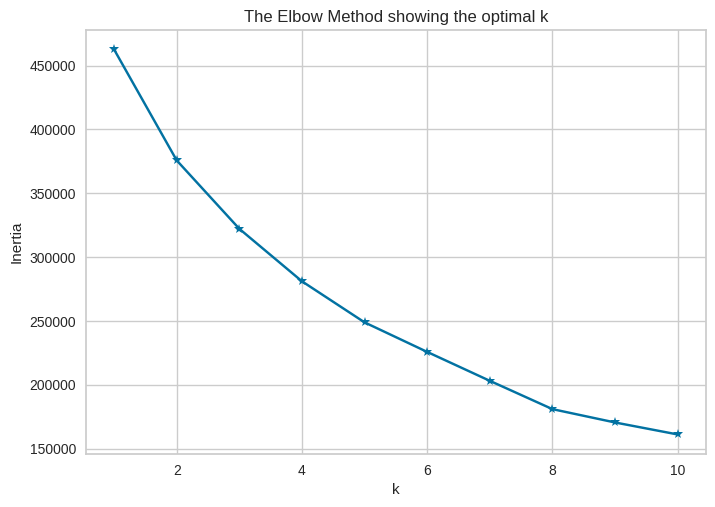

In [ ]:
plt.figure(figsize=(16, 8))
plt.figure()
plt.plot(K, distortions_ac, 'b*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

For Activity Features k=2, the average silhouette score is 0.1842623783135502
For Activity Features k=3, the average silhouette score is 0.1750873108965607
For Activity Features k=4, the average silhouette score is 0.1846591604621233
For Activity Features k=5, the average silhouette score is 0.1903118936348066
For Activity Features k=6, the average silhouette score is 0.19215345140504816
For Activity Features k=7, the average silhouette score is 0.2068076766109548
For Activity Features k=8, the average silhouette score is 0.22422887341989853
For Activity Features k=9, the average silhouette score is 0.21520732889029365
For Activity Features k=10, the average silhouette score is 0.206810879090748


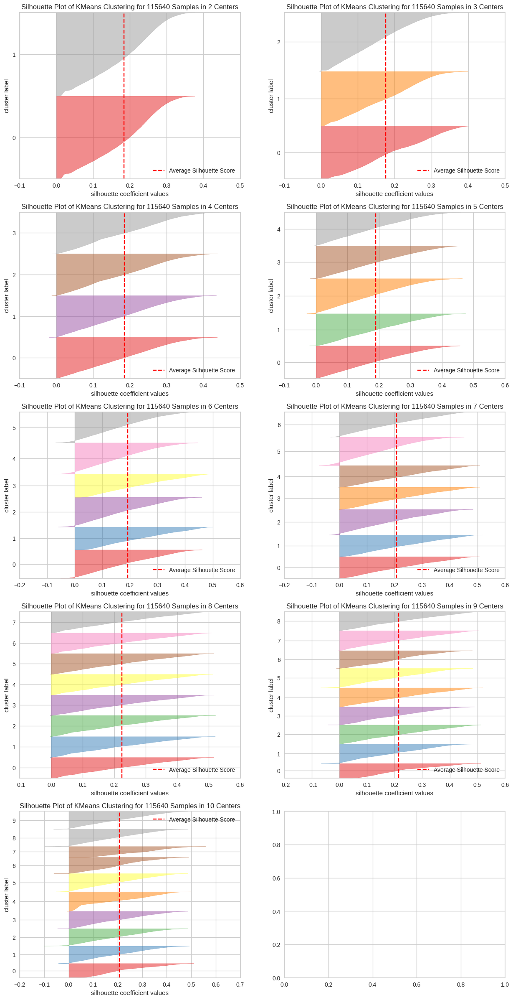

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
import numpy as np
import matplotlib.pyplot as plt

K = range(2, 11)
max_K = max(K)
fig, ax = plt.subplots(int(np.ceil(max_K / 2)), 2, figsize=(15, 30))

for n_clusters in K:
    model = KMeans(n_clusters, random_state=1000, n_init='auto')

    df_ss_imputed_ac = df_ss[activity_features].fillna(df_ss[activity_features].mean())
    df_ss_imputed_ac.columns = activity_features
    model.fit(df_ss_imputed_ac.values)

    q, mod = divmod(n_clusters, 2)

    sil = SilhouetteVisualizer(model, is_fitted=True, ax=ax[q - 1][mod])
    sil.fit(df_ss_imputed_ac.values)
    sil.finalize()

    print(f"For Activity Features k={n_clusters}, the average silhouette score is {sil.silhouette_score_}")

#### **3. Importances Features From Predicted Model**

In [ ]:
distortions_if = []
K = range(1, 11)
for n_clusters in K:
  model = KMeans(n_clusters, random_state=1000, n_init='auto')

  df_ss_imputed_if = df_ss[importance_feature_clustering].fillna(df_ss[importance_feature_clustering].mean())
  model.fit(df_ss_imputed_if)
  distortions_if.append(model.inertia_)

  print(f'For Activity Features k = {n_clusters}, distortion = {model.inertia_}')

For Activity Features k = 1, distortion = 462559.999999997
For Activity Features k = 2, distortion = 375809.508143721
For Activity Features k = 3, distortion = 323097.5991051536
For Activity Features k = 4, distortion = 281166.2450748014
For Activity Features k = 5, distortion = 249544.54639942283
For Activity Features k = 6, distortion = 226788.55778438714
For Activity Features k = 7, distortion = 203777.44526463372
For Activity Features k = 8, distortion = 180461.0827347132
For Activity Features k = 9, distortion = 170168.11018800392
For Activity Features k = 10, distortion = 160535.87389967582


<Figure size 1600x800 with 0 Axes>

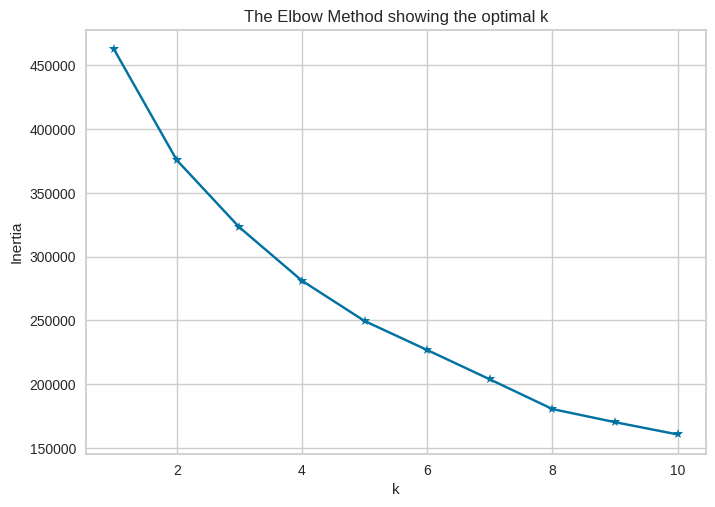

In [ ]:
plt.figure(figsize=(16, 8))
plt.figure()
plt.plot(K, distortions_if, 'b*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

For Activity Features k=2, the average silhouette score is 0.18398007357914647
For Activity Features k=3, the average silhouette score is 0.17277406331709438
For Activity Features k=4, the average silhouette score is 0.1842546963342536
For Activity Features k=5, the average silhouette score is 0.19268182737610634
For Activity Features k=6, the average silhouette score is 0.19146694865386904
For Activity Features k=7, the average silhouette score is 0.20600068073559705
For Activity Features k=8, the average silhouette score is 0.22584534832642617
For Activity Features k=9, the average silhouette score is 0.21623023448333897
For Activity Features k=10, the average silhouette score is 0.20901547745982693


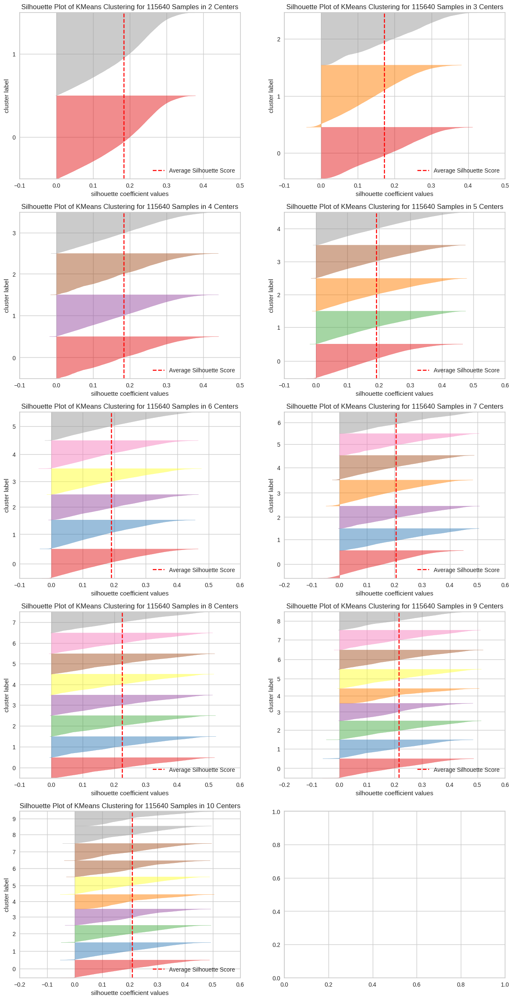

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
import numpy as np
import matplotlib.pyplot as plt

K = range(2, 11)
max_K = max(K)
fig, ax = plt.subplots(int(np.ceil(max_K / 2)), 2, figsize=(15, 30))

for n_clusters in K:
    model = KMeans(n_clusters, random_state=1000, n_init='auto')

    df_ss_imputed_if = df_ss[importance_feature_clustering].fillna(df_ss[importance_feature_clustering].mean())
    df_ss_imputed_if.columns = importance_feature_clustering
    model.fit(df_ss_imputed_if.values)

    q, mod = divmod(n_clusters, 2)

    sil = SilhouetteVisualizer(model, is_fitted=True, ax=ax[q - 1][mod])
    sil.fit(df_ss_imputed_if.values)
    sil.finalize()

    print(f"For Importance Features k={n_clusters}, the average silhouette score is {sil.silhouette_score_}")

## <font color=#FFA559>**5.5. Apply KMeans**</font>

### <font color=#FF6000>**5.5.1. Financial Cluster=6 | Activity Cluster=6**</font>

In [ ]:
df66 = df.copy()

k_financial = 6
k_activity = 6

kmeans_financial = KMeans(n_clusters=k_financial, random_state=42, n_init=10)
kmeans_activity = KMeans(n_clusters=k_activity, random_state=42, n_init=10)

df66['Financial Cluster'] = kmeans_financial.fit_predict(df_financial_scaled)
df66['Activity Cluster'] = kmeans_activity.fit_predict(df_activity_scaled)

# Visualize Clusters
sns.pairplot(df66, hue="Financial Cluster", vars=financial_features, palette='viridis')
plt.suptitle("Financial Clusters Visualization", y=1.02)
plt.show()

sns.pairplot(df66, hue="Activity Cluster", vars=activity_features, palette='coolwarm')
plt.suptitle("Activity Clusters Visualization", y=1.02)
plt.show()

In [ ]:
df66

<h2><strong>Cluster Naming & Marking for Financial and Activity Segmentation</strong></h2>

---

**1. Financial Cluster Naming**  

| **Cluster** | **Name/Title** | **Profile Summary** |
|------------|---------------|-----------------|
| **Cluster 0** | 🟣 **"Emerging Earners"** | Low-income individuals with minimal financial assets and loans, likely students or early-career professionals. |
| **Cluster 1** | 🔵 **"Stable Builders"** | Moderate-income customers with average savings and debt, financially stable but not affluent. |
| **Cluster 2** | 🟢 **"High-Spenders with Debt"** | Mid-to-high income earners with substantial outstanding loans, potentially in financial stress. |
| **Cluster 3** | 🔷 **"Debt-Burdened"** | Customers with high debt-to-income ratios, requiring financial restructuring or advisory services. |
| **Cluster 4** | 🟡 **"Affluent Savers"** | High-income customers with strong financial stability, low debt, and high balance. |
| **Cluster 5** | 🟠 **"Wealthy Elite"** | Very high-income individuals with significant financial assets and minimal debt concerns, prime targets for premium banking. |

---
---

**2. Activity Cluster Naming**  

| **Cluster** | **Name/Title** | **Profile Summary** |
|------------|---------------|-----------------|
| **Cluster 0** | 🔵 **"Newcomers"** | Short-tenure customers with low engagement, requiring better onboarding and education on products. |
| **Cluster 1** | 🟠 **"Skeptical Starters"** | New customers with moderate product adoption but some complaints, needing retention strategies. |
| **Cluster 2** | 🟢 **"Engaged Users"** | Medium-tenure customers with a balanced product portfolio and minimal complaints. |
| **Cluster 3** | 🔴 **"Dissatisfied Users"** | Customers with moderate engagement but frequent complaints, at risk of churn. |
| **Cluster 4** | 🟣 **"Loyal Advocates"** | Long-tenure customers with multiple products and high satisfaction, ideal for referrals. |
| **Cluster 5** | 🔺 **"High-Tenure but Unhappy"** | Long-term customers with high complaints, needing proactive issue resolution to prevent churn. |

---

#### **1. Define the label**

##### **A. For Financial Cluster & For Activity Cluster**

In [ ]:
# Define the dataset (financial_cluster, activity_cluster)
data = [(i, j) for i in range(6) for j in range(6)]

# Convert data to DataFrame
df66 = df66[['CustomerId', 'Financial Cluster', 'Activity Cluster']]

# Define the financial cluster labels
financial_clusters = {
    0: {"label": "Emerging Earners", "explanation": "Low-income individuals with minimal financial assets and loans, likely students or early-career professionals."},
    1: {"label": "Stable Builders", "explanation": "Moderate-income customers with average savings and debt, financially stable but not affluent."},
    2: {"label": "High-Spenders with Debt", "explanation": "Mid-to-high income earners with substantial outstanding loans, potentially in financial stress."},
    3: {"label": "Debt-Burdened", "explanation": "Customers with high debt-to-income ratios, requiring financial restructuring or advisory services."},
    4: {"label": "Affluent Savers", "explanation": "High-income customers with strong financial stability, low debt, and high balance."},
    5: {"label": "Wealthy Elite", "explanation": "Very high-income individuals with significant financial assets and minimal debt concerns, prime targets for premium banking."}
}

# Define the activity cluster labels
activity_clusters = {
    0: {"label": "Newcomers", "explanation": "Short-tenure customers with low engagement, requiring better onboarding and education on products."},
    1: {"label": "Skeptical Starters", "explanation": "New customers with moderate product adoption but some complaints, needing retention strategies."},
    2: {"label": "Engaged Users", "explanation": "Medium-tenure customers with a balanced product portfolio and minimal complaints."},
    3: {"label": "Dissatisfied Users", "explanation": "Customers with moderate engagement but frequent complaints, at risk of churn."},
    4: {"label": "Loyal Advocates", "explanation": "Long-tenure customers with multiple products and high satisfaction, ideal for referrals."},
    5: {"label": "High-Tenure but Unhappy", "explanation": "Long-term customers with high complaints, needing proactive issue resolution to prevent churn."}
}

# Map the financial and activity clusters to labels and explanations
df66['Financial Label'] = df66['Financial Cluster'].map(lambda x: financial_clusters[x]['label'])
df66['Financial Explanation'] = df66['Financial Cluster'].map(lambda x: financial_clusters[x]['explanation'])
df66['Activity Label'] = df66['Activity Cluster'].map(lambda x: activity_clusters[x]['label'])
df66['Activity Explanation'] = df66['Activity Cluster'].map(lambda x: activity_clusters[x]['explanation'])

# Create a combined cluster label
df66['Cluster Label'] = df66['Financial Label'] + " | " + df66['Activity Label']
df66['Cluster Explanation'] = df66['Financial Explanation'] + " " + df66['Activity Explanation']


<ipython-input-190-eded8d3de46c>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Financial Label'] = df['Financial Cluster'].map(lambda x: financial_clusters[x]['label'])
<ipython-input-190-eded8d3de46c>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Financial Explanation'] = df['Financial Cluster'].map(lambda x: financial_clusters[x]['explanation'])
<ipython-input-190-eded8d3de46c>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

###### *A1. Detailed breakdown of insights and recommendations*

Below is a detailed breakdown of insights and recommendations for each individual cluster (both Activity and Financial) and for key combined segments. This can help us tailor strategies based on customer behavior and financial profiles.

---

 I. Activity Cluster Insights

 **Activity Cluster 0**  
- **Profile:**  
  - Moderate engagement with an average of about 3.2 products per customer.  
  - Churn rates are generally low (0.0–0.12), except for a slightly higher value when paired with certain Financial Clusters (e.g., 0.118 with FC3).  
  - Complaints are low (≈2.1 per customer).  
- **Recommendations:**  
  - **Upsell/Cross-Sell:** For customers paired with stable financial groups (e.g., FC1 or FC4 with 0% churn), consider offering additional products or premium services.  
  - **Monitoring:** For the few combinations showing slightly higher churn (e.g., with FC3), keep an eye on customer feedback and address any emerging issues promptly.

---

 **Activity Cluster 1**  
- **Profile:**  
  - Lower product adoption (~1.62–1.65 products per customer).  
  - High complaint levels (≈5.3 on average).  
  - Churn is highly variable—very high (around 40%) when paired with riskier Financial Clusters (FC0 and FC3) but 0% when paired with FC1 and FC4.  
- **Recommendations:**  
  - **Retention Focus:** For AC1 customers in FC0 or FC3, deploy aggressive retention measures, such as personalized outreach, proactive service recovery, and perhaps financial counseling.  
  - **Growth Opportunity:** For AC1 customers with FC1/FC4, work on increasing product penetration through cross-sell opportunities since these segments are stable.

---

 **Activity Cluster 2**  
- **Profile:**  
  - High product usage (~4.1 products on average).  
  - Low complaint levels (≈2.3).  
  - Churn remains very low (0.0–0.06) across all financial clusters.  
- **Recommendations:**  
  - **Engagement and Expansion:** These are the core, highly engaged customers. They’re ideal for upselling and bundling additional products, as they already have deep relationships with the offerings.  
  - **Loyalty Programs:** Consider loyalty incentives to further cement their satisfaction and drive referrals.

---

 **Activity Cluster 3**  
- **Profile:**  
  - High product adoption (≈4.15 products).  
  - However, they also register high complaints (≈7.4 per customer).  
  - Churn is moderate but increases (≈25–26%) when combined with riskier financial segments (e.g., FC0 and FC3) and is near zero with FC1/FC4.  
- **Recommendations:**  
  - **Service Improvement:** Address the underlying causes for the high number of complaints—this may involve reviewing customer service protocols or improving product support.  
  - **Retention Programs:** For the riskier combinations, proactive retention initiatives (e.g., targeted support and issue resolution) can reduce churn.

---

 **Activity Cluster 4**  
- **Profile:**  
  - Moderate product adoption (~3.38 products).  
  - Very high complaint levels (≈8 complaints).  
  - Churn is significantly high (≈36–38%) when paired with FC0 or FC3, yet 0% with FC1/FC4.  
- **Recommendations:**  
  - **Immediate Remediation:** For segments with high churn, focus on resolving customer grievances through enhanced support and tailored retention strategies.  
  - **Upsell Opportunity:** For AC4 customers in stable financial clusters, consider product expansion opportunities while simultaneously reducing complaints.

---

 **Activity Cluster 5**  
- **Profile:**  
  - Lower product adoption (~1.78 products).  
  - Moderate complaint levels (≈4.6).  
  - Churn is high (≈35%) when paired with FC0 or FC3, but 0% with FC1/FC4.  
- **Recommendations:**  
  - **Increase Engagement:** For those at risk (in FC0/FC3), introduce initiatives to boost product adoption and improve customer experience.  
  - **Cross-Sell:** For stable combinations, work on deepening relationships by introducing complementary products and services.

---

 II. Financial Cluster Insights

 **Financial Cluster 0**  
- **Profile:**  
  - Moderate incomes (~64k) and a debt-to-income ratio around 0.68.  
  - Churn varies widely by activity cluster: very high (≈35–40%) when paired with AC1, AC4, and AC5, but lower when paired with AC0 or AC2.  
- **Recommendations:**  
  - **Risk Mitigation:** For high-churn combinations, implement targeted retention strategies such as personalized financial counseling and service improvements.  
  - **Tailored Product Offerings:** Consider products that ease financial strain (e.g., lower-fee options or flexible repayment plans).

---

 **Financial Cluster 1**  
- **Profile:**  
  - Demonstrates zero churn across all activity clusters.  
  - High balances (~190k) indicate significant customer value.  
- **Recommendations:**  
  - **Leverage Stability:** These customers are ideal candidates for upselling and cross-selling, including premium or bundled offerings.  
  - **Loyalty Rewards:** Introduce loyalty programs or exclusive benefits to maintain their high satisfaction levels.

---

 **Financial Cluster 2**  
- **Profile:**  
  - Represents lower-income customers (~13k), with a high debt-to-income ratio (≈3.35).  
  - Churn is generally low but slightly elevated in certain activity clusters (up to ≈16%).  
- **Recommendations:**  
  - **Financial Education:** Offer tailored financial literacy programs and budgeting tools to help these customers manage debt better.  
  - **Value-Based Products:** Focus on products that are affordable and add clear value, avoiding high-priced offerings.

---

 **Financial Cluster 3**  
- **Profile:**  
  - Moderate incomes (around 33k) but with higher churn, especially when paired with less-engaged activity clusters (AC1, AC4, AC5).  
- **Recommendations:**  
  - **Enhanced Engagement:** Use personalized outreach and targeted promotions to address dissatisfaction.  
  - **Review Offerings:** Consider adjusting product pricing or features to better meet the needs of these customers.

---

 **Financial Cluster 4**  
- **Profile:**  
  - Consistently shows zero churn, with stable incomes (≈33k–34k) and high balances (~190k).  
- **Recommendations:**  
  - **Upsell and Cross-Sell:** This is a highly loyal group—leverage their stability by offering additional products or premium services.  
  - **Proactive Service:** Ensure prompt resolution of any issues to maintain their loyalty.

---

 **Financial Cluster 5**  
- **Profile:**  
  - High-income customers (~80k) with moderate churn (≈10–15%) in some activity clusters.  
- **Recommendations:**  
  - **Premium Services:** Offer investment opportunities, advanced financial planning, and exclusive rewards.  
  - **Maintain Quality:** Ensure premium service levels to keep churn low among these high-value customers.

---

 III. Combined Cluster Recommendations

 **A. High-Risk Segments**  
**Examples:**  
- **(AC1, FC0) & (AC1, FC3):** Churn ≈40%  
- **(AC4, FC0) & (AC4, FC3):** Churn ≈36–38%  
- **(AC5, FC0) & (AC5, FC3):** Churn ≈35–35.5%

**Characteristics:**  
- Low product adoption (AC1/AC5) or moderate adoption with very high complaints (AC4).  
- Occur in Financial Clusters with moderate incomes and/or service sensitivity (FC0, FC3).

**Recommendations:**  
- **Targeted Retention:** Deploy aggressive, personalized outreach programs and improve service touchpoints to reduce complaints.  
- **Issue Resolution:** Fast-track resolution of customer grievances and consider offering incentives (discounts, special offers) to retain these customers.  
- **Financial Support:** Provide tailored financial advice or product modifications that may relieve any financial pressure.

---

 **B. Stable and Upsell-Ready Segments**  
**Examples:**  
- **Any combination with Financial Cluster 1 or FC4:** Always 0% churn regardless of the Activity Cluster.

**Characteristics:**  
- These segments are exceptionally loyal, often with high balances and lower complaint levels (especially in AC2).  

**Recommendations:**  
- **Cross-Selling Opportunities:** Introduce additional products or bundled services to deepen the relationship.  
- **Premium Offerings:** For higher-income segments (e.g., FC5), offer premium financial products or concierge services.  
- **Loyalty Programs:** Implement rewards programs to capitalize on their low churn and high engagement.

---

 **C. High Engagement but High Complaints**  
**Examples:**  
- **(AC3, FC0/FC3)** and **(AC4, FC0/FC3)**: Despite high product adoption (≈4+ products), complaints are high (≈7–8) and churn is moderate (≈25–38%).

**Characteristics:**  
- These customers are engaged but frustrated by service or product issues.

**Recommendations:**  
- **Service Overhaul:** Focus on enhancing customer support, possibly with dedicated account managers or specialized service teams.  
- **Feedback Loops:** Create robust feedback mechanisms to quickly address and resolve issues.  
- **Retention Incentives:** Offer targeted loyalty rewards to reduce the likelihood of churn.

---

 **D. Financially Constrained, Low-Income Segments**  
**Examples:**  
- **All combinations involving Financial Cluster 2.**

**Characteristics:**  
- Low incomes (~13k) with high debt-to-income ratios, though churn remains relatively low (mostly under 16%).  

**Recommendations:**  
- **Educational Outreach:** Offer financial literacy programs and budgeting tools.  
- **Affordable Products:** Develop or promote low-cost, high-value products tailored to their financial reality.  
- **Supportive Engagement:** Maintain regular, supportive communication to help them manage financial stress and avoid future churn.

---

 **E. High-Income, High-Value Segments**  
**Examples:**  
- **Combinations with Financial Cluster 5 across various Activity Clusters.**

**Characteristics:**  
- High incomes (~80k) with moderate churn (≈10–15%), representing high-value customers.  

**Recommendations:**  
- **Premium Services:** Provide bespoke financial planning, exclusive investment products, and concierge services.  
- **Personalized Communication:** Maintain high-quality, personalized service to ensure satisfaction.  
- **Retention and Growth:** Use these segments as benchmarks for service excellence and consider them for early access to new product offerings.

---

 Final Takeaways

- **Stable Groups (FC1 & FC4):**  
  – Their 0% churn makes them ideal for upsell and cross-sell programs.  
  – Invest in loyalty rewards and premium services to further solidify these relationships.

- **High-Risk Groups (primarily in FC0 & FC3, especially when paired with low-engagement Activity Clusters like AC1 and AC5):**  
  – These segments require immediate retention focus with tailored outreach, service recovery, and, where needed, financial support.

- **Engaged but Complaint-Prone Groups (AC3 and AC4 in riskier financial segments):**  
  – Address the high volume of complaints with improved service measures and proactive issue resolution.

- **Low-Income Segments (FC2):**  
  – Focus on value-based offerings and financial education to help these customers manage their financial health while keeping them engaged.

- **High-Income Segments (FC5):**  
  – Leverage their high spending power with premium, exclusive offerings and exceptional customer service.

Tailoring the strategy for each combined cluster will help ensure that we're not only minimize churn but also maximize revenue opportunities through targeted retention, cross-selling, and upselling.

##### **B. For combination of Financial & Activity Cluster**

In [ ]:
cluster_labels = {
    (0, 0): {"label": "Newcomer Minimalist", "explanation": "New customers with low financial activity and minimal engagement."},
    (0, 1): {"label": "Cautious Newcomer", "explanation": "New customers who are slightly engaged but financially inactive."},
    (0, 2): {"label": "Passive Observer", "explanation": "Customers who are financially inactive but show growing engagement."},
    (0, 3): {"label": "Emerging Explorer", "explanation": "New customers exploring products with limited financial involvement."},
    (0, 4): {"label": "Risk-Averse Novice", "explanation": "Customers hesitant to take financial risks despite increasing engagement."},
    (0, 5): {"label": "Unstable Beginner", "explanation": "Highly engaged newcomers but with unstable financial behavior."},

    (1, 0): {"label": "Cautious Minimalist", "explanation": "Financially stable but minimally engaged customers."},
    (1, 1): {"label": "Conservative Saver", "explanation": "Low-risk customers who save more than they spend."},
    (1, 2): {"label": "Growing User", "explanation": "Users beginning to use financial services actively."},
    (1, 3): {"label": "Moderate Explorer", "explanation": "Steady financials with growing interest in new products."},
    (1, 4): {"label": "Engaged but Cautious", "explanation": "Engaged customers who avoid high financial risks."},
    (1, 5): {"label": "Concerned Loyalist", "explanation": "Highly engaged but financially restrained due to concerns."},

    (2, 0): {"label": "Stable Minimalist", "explanation": "Moderate financial status but low engagement."},
    (2, 1): {"label": "Financially Settled", "explanation": "Comfortable financial position with conservative usage."},
    (2, 2): {"label": "Growing Strategist", "explanation": "Increasing financial involvement with cautious planning."},
    (2, 3): {"label": "Balanced Explorer", "explanation": "Financially stable users actively trying new services."},
    (2, 4): {"label": "Confident Power User", "explanation": "Well-balanced customers who confidently manage their finances."},
    (2, 5): {"label": "Cautious but Engaged", "explanation": "Actively engaged users with careful financial decisions."},

    (3, 0): {"label": "Disciplined Saver", "explanation": "Strong financial status but prefers conservative engagement."},
    (3, 1): {"label": "Strategic User", "explanation": "Financially stable users making planned financial decisions."},
    (3, 2): {"label": "High-Income Strategist", "explanation": "High-income users optimizing their financial strategies."},
    (3, 3): {"label": "Confident Investor", "explanation": "Users actively investing and managing wealth smartly."},
    (3, 4): {"label": "Risk-Taking Engager", "explanation": "Financially strong users taking calculated risks."},
    (3, 5): {"label": "Wealthy Risk-Taker", "explanation": "Affluent individuals making aggressive financial moves."},

    (4, 0): {"label": "Wealthy Minimalist", "explanation": "High-income customers with minimal engagement."},
    (4, 1): {"label": "Secure but Reserved", "explanation": "Affluent customers preferring a conservative approach."},
    (4, 2): {"label": "Established Planner", "explanation": "Wealthy individuals with well-structured financial plans."},
    (4, 3): {"label": "Opportunistic User", "explanation": "High-income users leveraging financial opportunities."},
    (4, 4): {"label": "Risky Power User", "explanation": "Affluent individuals taking aggressive financial risks."},
    (4, 5): {"label": "Affluent but Unstable", "explanation": "Wealthy users with fluctuating financial habits."},

    (5, 0): {"label": "Wealthy Minimalist", "explanation": "Affluent individuals with minimal financial activity."},
    (5, 1): {"label": "Confident Wealth Builder", "explanation": "Wealthy customers steadily growing their assets."},
    (5, 2): {"label": "Strategic Investor", "explanation": "Affluent users investing strategically to maximize returns."},
    (5, 3): {"label": "Affluent Active", "explanation": "High-income individuals actively using financial services."},
    (5, 4): {"label": "Risk-Taking Affluent", "explanation": "Wealthy customers engaging in high-risk financial moves."},
    (5, 5): {"label": "High-Risk High-Reward", "explanation": "Affluent individuals making bold, high-stakes financial decisions."}
}

# Map the labels and explanations to the DataFrame
df66['Label'] = df66.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('label', 'Unknown'), axis=1)
df66['Explanation'] = df66.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('explanation', 'No explanation available.'), axis=1)

# Display the updated DataFrame
print(df66)

<ipython-input-191-482023e0e025>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Label'] = df.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('label', 'Unknown'), axis=1)


                                  CustomerId  Financial Cluster  \
0       83ef0b54-35f6-4f84-af58-5653ac0c0dc4                  1   
1       009f115a-e5ca-4cf4-97d6-530140545e4e                  3   
2       66309fd3-5009-44d3-a3f7-1657c869d573                  2   
3       b02a30df-1a5f-4087-8075-2a35432da641                  4   
4       0d932e5b-bb3a-4104-8c83-f84270f7f2ea                  0   
...                                      ...                ...   
115635  b4ef7eba-1a9e-4956-b827-50037a1087d5                  3   
115636  578e6b99-b42a-4af1-afb4-fd570ea0721f                  0   
115637  73a64c22-da8f-4c3e-8f62-d92f03636a1e                  3   
115638  00affc66-75c4-43c4-9019-f28c434b5012                  4   
115639  cf2dbdf3-607d-414a-bc14-413dde1c3fc7                  2   

        Activity Cluster            Financial Label  \
0                      5          🔵 Stable Builders   
1                      2            🔷 Debt-Burdened   
2                      5  🟢 Hi

<ipython-input-191-482023e0e025>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Explanation'] = df.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('explanation', 'No explanation available.'), axis=1)


###### *B.1. Combined Cluster Label Insights and Recommendation*

Below is a neatly organized summary of insights and recommendations for each combined cluster label. These clusters combine customer engagement (Activity) with financial behavior (Financial). We can use these tailored strategies to guide product offers, retention initiatives, and cross‐sell/up‐sell efforts.

---

 **Activity Cluster 0 – New & Early-Stage Engagement**  
These customers are in the beginning phase of their relationship. Their overall engagement is low, and they’re just starting to explore financial products.

- **(0, 0) Newcomer Minimalist**  
  - **Insight:** New customers with very low financial activity and minimal overall engagement.  
  - **Recommendations:**  
    - Provide an easy, welcoming onboarding experience.  
    - Offer entry-level, low-commitment products and clear educational resources.  
    - Use gentle, informative nudges (emails, tutorials) to encourage exploration.

- **(0, 1) Cautious Newcomer**  
  - **Insight:** New customers showing slight engagement yet remaining financially inactive.  
  - **Recommendations:**  
    - Share basic financial literacy content to build their confidence.  
    - Introduce simple, low-risk financial products to spark initial activity.  
    - Personalize communications to help overcome early hesitations.

- **(0, 2) Passive Observer**  
  - **Insight:** Customers who are beginning to engage and observe product offerings, although their financial activity is still minimal.  
  - **Recommendations:**  
    - Provide targeted content highlighting the benefits of even basic products.  
    - Offer incentives (such as fee waivers on first use) to motivate action.  
    - Monitor engagement closely to time more advanced offers.

- **(0, 3) Emerging Explorer**  
  - **Insight:** New customers actively exploring available products despite limited financial involvement.  
  - **Recommendations:**  
    - Offer guided experiences (e.g., product walkthroughs or digital advisors) to simplify choices.  
    - Bundle starter packages that reduce complexity.  
    - Encourage feedback to identify and remove barriers to deeper engagement.

- **(0, 4) Risk-Averse Novice**  
  - **Insight:** Customers who are slowly increasing their engagement but remain very cautious about financial risks.  
  - **Recommendations:**  
    - Highlight secure, low-risk product options that emphasize stability.  
    - Use testimonials and case studies to build trust.  
    - Provide personalized consultations to help them understand risk profiles.

- **(0, 5) Unstable Beginner**  
  - **Insight:** Highly engaged newcomers exhibiting unstable financial behavior.  
  - **Recommendations:**  
    - Offer financial planning tools (such as budgeting apps) to encourage stability.  
    - Provide personalized advisory services to address inconsistencies.  
    - Monitor behavior actively and intervene with retention initiatives if volatility increases.

---

 **Activity Cluster 1 – Early Engagement with Financial Stability**  
These customers are beginning to engage with financial services. They’re financially stable, yet their product usage is modest or they are cautious about expanding.

- **(1, 0) Cautious Minimalist**  
  - **Insight:** Financially stable customers who remain minimally engaged.  
  - **Recommendations:**  
    - Use gentle cross-selling techniques to introduce additional products.  
    - Offer incentives (e.g., rewards or bonus points) to drive gradual engagement.  
    - Communicate clearly and reassuringly about product benefits.

- **(1, 1) Conservative Saver**  
  - **Insight:** Low-risk customers focused on saving more than spending.  
  - **Recommendations:**  
    - Promote secure saving schemes and low-volatility investment options.  
    - Reward consistent saving behaviors through loyalty programs.  
    - Reinforce long-term benefits through periodic financial check-ups.

- **(1, 2) Growing User**  
  - **Insight:** Customers who are starting to use financial services actively.  
  - **Recommendations:**  
    - Introduce more advanced products gradually as confidence builds.  
    - Provide educational content that clearly explains product advantages.  
    - Celebrate small milestones to motivate further usage.

- **(1, 3) Moderate Explorer**  
  - **Insight:** Steady financial profiles with growing interest in exploring new products.  
  - **Recommendations:**  
    - Offer mid-tier products or bundled services that build on existing engagement.  
    - Provide clear comparisons to help in making informed choices.  
    - Maintain balanced messaging to match their cautious yet exploratory nature.

- **(1, 4) Engaged but Cautious**  
  - **Insight:** Customers actively engaged yet deliberately avoiding high-risk decisions.  
  - **Recommendations:**  
    - Emphasize product security and long-term benefits.  
    - Bundle moderate-growth options with robust safety features.  
    - Offer tailored advisory support to address any underlying concerns.

- **(1, 5) Concerned Loyalist**  
  - **Insight:** Highly engaged customers who are financially restrained by underlying concerns.  
  - **Recommendations:**  
    - Provide personalized financial counseling to address worries.  
    - Introduce low-risk, guaranteed-return products to build trust.  
    - Implement loyalty programs that reward safe financial behavior.

---

 **Activity Cluster 2 – Active, Engaged, and Growing**  
These customers show high product usage and active engagement. They are growing their financial involvement but remain cautious and balanced.

- **(2, 0) Stable Minimalist**  
  - **Insight:** Customers with moderate financial status but low overall engagement.  
  - **Recommendations:**  
    - Encourage deeper involvement by showcasing user-friendly products.  
    - Offer incentives for trying out additional services.  
    - Use periodic check-ins to gradually boost participation.

- **(2, 1) Financially Settled**  
  - **Insight:** Customers in a comfortable financial position with a conservative approach to usage.  
  - **Recommendations:**  
    - Promote premium yet secure products that match their stable profile.  
    - Highlight diversification benefits while preserving their conservative style.  
    - Provide value-added services like financial health assessments.

- **(2, 2) Growing Strategist**  
  - **Insight:** Customers who are increasing their financial involvement and plan carefully.  
  - **Recommendations:**  
    - Offer advanced financial planning tools and budgeting resources.  
    - Encourage portfolio diversification with personalized recommendations.  
    - Organize educational seminars or webinars on strategic financial growth.

- **(2, 3) Balanced Explorer**  
  - **Insight:** Financially stable users actively trying new services.  
  - **Recommendations:**  
    - Introduce innovative or complementary products to sustain their interest.  
    - Provide interactive demonstrations or trial periods to build confidence.  
    - Gather feedback to continuously refine product offerings.

- **(2, 4) Confident Power User**  
  - **Insight:** Well-balanced customers managing multiple products confidently.  
  - **Recommendations:**  
    - Offer advanced, premium financial tools and exclusive services.  
    - Involve them in beta tests or focus groups for new product ideas.  
    - Establish a VIP loyalty program to recognize their commitment.

- **(2, 5) Cautious but Engaged**  
  - **Insight:** Actively engaged users who make careful, deliberate financial decisions.  
  - **Recommendations:**  
    - Provide tailored advice balancing growth and risk mitigation.  
    - Bundle secure products with moderate growth potential.  
    - Personalize communication to validate their thoughtful approach.

---

 **Activity Cluster 3 – Strategically Active & Investment Focused**  
These customers are sophisticated and strategic in their financial decisions. They exhibit high engagement and often take bold moves with a calculated approach.

- **(3, 0) Disciplined Saver**  
  - **Insight:** Customers with strong financial status who favor a conservative, disciplined approach.  
  - **Recommendations:**  
    - Emphasize long-term savings products and secure investment options.  
    - Offer tools to track savings progress and reward disciplined behavior.  
    - Provide regular market trend updates with a conservative focus.

- **(3, 1) Strategic User**  
  - **Insight:** Financially stable customers who make well-planned financial decisions.  
  - **Recommendations:**  
    - Introduce robust planning tools and personalized advisory services.  
    - Deliver detailed performance reports and market insights.  
    - Cross-sell complementary products that support their strategic approach.

- **(3, 2) High-Income Strategist**  
  - **Insight:** High-income users focused on optimizing their financial strategies.  
  - **Recommendations:**  
    - Offer personalized wealth management and bespoke investment products.  
    - Utilize advanced analytics and reporting to assist decision-making.  
    - Organize exclusive briefings or events to discuss market opportunities.

- **(3, 3) Confident Investor**  
  - **Insight:** Active investors who manage wealth smartly and tolerate market fluctuations.  
  - **Recommendations:**  
    - Provide a suite of advanced investment platforms with real-time data.  
    - Offer access to exclusive opportunities and in-depth research reports.  
    - Consider premium advisory services to enhance investment strategies.

- **(3, 4) Risk-Taking Engager**  
  - **Insight:** Financially strong users taking calculated risks for higher returns.  
  - **Recommendations:**  
    - Present balanced-risk products with attractive return potentials.  
    - Provide dynamic advisory support to help manage risk exposure.  
    - Schedule regular portfolio reviews and suggest diversification options.

- **(3, 5) Wealthy Risk-Taker**  
  - **Insight:** Affluent individuals making aggressive financial moves and embracing high risks.  
  - **Recommendations:**  
    - Offer high-stakes investment products with robust risk controls.  
    - Provide personalized, real-time financial advisories and support.  
    - Maintain close monitoring and regular check-ins to manage volatility.

---

 **Activity Cluster 4 – Affluent but Reserved**  
These customers are wealthy, with well-structured financial plans, yet they tend to be cautious or reserved in expanding their engagement.

- **(4, 0) Wealthy Minimalist**  
  - **Insight:** High-income customers who remain minimally engaged despite their financial capacity.  
  - **Recommendations:**  
    - Launch targeted campaigns that simplify product adoption.  
    - Highlight clear benefits and use incentives to spark interest.  
    - Provide user-friendly interfaces to ease product exploration.

- **(4, 1) Secure but Reserved**  
  - **Insight:** Affluent customers preferring a conservative, risk-averse approach.  
  - **Recommendations:**  
    - Emphasize secure products with guaranteed returns and historical stability.  
    - Use consistent, reassuring communication to reinforce reliability.  
    - Offer periodic reviews to confirm their financial security.

- **(4, 2) Established Planner**  
  - **Insight:** Wealthy individuals with structured financial plans and clear asset management strategies.  
  - **Recommendations:**  
    - Provide comprehensive wealth management and personalized planning services.  
    - Introduce sophisticated investment options aligned with their goals.  
    - Consider referral or loyalty programs for their network.

- **(4, 3) Opportunistic User**  
  - **Insight:** High-income users who actively leverage financial opportunities when they arise.  
  - **Recommendations:**  
    - Deliver timely market insights and alerts for new product launches.  
    - Offer agile, quickly accessible financial products.  
    - Use digital channels to provide fast, responsive customer service.

- **(4, 4) Risky Power User**  
  - **Insight:** Affluent individuals taking aggressive financial risks to maximize returns.  
  - **Recommendations:**  
    - Provide high-risk, high-reward products with built-in risk management features.  
    - Ensure regular portfolio reviews and personalized advisory support.  
    - Use clear dashboards to communicate risk–return profiles.

- **(4, 5) Affluent but Unstable**  
  - **Insight:** Wealthy users whose financial habits fluctuate, suggesting inconsistency in decision making.  
  - **Recommendations:**  
    - Offer stability tools (e.g., budgeting apps, automated alerts) to smooth out volatility.  
    - Provide regular personalized check-ins and financial counseling.  
    - Encourage diversification to mitigate instability.

---

 **Activity Cluster 5 – Affluent & Actively Engaged**  
These customers are not only affluent but also actively engaged in financial services. They’re open to high-risk, high-reward opportunities and make bold decisions.

- **(5, 0) Wealthy Minimalist**  
  - **Insight:** Affluent individuals with minimal financial activity, indicating untapped potential.  
  - **Recommendations:**  
    - Engage them with targeted messaging emphasizing active participation benefits.  
    - Simplify additional product adoption with personalized offers.  
    - Identify their specific financial needs and address them directly.

- **(5, 1) Confident Wealth Builder**  
  - **Insight:** Wealthy customers steadily growing their assets through cautious yet progressive actions.  
  - **Recommendations:**  
    - Offer growth-oriented products such as enhanced savings schemes or moderate-risk investments.  
    - Provide periodic reviews to celebrate progress and suggest improvements.  
    - Leverage data-driven insights for personalized recommendations.

- **(5, 2) Strategic Investor**  
  - **Insight:** Affluent users who invest strategically to maximize returns.  
  - **Recommendations:**  
    - Provide exclusive investment platforms and deep market analytics.  
    - Offer personalized advisory services with regular performance tracking.  
    - Invite them to premium investment opportunities and special briefings.

- **(5, 3) Affluent Active**  
  - **Insight:** High-income individuals actively using and exploring financial services.  
  - **Recommendations:**  
    - Maintain a steady pipeline of innovative products and digital tools.  
    - Offer beta testing opportunities for new features and services.  
    - Use proactive, multichannel communication to sustain engagement.

- **(5, 4) Risk-Taking Affluent**  
  - **Insight:** Wealthy customers engaging in high-risk financial moves for aggressive returns.  
  - **Recommendations:**  
    - Provide dynamic, high-risk investment options with comprehensive advisory support.  
    - Offer real-time market insights and personalized risk management.  
    - Emphasize protective strategies alongside growth opportunities.

- **(5, 5) High-Risk High-Reward**  
  - **Insight:** Affluent individuals making bold, high-stakes financial decisions.  
  - **Recommendations:**  
    - Offer exclusive, high-yield investment products paired with rigorous risk controls.  
    - Conduct regular portfolio reviews and strategic advisory sessions.  
    - Tailor communications to balance the potential for high rewards with disciplined risk management.

---

 **Final Takeaways**

- **For New & Early-Stage Customers (Cluster 0):**  
  Focus on education, simple onboarding, and low-risk product introductions to build trust and gradually increase engagement.

- **For Early Engagers with Stability (Cluster 1):**  
  Encourage deeper product usage with gentle cross-selling, incentives, and reassurance, while addressing any underlying concerns.

- **For Actively Engaged & Growing Customers (Cluster 2):**  
  Leverage their engagement by offering advanced tools, premium products, and VIP programs to further increase their portfolio and loyalty.

- **For Strategically Active & Investment-Focused Customers (Cluster 3):**  
  Provide sophisticated investment options, personalized advisory, and regular market insights to support their bold, strategic decisions.

- **For Affluent but Reserved Customers (Cluster 4):**  
  Maintain engagement through secure products, comprehensive wealth management, and consistent, reassuring communications.

- **For Affluent & Actively Engaged Customers (Cluster 5):**  
  Capitalize on their appetite for innovation and high-risk opportunities with exclusive products, real-time support, and proactive communication.

This structured approach should help us tailor the customer strategies based on their unique engagement and financial behavior profiles.

#### **2. EDA for the cluster**

##### **A. Cluster Summary**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ================== 1. Cluster Summary ==================
financial_features = ["Income", "Balance", "Outstanding Loans", "Debt-to-Income Ratio"]
activity_features = ["Customer Tenure", "NumOfProducts", "NumComplaints", "Credit History Length"]

# Summary statistics for each cluster
financial_summary = df66.groupby("Financial Cluster")[financial_features].describe()
activity_summary = df66.groupby("Activity Cluster")[activity_features].describe()

##### **B. Customer Profiling**

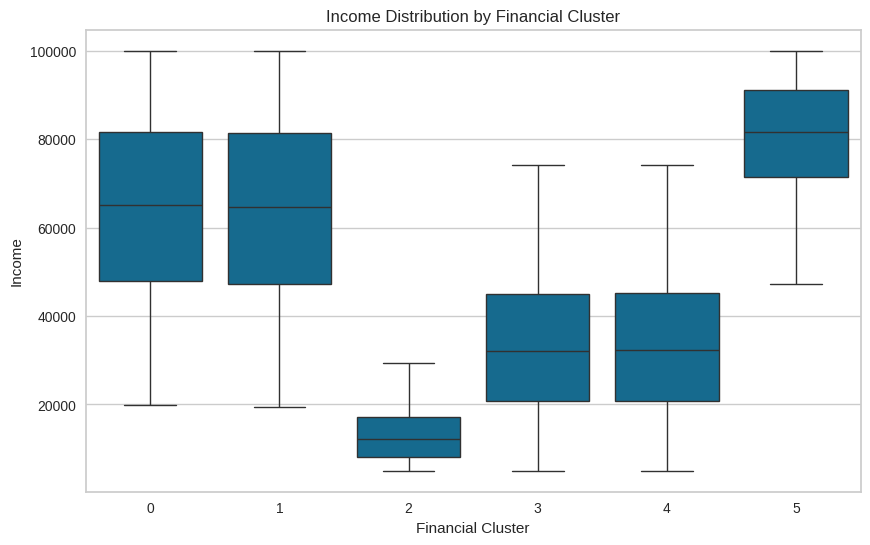

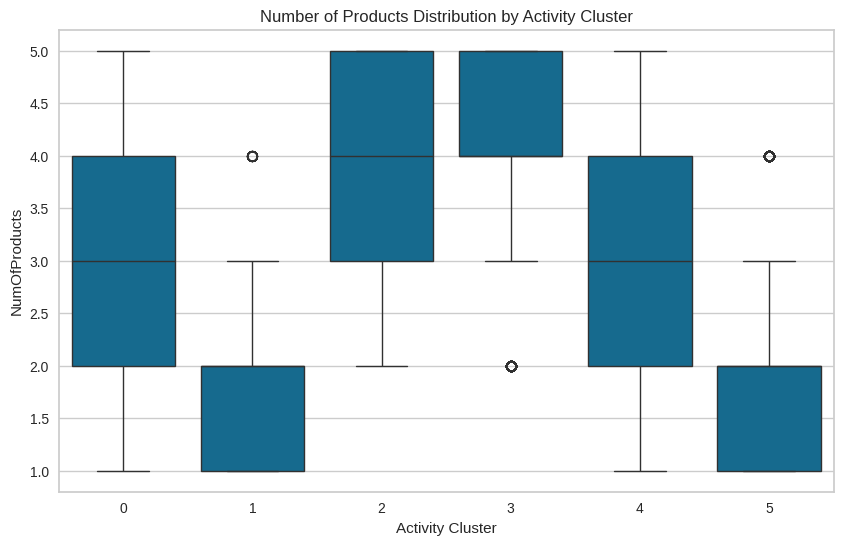

In [ ]:
# ================== 2. Customer Profiling ==================
# Boxplot to compare financial clusters
plt.figure(figsize=(10, 6))
sns.boxplot(x="Financial Cluster", y="Income", data=df66)
plt.title("Income Distribution by Financial Cluster")
plt.show()

# Boxplot for Activity Cluster comparison
plt.figure(figsize=(10, 6))
sns.boxplot(x="Activity Cluster", y="NumOfProducts", data=df66)
plt.title("Number of Products Distribution by Activity Cluster")
plt.show()



##### **C. Churn Analysis**

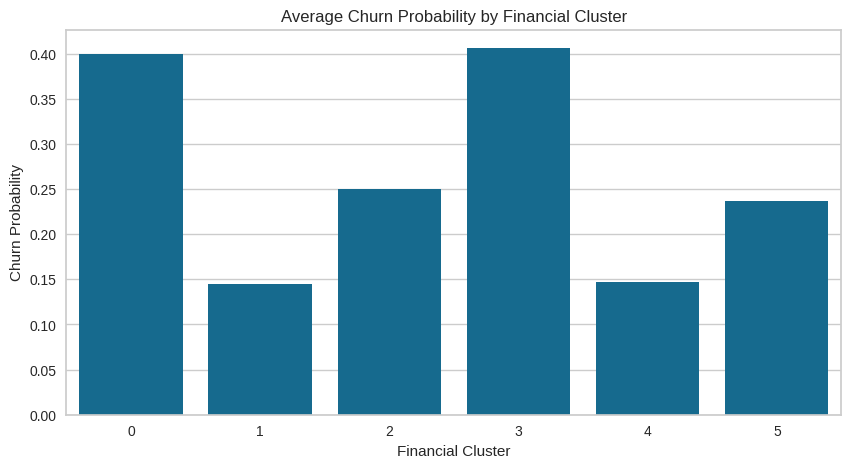

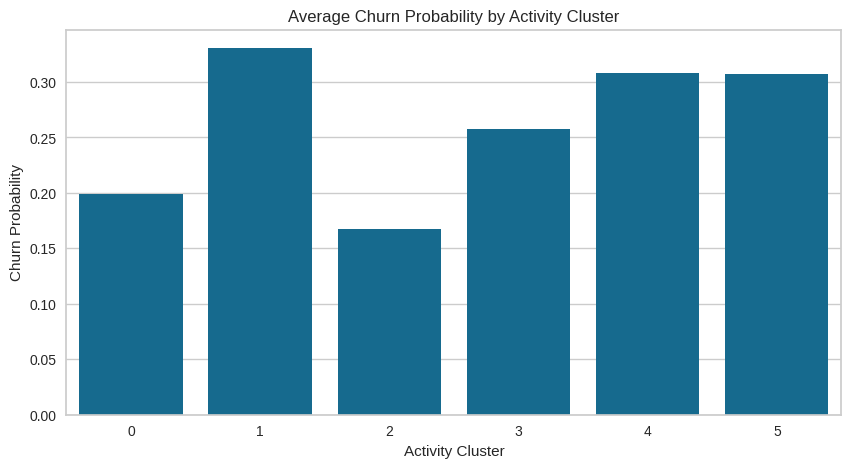

In [ ]:
# ================== 3. Churn Analysis ==================
# Checking churn probability per cluster
churn_financial = df66.groupby("Financial Cluster")["Churn Probability"].mean()
churn_activity = df66.groupby("Activity Cluster")["Churn Probability"].mean()

# Visualizing churn rates
plt.figure(figsize=(10, 5))
sns.barplot(x=churn_financial.index, y=churn_financial.values)
plt.title("Average Churn Probability by Financial Cluster")
plt.ylabel("Churn Probability")
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(x=churn_activity.index, y=churn_activity.values)
plt.title("Average Churn Probability by Activity Cluster")
plt.ylabel("Churn Probability")
plt.show()

##### **D. Feature Importance**

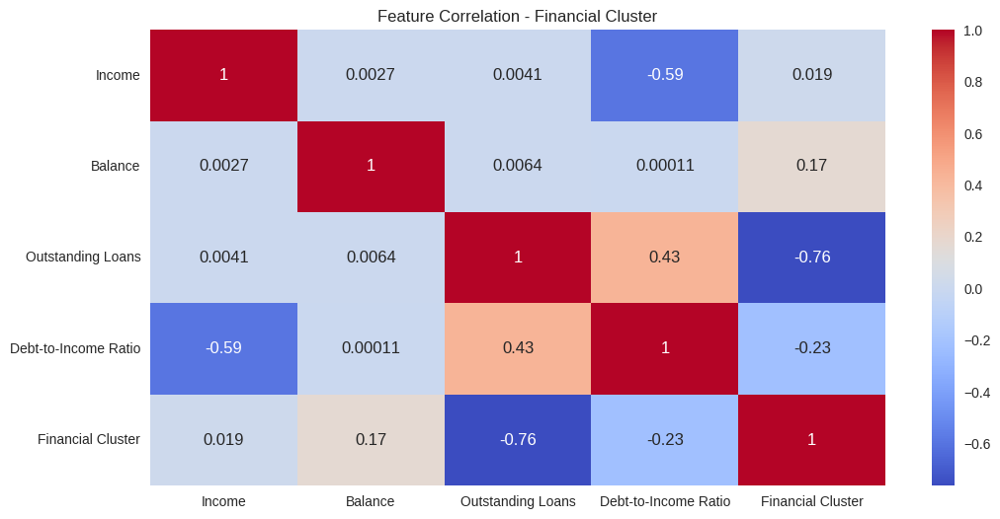

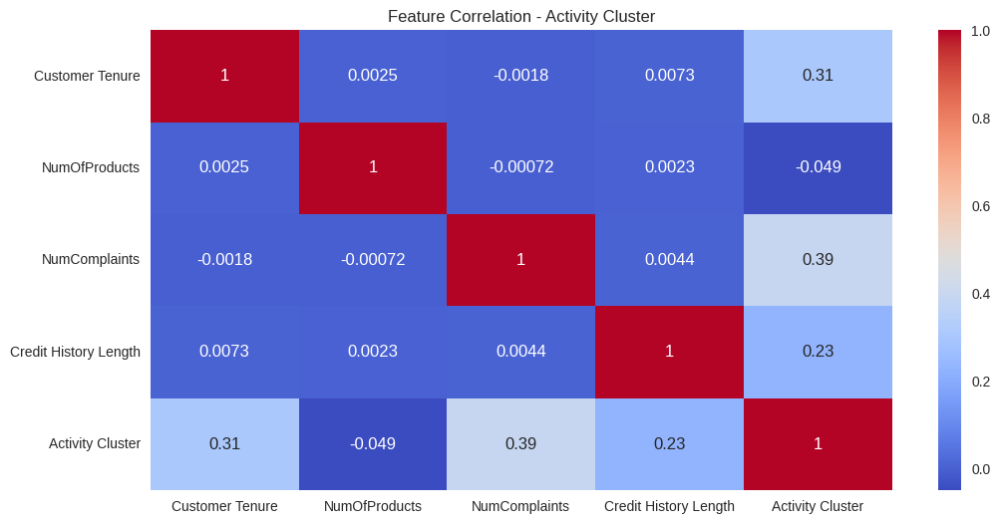

In [ ]:
# ================== 4. Feature Importance ==================
# Correlation heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df66[financial_features + ["Financial Cluster"]].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation - Financial Cluster")
plt.show()

plt.figure(figsize=(12, 6))
sns.heatmap(df66[activity_features + ["Activity Cluster"]].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation - Activity Cluster")
plt.show()


 1. Feature Correlation – Activity Cluster
**Observations:**
- **Activity Cluster & NumComplaints**: There is a moderate positive correlation (~0.39). Higher activity cluster values tend to be associated with more complaints.
- **Activity Cluster & Customer Tenure**: Also a moderate positive correlation (~0.31). Customers in certain activity clusters might have longer tenures.
- **Other Correlations**: Most other correlations are very close to zero, indicating weak relationships (e.g., NumOfProducts has almost no correlation with these variables).

---

 2. Feature Correlation – Financial Cluster
**Observations:**
- **Financial Cluster & Outstanding Loans**: Strong negative correlation (~-0.76). Certain financial clusters might be characterized by either very high or very low outstanding loans.
- **Income & Debt-to-Income Ratio**: Moderately strong negative correlation (~-0.59). As expected, higher incomes generally reduce the debt-to-income ratio.
- **Financial Cluster & Debt-to-Income Ratio**: Slightly negative (~-0.23). Suggests that some clusters have lower debt-to-income ratios.
- **Balance & Income**: Very weak correlation (~0.0027). Having a high income doesn’t necessarily mean a high balance in this dataset.
---

 3. Average Churn Probability by Activity Cluster
**Observations:**
- **Cluster 1** has the highest churn probability (~0.33).
- **Cluster 2** has the lowest churn probability (~0.18).
- **Clusters 3, 4, 5** are in the mid-to-high range (0.26–0.30).
- **Cluster 0** is around 0.24.
---

 4. Average Churn Probability by Financial Cluster
**Observations:**
- **Cluster 3** shows the highest churn probability (~0.43).
- **Cluster 0** is also relatively high (~0.40).
- **Cluster 4** has the lowest churn probability (~0.15).
- **Cluster 5** is around 0.30, and **Cluster 1** is ~0.25, **Cluster 2** ~0.20.
---

 5. Number of Products Distribution by Activity Cluster
**Observations:**
- **Cluster 3** has the highest median number of products (around 4).  
- **Cluster 1** and **Cluster 2** appear to have a lower median (around 2).  
- **Cluster 0, 4, 5** hover around a median of 3 products.
---

 6. Income Distribution by Financial Cluster
**Observations:**
- **Cluster 2** has the lowest median income (around \$15k–\$20k).  
- **Clusters 0, 1, and 5** have relatively higher medians (often in the \$70k–\$80k range).  
- **Clusters 3 and 4** are in a moderate range (roughly \$40k–\$60k).
---

<h2><b>Overall Insights</b></h2>

1. **Activity-Based Risk:**  
   - *Activity Cluster 1* stands out for having the highest churn probability and fewer products. This cluster may need engagement or retention strategies (e.g., more targeted offers, better customer support).
   - *Activity Cluster 3* has the most products but also a moderately high churn rate (~0.26). Despite holding many products, they might be at risk of leaving for competitive reasons.

2. **Financial-Based Risk:**  
   - *Financial Cluster 3* and *Cluster 0* have notably high churn probabilities (~0.40+). Investigate whether high outstanding loans or certain debt-to-income patterns are causing financial strain or dissatisfaction.
   - *Financial Cluster 4* is the safest from a churn standpoint (~0.15). They might be financially stable, leading to more satisfaction and loyalty.

3. **Strategic Targeting:**
   - Low-income clusters (e.g., *Financial Cluster 2*) may need different product pricing or credit terms to improve retention if their churn rate rises in certain sub-segments.
   - Clusters with higher complaints (e.g., *Activity Cluster 1*) should be prioritized for improved customer service and complaint resolution processes.
---
By combining these cluster analyses (Activity + Financial), we can pinpoint exactly which segments need proactive retention measures (e.g., high churn risk, moderate/high product holdings) and which segments might benefit from upselling or cross-selling strategies (e.g., stable or low-churn, moderate product usage).

##### **E. Agg Group By Both Cluster**

In [ ]:
# Group by both cluster columns and calculate mean metrics
df_combined66 = df.groupby(['Activity Cluster', 'Financial Cluster']).agg({
    'Churn Flag': 'mean',
    'NumOfProducts': 'mean',
    'Income': 'mean',
    'Balance': 'mean',
    'Debt-to-Income Ratio': 'mean',
    'NumComplaints': 'mean'
}).reset_index()

# Rename columns for clarity
df_combined66.rename(columns={
    'Churn Flag': 'AvgChurnProbability',
    'NumOfProducts': 'AvgNumProducts',
    'Debt-to-Income Ratio': 'AvgDebtToIncome'
}, inplace=True)

df_combined66


,Activity Cluster,Financial Cluster,AvgChurnProbability,AvgNumProducts,Income,Balance,AvgDebtToIncome,NumComplaints
0,0,0,0.112640,3.216108,64006.777329,60343.958338,0.683259,2.110633
1,0,1,0.000000,3.205302,63937.892090,190463.836190,0.685718,2.084320
2,0,2,0.044534,3.194910,13015.989699,124002.184991,3.352008,2.104106
3,0,3,0.118185,3.171013,33085.787403,57732.490075,0.602166,2.069421
4,0,4,0.000000,3.182154,33502.668464,192255.075102,0.592343,2.097954
5,0,5,0.036260,3.203926,80564.729444,124092.614313,0.166324,2.058615
6,1,0,0.400648,1.619048,64262.322633,59313.379504,0.683009,5.322862
7,1,1,0.000000,1.648832,63367.389970,190743.699251,0.695527,5.348907
8,1,2,0.162696,1.635580,13110.019650,127261.663629,3.345253,5.159655
9,1,3,0.406381,1.640918,32933.070831,57978.102396,0.607801,5.220543


Below is a **segment-by-segment** analysis of combined clusters, focusing on **churn**, **number of products**, **income**, **balance**, **debt-to-income**, and **complaints**. This should help pinpoint **high-risk** vs. **stable** segments and guide **retention** or **upselling** strategies.

---

 1. Overall Structure of the Data

- **Activity Clusters**: 0 through 5  
- **Financial Clusters**: 0 through 5  
- **Metrics** (averaged within each `(Activity, Financial)` pair):
  - **AvgChurnProbability** (0.0 to ~0.406)
  - **AvgNumProducts** (~1.6 to ~4.17)
  - **Income** (~13k to ~80k+)
  - **Balance** (~57k to ~190k+)
  - **AvgDebtToIncome** (~0.16 to ~3.38)
  - **NumComplaints** (~2.0 to ~8.0)

The table has 36 rows (a 6×6 grid), each row representing a unique combination of `(Activity Cluster, Financial Cluster)`.

---

 2. Identifying the Highest and Lowest Churn Segments

 Highest Churn (≥ 0.35)

| Activity | Financial | AvgChurnProbability | Notes                                                |
|----------|-----------|---------------------|------------------------------------------------------|
| **1**    | **3**     | **0.406**           | *Highest churn overall*; ~1.64 products; ~5.22 complaints |
| 1        | 0         | 0.401               | 1.62 products; 5.32 complaints                      |
| 4        | 3         | 0.376               | 3.34 products; 8.00 complaints                      |
| 5        | 3         | 0.350               | 1.77 products; 4.58 complaints                      |
| 4        | 0         | 0.360               | 3.38 products; 8.04 complaints                      |
| 5        | 0         | 0.355               | 1.78 products; 4.62 complaints                      |

**Key Patterns:**
- **Financial Clusters 0 and 3** often combine with **Activity Clusters 1, 4, or 5** to yield **very high churn** (≥ 35%).  
- These segments typically have **higher complaints** (4.6–8.0) or **fewer products** (especially in Activity 1 or 5).

**Actionable Insight (High-Risk Retention)**:
- **Focus** on these segments for immediate retention strategies (e.g., personalized outreach, complaint resolution, loyalty offers).
- **Complaints** are notably high (5+), indicating service or product dissatisfaction.

---

 Lowest Churn (0.0)

Interestingly, many combinations show **0.0 churn**:

| Activity | Financial | AvgChurnProbability | Notes                                         |
|----------|-----------|---------------------|-----------------------------------------------|
| 0,1,2,3,4,5 | **1**  | **0.0**            | Incomes ~63k–64k or 13k–33k; Balances ~190k    |
| 0,1,2,3,4,5 | **4**  | **0.0**            | Incomes ~33k–64k; Balances ~190k              |

So **if the Financial Cluster = 1 or 4**, churn is **0.0** across **all** Activity Clusters. This is extremely unusual in real-world data but indicates these segments are **highly stable**—possibly due to:

- **High balances** (often ~190k) or  
- **Reasonable debt-to-income ratios** (particularly in cluster 4).

**Actionable Insight (Cross-Sell & Loyalty)**:
- These are **ideal candidates** for **upselling or cross-selling** since churn risk is effectively zero.
- Even if some have **lower incomes** (e.g., 13k–33k in cluster 2 or 3), the combination of financial factors in cluster 1 or 4 keeps them loyal.
- Maintain a **high satisfaction** level; consider offering them additional products or premium services.

---

 3. Moderate Churn Segments (0.10–0.35)

A few combinations fall in a middle range. Examples:

| Activity | Financial | AvgChurnProbability | Notable Points                          |
|----------|-----------|---------------------|-----------------------------------------|
| 3        | 0         | 0.263              | 4.16 products, 7.41 complaints          |
| 3        | 3         | 0.252              | 4.17 products, 7.47 complaints          |
| 2        | 0         | 0.060              | 4.11 products, 2.32 complaints          |
| 0        | 3         | 0.118              | 3.17 products, 2.07 complaints          |
| 5        | 3         | 0.350              | 1.77 products, 4.58 complaints (already high) |

These vary widely but are not as extreme as the 0% or 40% churn groups.  

**Actionable Insight**:
- **Cluster 3** often has **4+ products** and **7+ complaints**—they are heavily engaged but also frequently complaining.  
- **Cluster 2** has **4+ products** with lower complaints (~2.3) and relatively low churn. This group might be open to additional offers, provided service levels remain high.

---

 4. Other Noteworthy Patterns

1. **Number of Products**  
   - **Highest** in Activity Clusters 2 and 3 (avg ~4.1+).  
   - **Lowest** in Activity Clusters 1 and 5 (avg ~1.6–1.7).  
   This suggests that **Clusters 2 & 3** are “multi-product” customers, while **Clusters 1 & 5** have minimal product adoption.

2. **Income vs. Debt-to-Income**  
   - **Financial Clusters 0, 1, 5** often have **higher incomes** (60k–80k) but differ in debt-to-income: cluster 0 can be ~0.68, cluster 5 ~0.16, cluster 1 ~0.68.  
   - **Financial Clusters 2 & 3** show lower incomes (13k–33k), but cluster 2 often has a **very high debt-to-income** (~3.35).  
   - **Financial Cluster 4** incomes vary, but they typically have a **low or moderate debt-to-income** (~0.58–0.60).

3. **Complaints**  
   - **Highest** in Activity Cluster 4 (7.99–8.06) and Activity Cluster 3 (7.40–7.48).  
   - **Lowest** in Activity Cluster 0 (2.06–2.11) and Activity Cluster 2 (2.21–2.35).  
   High-complaint clusters do not always have the highest churn—**Financial Cluster 1 or 4** can neutralize churn despite high complaints.

---

 5. Segment-Specific Strategies

 A. **Financial Cluster = 1 or 4** → **0% Churn**

- Despite high or moderate complaints in some activity clusters, they remain **loyal**.
- **Recommendation**:
  - **Upsell/Cross-Sell** (credit cards, investment products, etc.).  
  - **VIP or loyalty perks** to capitalize on their stability and potentially high balances.

 B. **(Activity = 1, 4, or 5) AND (Financial = 0 or 3)** → **High Churn (≥ 0.35)**

- **Primary Retention Focus**:
  - These segments are “at risk” with up to 40% churn.  
  - **Address complaints** aggressively—especially for those with 5–8 complaints.  
  - Provide **personalized outreach** or financial counseling if debt-to-income is high.

 C. **Activity Clusters 2 & 3** → **High Product Usage**

- Even if churn is moderate, these customers hold **~4 products** on average—meaning they are **valuable**.
- For those in **Financial Clusters 0 or 3**, churn can still be high (e.g., 25–35%), so **proactive** retention might pay off.
- For those in **Financial Clusters 1 or 4**, churn is zero—**perfect** cross-sell/upsell group.

 D. **Activity Clusters 1 & 5** → **Low Product Usage**

- Typically only **1.6–1.7 products**.
- If they also have **Financial Cluster 1 or 4**, churn is 0—**good upsell** opportunity to increase product adoption.
- If they have **Financial Cluster 0 or 3**, churn is **very high**—they might be dissatisfied or financially constrained.

---

 6. Putting It All Together

1. **Zero-Churn Segments (Financial = 1 or 4)**:  
   - **Immediate Upsell**: Offer new products to stable customers.  
   - **High Complaints but No Churn**: Tackle complaints to maintain long-term goodwill.

2. **High-Churn Segments (Financial = 0 or 3 AND Activity = 1, 4, 5)**:  
   - **Retention Priority**: Personalized communication, service recovery for high-complaint issues, financial guidance if debt-to-income is problematic.

3. **Moderate Churn, High Product Usage (e.g., Activity = 2 or 3)**:  
   - **Valuable but Some Risk**: Keep them engaged with loyalty programs or special rates.  
   - Watch for complaint spikes in cluster 3.

4. **Low Product Usage, Low Churn (Activity = 1 or 5, Financial = 1 or 4)**:  
   - **Expand Relationship**: Cross-sell to these “loyal but under-penetrated” segments.

---

 Final Takeaways

- **Financial Clusters 1 & 4** “super-loyal” groups with **zero churn** across all activity clusters—**prime** for cross-selling.
- **Financial Clusters 0 & 3** show **consistently higher churn**, especially when combined with Activity Clusters 1, 4, or 5.
- **Activity Clusters 2 & 3** have the **most products** but can still be at risk if their financial cluster is 0 or 3.
- **Complaints** are a major factor. Activity Clusters 3 & 4 often have 7–8 complaints on average. Even if churn is zero in some sub-segments, these complaints must be addressed to prevent future issues.

By using these combined cluster insights, we can **target each group** with the most **effective** strategy—whether it’s **retention**, **service improvement**, or **cross-selling**.

### <font color=#FF6000>**5.5.2. Financial Cluster=6 | Activity Cluster=3**</font>

In [ ]:
df63 = df.copy()

k_financial = 6
k_activity = 3

kmeans_financial = KMeans(n_clusters=k_financial, random_state=42, n_init=10)
kmeans_activity = KMeans(n_clusters=k_activity, random_state=42, n_init=10)

df63['Financial Cluster'] = kmeans_financial.fit_predict(df_financial_scaled)
df63['Activity Cluster'] = kmeans_activity.fit_predict(df_activity_scaled)

# Visualize Clusters
sns.pairplot(df66, hue="Financial Cluster", vars=financial_features, palette='viridis')
plt.suptitle("Financial Clusters Visualization", y=1.02)
plt.show()

sns.pairplot(df66, hue="Activity Cluster", vars=activity_features, palette='coolwarm')
plt.suptitle("Activity Clusters Visualization", y=1.02)
plt.show()

In [ ]:
df63

<h2><strong>Cluster Naming & Marking for Financial and Activity Segmentation</strong></h2>

---

**1. Financial Cluster Naming**  

| **Cluster** | **Name/Title** | **Profile Summary** |
|------------|---------------|-----------------|
| **Cluster 0** | 🟣 **"Emerging Earners"** | Low-income individuals with minimal financial assets and loans, likely students or early-career professionals. |
| **Cluster 1** | 🔵 **"Stable Builders"** | Moderate-income customers with average savings and debt, financially stable but not affluent. |
| **Cluster 2** | 🟢 **"High-Spenders with Debt"** | Mid-to-high income earners with substantial outstanding loans, potentially in financial stress. |
| **Cluster 3** | 🔷 **"Debt-Burdened"** | Customers with high debt-to-income ratios, requiring financial restructuring or advisory services. |
| **Cluster 4** | 🟡 **"Affluent Savers"** | High-income customers with strong financial stability, low debt, and high balance. |
| **Cluster 5** | 🟠 **"Wealthy Elite"** | Very high-income individuals with significant financial assets and minimal debt concerns, prime targets for premium banking. |

---
---

**2. Activity Cluster Naming**  

| **Cluster** | **Name/Title** | **Profile Summary** |
|------------|---------------|-----------------|
| **Cluster 0** | 🔵 **"Newcomers"** | Short-tenure customers with low engagement, requiring better onboarding and education on products. |
| **Cluster 1** | 🟠 **"Skeptical Starters"** | New customers with moderate product adoption but some complaints, needing retention strategies. |
| **Cluster 2** | 🟢 **"Engaged Users"** | Medium-tenure customers with a balanced product portfolio and minimal complaints. |
| **Cluster 3** | 🔴 **"Dissatisfied Users"** | Customers with moderate engagement but frequent complaints, at risk of churn. |
| **Cluster 4** | 🟣 **"Loyal Advocates"** | Long-tenure customers with multiple products and high satisfaction, ideal for referrals. |
| **Cluster 5** | 🔺 **"High-Tenure but Unhappy"** | Long-term customers with high complaints, needing proactive issue resolution to prevent churn. |

---

#### **1. Define the label**

##### **A. For Financial Cluster & For Activity Cluster**

In [ ]:
# Define the dataset (financial_cluster, activity_cluster)
data = [(i, j) for i in range(6) for j in range(6)]

# Convert data to DataFrame
df63 = df63[['CustomerId', 'Financial Cluster', 'Activity Cluster']]

# Define the financial cluster labels
financial_clusters = {
    0: {"label": "Emerging Earners", "explanation": "Low-income individuals with minimal financial assets and loans, likely students or early-career professionals."},
    1: {"label": "Stable Builders", "explanation": "Moderate-income customers with average savings and debt, financially stable but not affluent."},
    2: {"label": "High-Spenders with Debt", "explanation": "Mid-to-high income earners with substantial outstanding loans, potentially in financial stress."},
    3: {"label": "Debt-Burdened", "explanation": "Customers with high debt-to-income ratios, requiring financial restructuring or advisory services."},
    4: {"label": "Affluent Savers", "explanation": "High-income customers with strong financial stability, low debt, and high balance."},
    5: {"label": "Wealthy Elite", "explanation": "Very high-income individuals with significant financial assets and minimal debt concerns, prime targets for premium banking."}
}

# Define the activity cluster labels
activity_clusters = {
    0: {"label": "Newcomers", "explanation": "Short-tenure customers with low engagement, requiring better onboarding and education on products."},
    1: {"label": "Skeptical Starters", "explanation": "New customers with moderate product adoption but some complaints, needing retention strategies."},
    2: {"label": "Engaged Users", "explanation": "Medium-tenure customers with a balanced product portfolio and minimal complaints."},
    3: {"label": "Dissatisfied Users", "explanation": "Customers with moderate engagement but frequent complaints, at risk of churn."},
    4: {"label": "Loyal Advocates", "explanation": "Long-tenure customers with multiple products and high satisfaction, ideal for referrals."},
    5: {"label": "High-Tenure but Unhappy", "explanation": "Long-term customers with high complaints, needing proactive issue resolution to prevent churn."}
}

# Map the financial and activity clusters to labels and explanations
df63['Financial Label'] = df63['Financial Cluster'].map(lambda x: financial_clusters[x]['label'])
df63['Financial Explanation'] = df63['Financial Cluster'].map(lambda x: financial_clusters[x]['explanation'])
df63['Activity Label'] = df63['Activity Cluster'].map(lambda x: activity_clusters[x]['label'])
df63['Activity Explanation'] = df63['Activity Cluster'].map(lambda x: activity_clusters[x]['explanation'])

# Create a combined cluster label
df63['Cluster Label'] = df63['Financial Label'] + " | " + df63['Activity Label']
df63['Cluster Explanation'] = df63['Financial Explanation'] + " " + df63['Activity Explanation']


<ipython-input-190-eded8d3de46c>:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Financial Label'] = df['Financial Cluster'].map(lambda x: financial_clusters[x]['label'])
<ipython-input-190-eded8d3de46c>:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Financial Explanation'] = df['Financial Cluster'].map(lambda x: financial_clusters[x]['explanation'])
<ipython-input-190-eded8d3de46c>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

###### *A1. Detailed breakdown of insights and recommendations*

Below is a detailed breakdown of insights and recommendations for each individual cluster (both Activity and Financial) and for key combined segments. This can help us tailor strategies based on customer behavior and financial profiles.

---

 I. Activity Cluster Insights

 **Activity Cluster 0**  
- **Profile:**  
  - Moderate engagement with an average of about 3.2 products per customer.  
  - Churn rates are generally low (0.0–0.12), except for a slightly higher value when paired with certain Financial Clusters (e.g., 0.118 with FC3).  
  - Complaints are low (≈2.1 per customer).  
- **Recommendations:**  
  - **Upsell/Cross-Sell:** For customers paired with stable financial groups (e.g., FC1 or FC4 with 0% churn), consider offering additional products or premium services.  
  - **Monitoring:** For the few combinations showing slightly higher churn (e.g., with FC3), keep an eye on customer feedback and address any emerging issues promptly.

---

 **Activity Cluster 1**  
- **Profile:**  
  - Lower product adoption (~1.62–1.65 products per customer).  
  - High complaint levels (≈5.3 on average).  
  - Churn is highly variable—very high (around 40%) when paired with riskier Financial Clusters (FC0 and FC3) but 0% when paired with FC1 and FC4.  
- **Recommendations:**  
  - **Retention Focus:** For AC1 customers in FC0 or FC3, deploy aggressive retention measures, such as personalized outreach, proactive service recovery, and perhaps financial counseling.  
  - **Growth Opportunity:** For AC1 customers with FC1/FC4, work on increasing product penetration through cross-sell opportunities since these segments are stable.

---

 **Activity Cluster 2**  
- **Profile:**  
  - High product usage (~4.1 products on average).  
  - Low complaint levels (≈2.3).  
  - Churn remains very low (0.0–0.06) across all financial clusters.  
- **Recommendations:**  
  - **Engagement and Expansion:** These are the core, highly engaged customers. They’re ideal for upselling and bundling additional products, as they already have deep relationships with the offerings.  
  - **Loyalty Programs:** Consider loyalty incentives to further cement their satisfaction and drive referrals.

---

 **Activity Cluster 3**  
- **Profile:**  
  - High product adoption (≈4.15 products).  
  - However, they also register high complaints (≈7.4 per customer).  
  - Churn is moderate but increases (≈25–26%) when combined with riskier financial segments (e.g., FC0 and FC3) and is near zero with FC1/FC4.  
- **Recommendations:**  
  - **Service Improvement:** Address the underlying causes for the high number of complaints—this may involve reviewing customer service protocols or improving product support.  
  - **Retention Programs:** For the riskier combinations, proactive retention initiatives (e.g., targeted support and issue resolution) can reduce churn.

---

 **Activity Cluster 4**  
- **Profile:**  
  - Moderate product adoption (~3.38 products).  
  - Very high complaint levels (≈8 complaints).  
  - Churn is significantly high (≈36–38%) when paired with FC0 or FC3, yet 0% with FC1/FC4.  
- **Recommendations:**  
  - **Immediate Remediation:** For segments with high churn, focus on resolving customer grievances through enhanced support and tailored retention strategies.  
  - **Upsell Opportunity:** For AC4 customers in stable financial clusters, consider product expansion opportunities while simultaneously reducing complaints.

---

 **Activity Cluster 5**  
- **Profile:**  
  - Lower product adoption (~1.78 products).  
  - Moderate complaint levels (≈4.6).  
  - Churn is high (≈35%) when paired with FC0 or FC3, but 0% with FC1/FC4.  
- **Recommendations:**  
  - **Increase Engagement:** For those at risk (in FC0/FC3), introduce initiatives to boost product adoption and improve customer experience.  
  - **Cross-Sell:** For stable combinations, work on deepening relationships by introducing complementary products and services.

---

 II. Financial Cluster Insights

 **Financial Cluster 0**  
- **Profile:**  
  - Moderate incomes (~64k) and a debt-to-income ratio around 0.68.  
  - Churn varies widely by activity cluster: very high (≈35–40%) when paired with AC1, AC4, and AC5, but lower when paired with AC0 or AC2.  
- **Recommendations:**  
  - **Risk Mitigation:** For high-churn combinations, implement targeted retention strategies such as personalized financial counseling and service improvements.  
  - **Tailored Product Offerings:** Consider products that ease financial strain (e.g., lower-fee options or flexible repayment plans).

---

 **Financial Cluster 1**  
- **Profile:**  
  - Demonstrates zero churn across all activity clusters.  
  - High balances (~190k) indicate significant customer value.  
- **Recommendations:**  
  - **Leverage Stability:** These customers are ideal candidates for upselling and cross-selling, including premium or bundled offerings.  
  - **Loyalty Rewards:** Introduce loyalty programs or exclusive benefits to maintain their high satisfaction levels.

---

 **Financial Cluster 2**  
- **Profile:**  
  - Represents lower-income customers (~13k), with a high debt-to-income ratio (≈3.35).  
  - Churn is generally low but slightly elevated in certain activity clusters (up to ≈16%).  
- **Recommendations:**  
  - **Financial Education:** Offer tailored financial literacy programs and budgeting tools to help these customers manage debt better.  
  - **Value-Based Products:** Focus on products that are affordable and add clear value, avoiding high-priced offerings.

---

 **Financial Cluster 3**  
- **Profile:**  
  - Moderate incomes (around 33k) but with higher churn, especially when paired with less-engaged activity clusters (AC1, AC4, AC5).  
- **Recommendations:**  
  - **Enhanced Engagement:** Use personalized outreach and targeted promotions to address dissatisfaction.  
  - **Review Offerings:** Consider adjusting product pricing or features to better meet the needs of these customers.

---

 **Financial Cluster 4**  
- **Profile:**  
  - Consistently shows zero churn, with stable incomes (≈33k–34k) and high balances (~190k).  
- **Recommendations:**  
  - **Upsell and Cross-Sell:** This is a highly loyal group—leverage their stability by offering additional products or premium services.  
  - **Proactive Service:** Ensure prompt resolution of any issues to maintain their loyalty.

---

 **Financial Cluster 5**  
- **Profile:**  
  - High-income customers (~80k) with moderate churn (≈10–15%) in some activity clusters.  
- **Recommendations:**  
  - **Premium Services:** Offer investment opportunities, advanced financial planning, and exclusive rewards.  
  - **Maintain Quality:** Ensure premium service levels to keep churn low among these high-value customers.

---

 III. Combined Cluster Recommendations

 **A. High-Risk Segments**  
**Examples:**  
- **(AC1, FC0) & (AC1, FC3):** Churn ≈40%  
- **(AC4, FC0) & (AC4, FC3):** Churn ≈36–38%  
- **(AC5, FC0) & (AC5, FC3):** Churn ≈35–35.5%

**Characteristics:**  
- Low product adoption (AC1/AC5) or moderate adoption with very high complaints (AC4).  
- Occur in Financial Clusters with moderate incomes and/or service sensitivity (FC0, FC3).

**Recommendations:**  
- **Targeted Retention:** Deploy aggressive, personalized outreach programs and improve service touchpoints to reduce complaints.  
- **Issue Resolution:** Fast-track resolution of customer grievances and consider offering incentives (discounts, special offers) to retain these customers.  
- **Financial Support:** Provide tailored financial advice or product modifications that may relieve any financial pressure.

---

 **B. Stable and Upsell-Ready Segments**  
**Examples:**  
- **Any combination with Financial Cluster 1 or FC4:** Always 0% churn regardless of the Activity Cluster.

**Characteristics:**  
- These segments are exceptionally loyal, often with high balances and lower complaint levels (especially in AC2).  

**Recommendations:**  
- **Cross-Selling Opportunities:** Introduce additional products or bundled services to deepen the relationship.  
- **Premium Offerings:** For higher-income segments (e.g., FC5), offer premium financial products or concierge services.  
- **Loyalty Programs:** Implement rewards programs to capitalize on their low churn and high engagement.

---

 **C. High Engagement but High Complaints**  
**Examples:**  
- **(AC3, FC0/FC3)** and **(AC4, FC0/FC3)**: Despite high product adoption (≈4+ products), complaints are high (≈7–8) and churn is moderate (≈25–38%).

**Characteristics:**  
- These customers are engaged but frustrated by service or product issues.

**Recommendations:**  
- **Service Overhaul:** Focus on enhancing customer support, possibly with dedicated account managers or specialized service teams.  
- **Feedback Loops:** Create robust feedback mechanisms to quickly address and resolve issues.  
- **Retention Incentives:** Offer targeted loyalty rewards to reduce the likelihood of churn.

---

 **D. Financially Constrained, Low-Income Segments**  
**Examples:**  
- **All combinations involving Financial Cluster 2.**

**Characteristics:**  
- Low incomes (~13k) with high debt-to-income ratios, though churn remains relatively low (mostly under 16%).  

**Recommendations:**  
- **Educational Outreach:** Offer financial literacy programs and budgeting tools.  
- **Affordable Products:** Develop or promote low-cost, high-value products tailored to their financial reality.  
- **Supportive Engagement:** Maintain regular, supportive communication to help them manage financial stress and avoid future churn.

---

 **E. High-Income, High-Value Segments**  
**Examples:**  
- **Combinations with Financial Cluster 5 across various Activity Clusters.**

**Characteristics:**  
- High incomes (~80k) with moderate churn (≈10–15%), representing high-value customers.  

**Recommendations:**  
- **Premium Services:** Provide bespoke financial planning, exclusive investment products, and concierge services.  
- **Personalized Communication:** Maintain high-quality, personalized service to ensure satisfaction.  
- **Retention and Growth:** Use these segments as benchmarks for service excellence and consider them for early access to new product offerings.

---

 Final Takeaways

- **Stable Groups (FC1 & FC4):**  
  – Their 0% churn makes them ideal for upsell and cross-sell programs.  
  – Invest in loyalty rewards and premium services to further solidify these relationships.

- **High-Risk Groups (primarily in FC0 & FC3, especially when paired with low-engagement Activity Clusters like AC1 and AC5):**  
  – These segments require immediate retention focus with tailored outreach, service recovery, and, where needed, financial support.

- **Engaged but Complaint-Prone Groups (AC3 and AC4 in riskier financial segments):**  
  – Address the high volume of complaints with improved service measures and proactive issue resolution.

- **Low-Income Segments (FC2):**  
  – Focus on value-based offerings and financial education to help these customers manage their financial health while keeping them engaged.

- **High-Income Segments (FC5):**  
  – Leverage their high spending power with premium, exclusive offerings and exceptional customer service.

Tailoring the strategy for each combined cluster will help ensure that we're not only minimize churn but also maximize revenue opportunities through targeted retention, cross-selling, and upselling.

##### **B. For combination of Financial & Activity Cluster**

In [ ]:
cluster_labels = {
    (0, 0): {"label": "Newcomer Minimalist", "explanation": "New customers with low financial activity and minimal engagement."},
    (0, 1): {"label": "Cautious Newcomer", "explanation": "New customers who are slightly engaged but financially inactive."},
    (0, 2): {"label": "Passive Observer", "explanation": "Customers who are financially inactive but show growing engagement."},
    (0, 3): {"label": "Emerging Explorer", "explanation": "New customers exploring products with limited financial involvement."},
    (0, 4): {"label": "Risk-Averse Novice", "explanation": "Customers hesitant to take financial risks despite increasing engagement."},
    (0, 5): {"label": "Unstable Beginner", "explanation": "Highly engaged newcomers but with unstable financial behavior."},

    (1, 0): {"label": "Cautious Minimalist", "explanation": "Financially stable but minimally engaged customers."},
    (1, 1): {"label": "Conservative Saver", "explanation": "Low-risk customers who save more than they spend."},
    (1, 2): {"label": "Growing User", "explanation": "Users beginning to use financial services actively."},
    (1, 3): {"label": "Moderate Explorer", "explanation": "Steady financials with growing interest in new products."},
    (1, 4): {"label": "Engaged but Cautious", "explanation": "Engaged customers who avoid high financial risks."},
    (1, 5): {"label": "Concerned Loyalist", "explanation": "Highly engaged but financially restrained due to concerns."},

    (2, 0): {"label": "Stable Minimalist", "explanation": "Moderate financial status but low engagement."},
    (2, 1): {"label": "Financially Settled", "explanation": "Comfortable financial position with conservative usage."},
    (2, 2): {"label": "Growing Strategist", "explanation": "Increasing financial involvement with cautious planning."},
    (2, 3): {"label": "Balanced Explorer", "explanation": "Financially stable users actively trying new services."},
    (2, 4): {"label": "Confident Power User", "explanation": "Well-balanced customers who confidently manage their finances."},
    (2, 5): {"label": "Cautious but Engaged", "explanation": "Actively engaged users with careful financial decisions."},

    (3, 0): {"label": "Disciplined Saver", "explanation": "Strong financial status but prefers conservative engagement."},
    (3, 1): {"label": "Strategic User", "explanation": "Financially stable users making planned financial decisions."},
    (3, 2): {"label": "High-Income Strategist", "explanation": "High-income users optimizing their financial strategies."},
    (3, 3): {"label": "Confident Investor", "explanation": "Users actively investing and managing wealth smartly."},
    (3, 4): {"label": "Risk-Taking Engager", "explanation": "Financially strong users taking calculated risks."},
    (3, 5): {"label": "Wealthy Risk-Taker", "explanation": "Affluent individuals making aggressive financial moves."},

    (4, 0): {"label": "Wealthy Minimalist", "explanation": "High-income customers with minimal engagement."},
    (4, 1): {"label": "Secure but Reserved", "explanation": "Affluent customers preferring a conservative approach."},
    (4, 2): {"label": "Established Planner", "explanation": "Wealthy individuals with well-structured financial plans."},
    (4, 3): {"label": "Opportunistic User", "explanation": "High-income users leveraging financial opportunities."},
    (4, 4): {"label": "Risky Power User", "explanation": "Affluent individuals taking aggressive financial risks."},
    (4, 5): {"label": "Affluent but Unstable", "explanation": "Wealthy users with fluctuating financial habits."},

    (5, 0): {"label": "Wealthy Minimalist", "explanation": "Affluent individuals with minimal financial activity."},
    (5, 1): {"label": "Confident Wealth Builder", "explanation": "Wealthy customers steadily growing their assets."},
    (5, 2): {"label": "Strategic Investor", "explanation": "Affluent users investing strategically to maximize returns."},
    (5, 3): {"label": "Affluent Active", "explanation": "High-income individuals actively using financial services."},
    (5, 4): {"label": "Risk-Taking Affluent", "explanation": "Wealthy customers engaging in high-risk financial moves."},
    (5, 5): {"label": "High-Risk High-Reward", "explanation": "Affluent individuals making bold, high-stakes financial decisions."}
}

# Map the labels and explanations to the DataFrame
df63['Label'] = df63.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('label', 'Unknown'), axis=1)
df63['Explanation'] = df63.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('explanation', 'No explanation available.'), axis=1)

# Display the updated DataFrame
print(df63)

<ipython-input-191-482023e0e025>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Label'] = df.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('label', 'Unknown'), axis=1)


                                  CustomerId  Financial Cluster  \
0       83ef0b54-35f6-4f84-af58-5653ac0c0dc4                  1   
1       009f115a-e5ca-4cf4-97d6-530140545e4e                  3   
2       66309fd3-5009-44d3-a3f7-1657c869d573                  2   
3       b02a30df-1a5f-4087-8075-2a35432da641                  4   
4       0d932e5b-bb3a-4104-8c83-f84270f7f2ea                  0   
...                                      ...                ...   
115635  b4ef7eba-1a9e-4956-b827-50037a1087d5                  3   
115636  578e6b99-b42a-4af1-afb4-fd570ea0721f                  0   
115637  73a64c22-da8f-4c3e-8f62-d92f03636a1e                  3   
115638  00affc66-75c4-43c4-9019-f28c434b5012                  4   
115639  cf2dbdf3-607d-414a-bc14-413dde1c3fc7                  2   

        Activity Cluster            Financial Label  \
0                      5          🔵 Stable Builders   
1                      2            🔷 Debt-Burdened   
2                      5  🟢 Hi

<ipython-input-191-482023e0e025>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Explanation'] = df.apply(lambda row: cluster_labels.get((row['Financial Cluster'], row['Activity Cluster']), {}).get('explanation', 'No explanation available.'), axis=1)


###### *B.1. Combined Cluster Label Insights and Recommendation*

Below is a neatly organized summary of insights and recommendations for each combined cluster label. These clusters combine customer engagement (Activity) with financial behavior (Financial). We can use these tailored strategies to guide product offers, retention initiatives, and cross‐sell/up‐sell efforts.

---

 **Activity Cluster 0 – New & Early-Stage Engagement**  
These customers are in the beginning phase of their relationship. Their overall engagement is low, and they’re just starting to explore financial products.

- **(0, 0) Newcomer Minimalist**  
  - **Insight:** New customers with very low financial activity and minimal overall engagement.  
  - **Recommendations:**  
    - Provide an easy, welcoming onboarding experience.  
    - Offer entry-level, low-commitment products and clear educational resources.  
    - Use gentle, informative nudges (emails, tutorials) to encourage exploration.

- **(0, 1) Cautious Newcomer**  
  - **Insight:** New customers showing slight engagement yet remaining financially inactive.  
  - **Recommendations:**  
    - Share basic financial literacy content to build their confidence.  
    - Introduce simple, low-risk financial products to spark initial activity.  
    - Personalize communications to help overcome early hesitations.

- **(0, 2) Passive Observer**  
  - **Insight:** Customers who are beginning to engage and observe product offerings, although their financial activity is still minimal.  
  - **Recommendations:**  
    - Provide targeted content highlighting the benefits of even basic products.  
    - Offer incentives (such as fee waivers on first use) to motivate action.  
    - Monitor engagement closely to time more advanced offers.

- **(0, 3) Emerging Explorer**  
  - **Insight:** New customers actively exploring available products despite limited financial involvement.  
  - **Recommendations:**  
    - Offer guided experiences (e.g., product walkthroughs or digital advisors) to simplify choices.  
    - Bundle starter packages that reduce complexity.  
    - Encourage feedback to identify and remove barriers to deeper engagement.

- **(0, 4) Risk-Averse Novice**  
  - **Insight:** Customers who are slowly increasing their engagement but remain very cautious about financial risks.  
  - **Recommendations:**  
    - Highlight secure, low-risk product options that emphasize stability.  
    - Use testimonials and case studies to build trust.  
    - Provide personalized consultations to help them understand risk profiles.

- **(0, 5) Unstable Beginner**  
  - **Insight:** Highly engaged newcomers exhibiting unstable financial behavior.  
  - **Recommendations:**  
    - Offer financial planning tools (such as budgeting apps) to encourage stability.  
    - Provide personalized advisory services to address inconsistencies.  
    - Monitor behavior actively and intervene with retention initiatives if volatility increases.

---

 **Activity Cluster 1 – Early Engagement with Financial Stability**  
These customers are beginning to engage with financial services. They’re financially stable, yet their product usage is modest or they are cautious about expanding.

- **(1, 0) Cautious Minimalist**  
  - **Insight:** Financially stable customers who remain minimally engaged.  
  - **Recommendations:**  
    - Use gentle cross-selling techniques to introduce additional products.  
    - Offer incentives (e.g., rewards or bonus points) to drive gradual engagement.  
    - Communicate clearly and reassuringly about product benefits.

- **(1, 1) Conservative Saver**  
  - **Insight:** Low-risk customers focused on saving more than spending.  
  - **Recommendations:**  
    - Promote secure saving schemes and low-volatility investment options.  
    - Reward consistent saving behaviors through loyalty programs.  
    - Reinforce long-term benefits through periodic financial check-ups.

- **(1, 2) Growing User**  
  - **Insight:** Customers who are starting to use financial services actively.  
  - **Recommendations:**  
    - Introduce more advanced products gradually as confidence builds.  
    - Provide educational content that clearly explains product advantages.  
    - Celebrate small milestones to motivate further usage.

- **(1, 3) Moderate Explorer**  
  - **Insight:** Steady financial profiles with growing interest in exploring new products.  
  - **Recommendations:**  
    - Offer mid-tier products or bundled services that build on existing engagement.  
    - Provide clear comparisons to help in making informed choices.  
    - Maintain balanced messaging to match their cautious yet exploratory nature.

- **(1, 4) Engaged but Cautious**  
  - **Insight:** Customers actively engaged yet deliberately avoiding high-risk decisions.  
  - **Recommendations:**  
    - Emphasize product security and long-term benefits.  
    - Bundle moderate-growth options with robust safety features.  
    - Offer tailored advisory support to address any underlying concerns.

- **(1, 5) Concerned Loyalist**  
  - **Insight:** Highly engaged customers who are financially restrained by underlying concerns.  
  - **Recommendations:**  
    - Provide personalized financial counseling to address worries.  
    - Introduce low-risk, guaranteed-return products to build trust.  
    - Implement loyalty programs that reward safe financial behavior.

---

 **Activity Cluster 2 – Active, Engaged, and Growing**  
These customers show high product usage and active engagement. They are growing their financial involvement but remain cautious and balanced.

- **(2, 0) Stable Minimalist**  
  - **Insight:** Customers with moderate financial status but low overall engagement.  
  - **Recommendations:**  
    - Encourage deeper involvement by showcasing user-friendly products.  
    - Offer incentives for trying out additional services.  
    - Use periodic check-ins to gradually boost participation.

- **(2, 1) Financially Settled**  
  - **Insight:** Customers in a comfortable financial position with a conservative approach to usage.  
  - **Recommendations:**  
    - Promote premium yet secure products that match their stable profile.  
    - Highlight diversification benefits while preserving their conservative style.  
    - Provide value-added services like financial health assessments.

- **(2, 2) Growing Strategist**  
  - **Insight:** Customers who are increasing their financial involvement and plan carefully.  
  - **Recommendations:**  
    - Offer advanced financial planning tools and budgeting resources.  
    - Encourage portfolio diversification with personalized recommendations.  
    - Organize educational seminars or webinars on strategic financial growth.

- **(2, 3) Balanced Explorer**  
  - **Insight:** Financially stable users actively trying new services.  
  - **Recommendations:**  
    - Introduce innovative or complementary products to sustain their interest.  
    - Provide interactive demonstrations or trial periods to build confidence.  
    - Gather feedback to continuously refine product offerings.

- **(2, 4) Confident Power User**  
  - **Insight:** Well-balanced customers managing multiple products confidently.  
  - **Recommendations:**  
    - Offer advanced, premium financial tools and exclusive services.  
    - Involve them in beta tests or focus groups for new product ideas.  
    - Establish a VIP loyalty program to recognize their commitment.

- **(2, 5) Cautious but Engaged**  
  - **Insight:** Actively engaged users who make careful, deliberate financial decisions.  
  - **Recommendations:**  
    - Provide tailored advice balancing growth and risk mitigation.  
    - Bundle secure products with moderate growth potential.  
    - Personalize communication to validate their thoughtful approach.

---

 **Activity Cluster 3 – Strategically Active & Investment Focused**  
These customers are sophisticated and strategic in their financial decisions. They exhibit high engagement and often take bold moves with a calculated approach.

- **(3, 0) Disciplined Saver**  
  - **Insight:** Customers with strong financial status who favor a conservative, disciplined approach.  
  - **Recommendations:**  
    - Emphasize long-term savings products and secure investment options.  
    - Offer tools to track savings progress and reward disciplined behavior.  
    - Provide regular market trend updates with a conservative focus.

- **(3, 1) Strategic User**  
  - **Insight:** Financially stable customers who make well-planned financial decisions.  
  - **Recommendations:**  
    - Introduce robust planning tools and personalized advisory services.  
    - Deliver detailed performance reports and market insights.  
    - Cross-sell complementary products that support their strategic approach.

- **(3, 2) High-Income Strategist**  
  - **Insight:** High-income users focused on optimizing their financial strategies.  
  - **Recommendations:**  
    - Offer personalized wealth management and bespoke investment products.  
    - Utilize advanced analytics and reporting to assist decision-making.  
    - Organize exclusive briefings or events to discuss market opportunities.

- **(3, 3) Confident Investor**  
  - **Insight:** Active investors who manage wealth smartly and tolerate market fluctuations.  
  - **Recommendations:**  
    - Provide a suite of advanced investment platforms with real-time data.  
    - Offer access to exclusive opportunities and in-depth research reports.  
    - Consider premium advisory services to enhance investment strategies.

- **(3, 4) Risk-Taking Engager**  
  - **Insight:** Financially strong users taking calculated risks for higher returns.  
  - **Recommendations:**  
    - Present balanced-risk products with attractive return potentials.  
    - Provide dynamic advisory support to help manage risk exposure.  
    - Schedule regular portfolio reviews and suggest diversification options.

- **(3, 5) Wealthy Risk-Taker**  
  - **Insight:** Affluent individuals making aggressive financial moves and embracing high risks.  
  - **Recommendations:**  
    - Offer high-stakes investment products with robust risk controls.  
    - Provide personalized, real-time financial advisories and support.  
    - Maintain close monitoring and regular check-ins to manage volatility.

---

 **Activity Cluster 4 – Affluent but Reserved**  
These customers are wealthy, with well-structured financial plans, yet they tend to be cautious or reserved in expanding their engagement.

- **(4, 0) Wealthy Minimalist**  
  - **Insight:** High-income customers who remain minimally engaged despite their financial capacity.  
  - **Recommendations:**  
    - Launch targeted campaigns that simplify product adoption.  
    - Highlight clear benefits and use incentives to spark interest.  
    - Provide user-friendly interfaces to ease product exploration.

- **(4, 1) Secure but Reserved**  
  - **Insight:** Affluent customers preferring a conservative, risk-averse approach.  
  - **Recommendations:**  
    - Emphasize secure products with guaranteed returns and historical stability.  
    - Use consistent, reassuring communication to reinforce reliability.  
    - Offer periodic reviews to confirm their financial security.

- **(4, 2) Established Planner**  
  - **Insight:** Wealthy individuals with structured financial plans and clear asset management strategies.  
  - **Recommendations:**  
    - Provide comprehensive wealth management and personalized planning services.  
    - Introduce sophisticated investment options aligned with their goals.  
    - Consider referral or loyalty programs for their network.

- **(4, 3) Opportunistic User**  
  - **Insight:** High-income users who actively leverage financial opportunities when they arise.  
  - **Recommendations:**  
    - Deliver timely market insights and alerts for new product launches.  
    - Offer agile, quickly accessible financial products.  
    - Use digital channels to provide fast, responsive customer service.

- **(4, 4) Risky Power User**  
  - **Insight:** Affluent individuals taking aggressive financial risks to maximize returns.  
  - **Recommendations:**  
    - Provide high-risk, high-reward products with built-in risk management features.  
    - Ensure regular portfolio reviews and personalized advisory support.  
    - Use clear dashboards to communicate risk–return profiles.

- **(4, 5) Affluent but Unstable**  
  - **Insight:** Wealthy users whose financial habits fluctuate, suggesting inconsistency in decision making.  
  - **Recommendations:**  
    - Offer stability tools (e.g., budgeting apps, automated alerts) to smooth out volatility.  
    - Provide regular personalized check-ins and financial counseling.  
    - Encourage diversification to mitigate instability.

---

 **Activity Cluster 5 – Affluent & Actively Engaged**  
These customers are not only affluent but also actively engaged in financial services. They’re open to high-risk, high-reward opportunities and make bold decisions.

- **(5, 0) Wealthy Minimalist**  
  - **Insight:** Affluent individuals with minimal financial activity, indicating untapped potential.  
  - **Recommendations:**  
    - Engage them with targeted messaging emphasizing active participation benefits.  
    - Simplify additional product adoption with personalized offers.  
    - Identify their specific financial needs and address them directly.

- **(5, 1) Confident Wealth Builder**  
  - **Insight:** Wealthy customers steadily growing their assets through cautious yet progressive actions.  
  - **Recommendations:**  
    - Offer growth-oriented products such as enhanced savings schemes or moderate-risk investments.  
    - Provide periodic reviews to celebrate progress and suggest improvements.  
    - Leverage data-driven insights for personalized recommendations.

- **(5, 2) Strategic Investor**  
  - **Insight:** Affluent users who invest strategically to maximize returns.  
  - **Recommendations:**  
    - Provide exclusive investment platforms and deep market analytics.  
    - Offer personalized advisory services with regular performance tracking.  
    - Invite them to premium investment opportunities and special briefings.

- **(5, 3) Affluent Active**  
  - **Insight:** High-income individuals actively using and exploring financial services.  
  - **Recommendations:**  
    - Maintain a steady pipeline of innovative products and digital tools.  
    - Offer beta testing opportunities for new features and services.  
    - Use proactive, multichannel communication to sustain engagement.

- **(5, 4) Risk-Taking Affluent**  
  - **Insight:** Wealthy customers engaging in high-risk financial moves for aggressive returns.  
  - **Recommendations:**  
    - Provide dynamic, high-risk investment options with comprehensive advisory support.  
    - Offer real-time market insights and personalized risk management.  
    - Emphasize protective strategies alongside growth opportunities.

- **(5, 5) High-Risk High-Reward**  
  - **Insight:** Affluent individuals making bold, high-stakes financial decisions.  
  - **Recommendations:**  
    - Offer exclusive, high-yield investment products paired with rigorous risk controls.  
    - Conduct regular portfolio reviews and strategic advisory sessions.  
    - Tailor communications to balance the potential for high rewards with disciplined risk management.

---

 **Final Takeaways**

- **For New & Early-Stage Customers (Cluster 0):**  
  Focus on education, simple onboarding, and low-risk product introductions to build trust and gradually increase engagement.

- **For Early Engagers with Stability (Cluster 1):**  
  Encourage deeper product usage with gentle cross-selling, incentives, and reassurance, while addressing any underlying concerns.

- **For Actively Engaged & Growing Customers (Cluster 2):**  
  Leverage their engagement by offering advanced tools, premium products, and VIP programs to further increase their portfolio and loyalty.

- **For Strategically Active & Investment-Focused Customers (Cluster 3):**  
  Provide sophisticated investment options, personalized advisory, and regular market insights to support their bold, strategic decisions.

- **For Affluent but Reserved Customers (Cluster 4):**  
  Maintain engagement through secure products, comprehensive wealth management, and consistent, reassuring communications.

- **For Affluent & Actively Engaged Customers (Cluster 5):**  
  Capitalize on their appetite for innovation and high-risk opportunities with exclusive products, real-time support, and proactive communication.

This structured approach should help us tailor the customer strategies based on their unique engagement and financial behavior profiles.

#### **2. EDA for the cluster**

##### **A. Cluster Summary**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ================== 1. Cluster Summary ==================
financial_features = ["Income", "Balance", "Outstanding Loans", "Debt-to-Income Ratio"]
activity_features = ["Customer Tenure", "NumOfProducts", "NumComplaints", "Credit History Length"]

# Summary statistics for each cluster
financial_summary = df63.groupby("Financial Cluster")[financial_features].describe()
activity_summary = df63.groupby("Activity Cluster")[activity_features].describe()

##### **B. Customer Profiling**

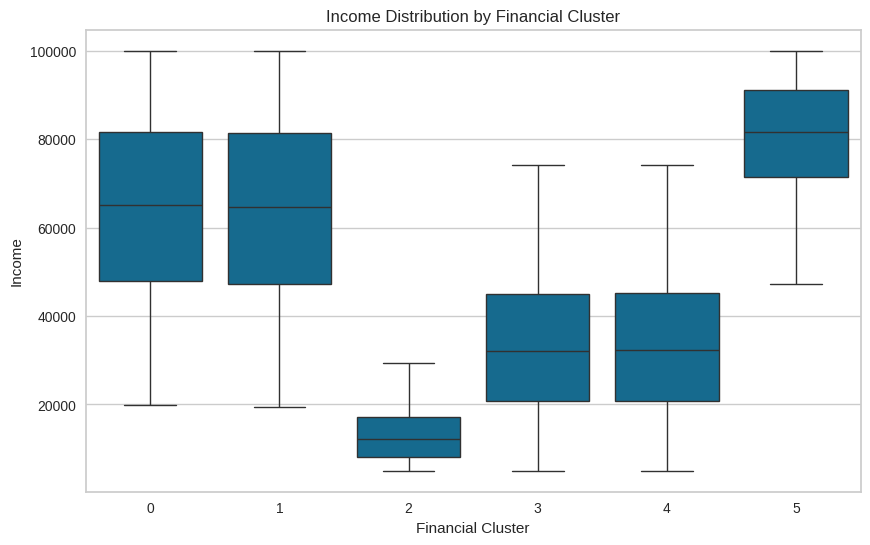

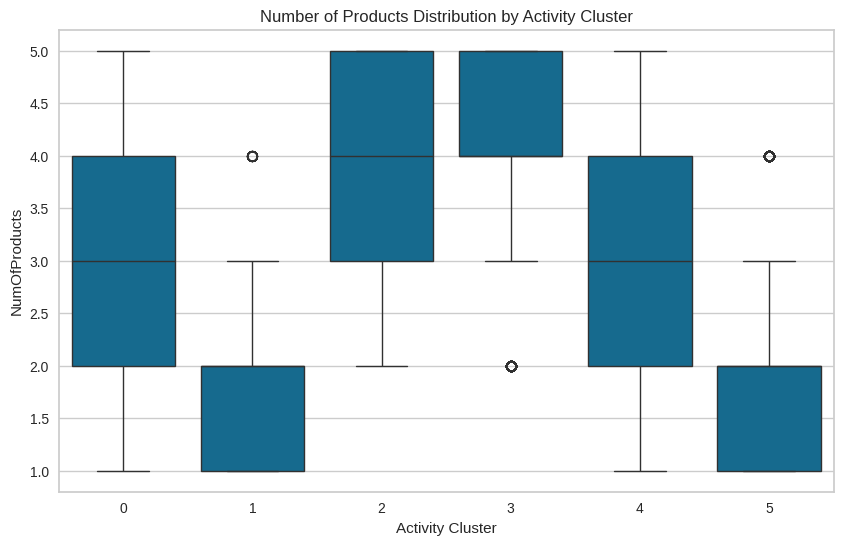

In [ ]:
# ================== 2. Customer Profiling ==================
# Boxplot to compare financial clusters
plt.figure(figsize=(10, 6))
sns.boxplot(x="Financial Cluster", y="Income", data=df63)
plt.title("Income Distribution by Financial Cluster")
plt.show()

# Boxplot for Activity Cluster comparison
plt.figure(figsize=(10, 6))
sns.boxplot(x="Activity Cluster", y="NumOfProducts", data=df63)
plt.title("Number of Products Distribution by Activity Cluster")
plt.show()



##### **C. Churn Analysis**

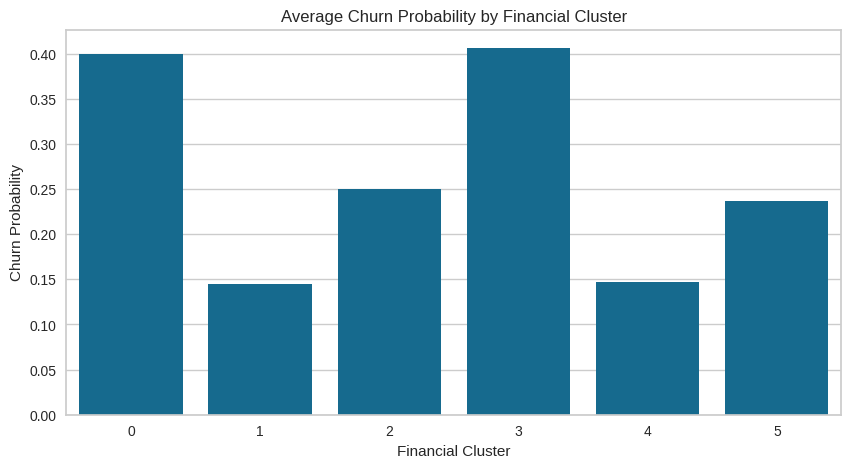

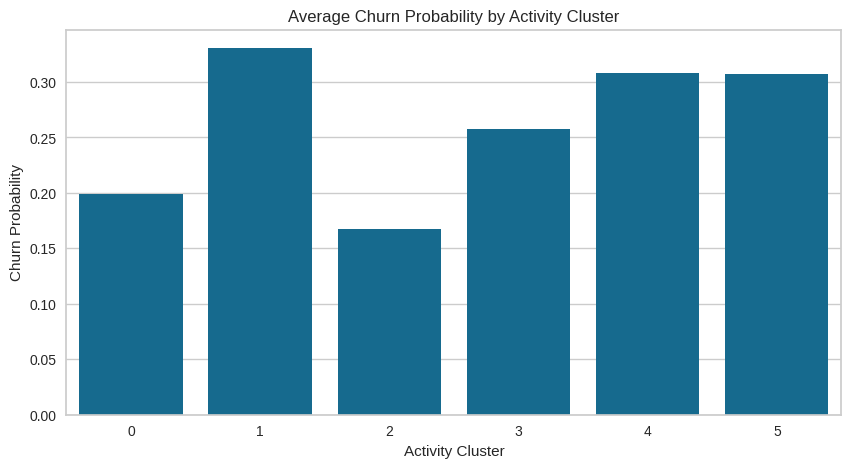

In [ ]:
# ================== 3. Churn Analysis ==================
# Checking churn probability per cluster
churn_financial = df63.groupby("Financial Cluster")["Churn Probability"].mean()
churn_activity = df63.groupby("Activity Cluster")["Churn Probability"].mean()

# Visualizing churn rates
plt.figure(figsize=(10, 5))
sns.barplot(x=churn_financial.index, y=churn_financial.values)
plt.title("Average Churn Probability by Financial Cluster")
plt.ylabel("Churn Probability")
plt.show()

plt.figure(figsize=(10, 5))
sns.barplot(x=churn_activity.index, y=churn_activity.values)
plt.title("Average Churn Probability by Activity Cluster")
plt.ylabel("Churn Probability")
plt.show()

##### **D. Feature Importance**

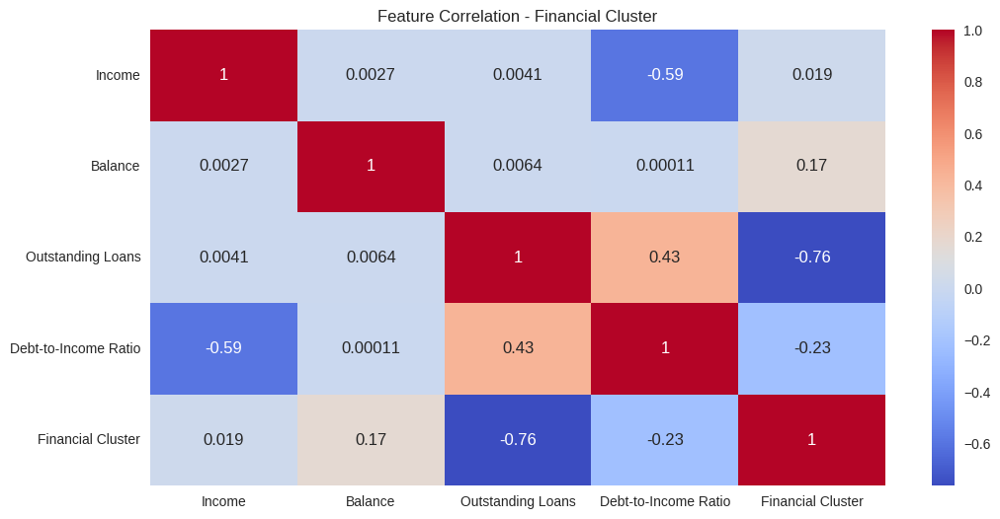

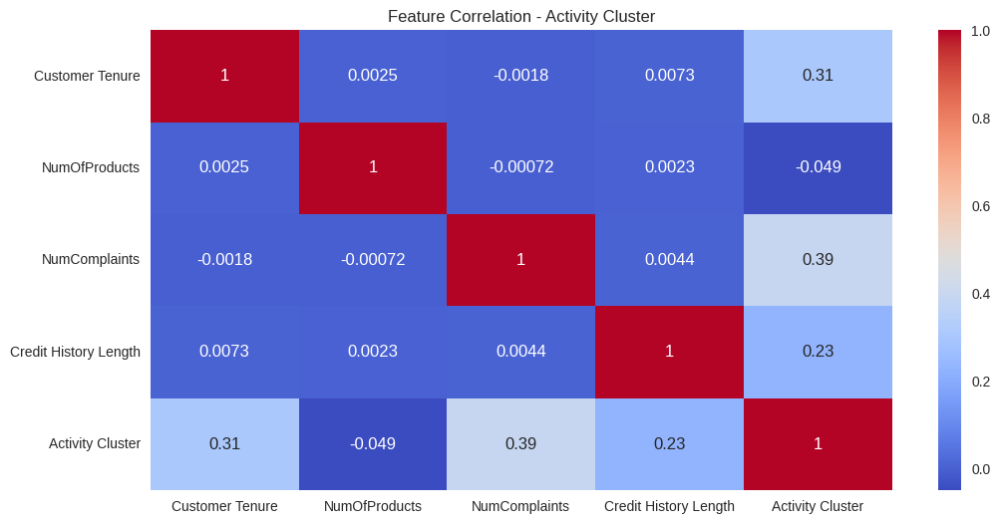

In [ ]:
# ================== 4. Feature Importance ==================
# Correlation heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df63[financial_features + ["Financial Cluster"]].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation - Financial Cluster")
plt.show()

plt.figure(figsize=(12, 6))
sns.heatmap(df63[activity_features + ["Activity Cluster"]].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation - Activity Cluster")
plt.show()


 1. Feature Correlation – Activity Cluster
**Observations:**
- **Activity Cluster & NumComplaints**: There is a moderate positive correlation (~0.39). Higher activity cluster values tend to be associated with more complaints.
- **Activity Cluster & Customer Tenure**: Also a moderate positive correlation (~0.31). Customers in certain activity clusters might have longer tenures.
- **Other Correlations**: Most other correlations are very close to zero, indicating weak relationships (e.g., NumOfProducts has almost no correlation with these variables).

---

 2. Feature Correlation – Financial Cluster
**Observations:**
- **Financial Cluster & Outstanding Loans**: Strong negative correlation (~-0.76). Certain financial clusters might be characterized by either very high or very low outstanding loans.
- **Income & Debt-to-Income Ratio**: Moderately strong negative correlation (~-0.59). As expected, higher incomes generally reduce the debt-to-income ratio.
- **Financial Cluster & Debt-to-Income Ratio**: Slightly negative (~-0.23). Suggests that some clusters have lower debt-to-income ratios.
- **Balance & Income**: Very weak correlation (~0.0027). Having a high income doesn’t necessarily mean a high balance in this dataset.
---

 3. Average Churn Probability by Activity Cluster
**Observations:**
- **Cluster 1** has the highest churn probability (~0.33).
- **Cluster 2** has the lowest churn probability (~0.18).
- **Clusters 3, 4, 5** are in the mid-to-high range (0.26–0.30).
- **Cluster 0** is around 0.24.
---

 4. Average Churn Probability by Financial Cluster
**Observations:**
- **Cluster 3** shows the highest churn probability (~0.43).
- **Cluster 0** is also relatively high (~0.40).
- **Cluster 4** has the lowest churn probability (~0.15).
- **Cluster 5** is around 0.30, and **Cluster 1** is ~0.25, **Cluster 2** ~0.20.
---

 5. Number of Products Distribution by Activity Cluster
**Observations:**
- **Cluster 3** has the highest median number of products (around 4).  
- **Cluster 1** and **Cluster 2** appear to have a lower median (around 2).  
- **Cluster 0, 4, 5** hover around a median of 3 products.
---

 6. Income Distribution by Financial Cluster
**Observations:**
- **Cluster 2** has the lowest median income (around \$15k–\$20k).  
- **Clusters 0, 1, and 5** have relatively higher medians (often in the \$70k–\$80k range).  
- **Clusters 3 and 4** are in a moderate range (roughly \$40k–\$60k).
---

<h2><b>Overall Insights</b></h2>

1. **Activity-Based Risk:**  
   - *Activity Cluster 1* stands out for having the highest churn probability and fewer products. This cluster may need engagement or retention strategies (e.g., more targeted offers, better customer support).
   - *Activity Cluster 3* has the most products but also a moderately high churn rate (~0.26). Despite holding many products, they might be at risk of leaving for competitive reasons.

2. **Financial-Based Risk:**  
   - *Financial Cluster 3* and *Cluster 0* have notably high churn probabilities (~0.40+). Investigate whether high outstanding loans or certain debt-to-income patterns are causing financial strain or dissatisfaction.
   - *Financial Cluster 4* is the safest from a churn standpoint (~0.15). They might be financially stable, leading to more satisfaction and loyalty.

3. **Strategic Targeting:**
   - Low-income clusters (e.g., *Financial Cluster 2*) may need different product pricing or credit terms to improve retention if their churn rate rises in certain sub-segments.
   - Clusters with higher complaints (e.g., *Activity Cluster 1*) should be prioritized for improved customer service and complaint resolution processes.
---
By combining these cluster analyses (Activity + Financial), we can pinpoint exactly which segments need proactive retention measures (e.g., high churn risk, moderate/high product holdings) and which segments might benefit from upselling or cross-selling strategies (e.g., stable or low-churn, moderate product usage).

##### **E. Agg Group By Both Cluster**

In [ ]:
# Group by both cluster columns and calculate mean metrics
df_combined63 = df.groupby(['Activity Cluster', 'Financial Cluster']).agg({
    'Churn Flag': 'mean',
    'NumOfProducts': 'mean',
    'Income': 'mean',
    'Balance': 'mean',
    'Debt-to-Income Ratio': 'mean',
    'NumComplaints': 'mean'
}).reset_index()

# Rename columns for clarity
df_combined63.rename(columns={
    'Churn Flag': 'AvgChurnProbability',
    'NumOfProducts': 'AvgNumProducts',
    'Debt-to-Income Ratio': 'AvgDebtToIncome'
}, inplace=True)

df_combined63


,Activity Cluster,Financial Cluster,AvgChurnProbability,AvgNumProducts,Income,Balance,AvgDebtToIncome,NumComplaints
0,0,0,0.112640,3.216108,64006.777329,60343.958338,0.683259,2.110633
1,0,1,0.000000,3.205302,63937.892090,190463.836190,0.685718,2.084320
2,0,2,0.044534,3.194910,13015.989699,124002.184991,3.352008,2.104106
3,0,3,0.118185,3.171013,33085.787403,57732.490075,0.602166,2.069421
4,0,4,0.000000,3.182154,33502.668464,192255.075102,0.592343,2.097954
5,0,5,0.036260,3.203926,80564.729444,124092.614313,0.166324,2.058615
6,1,0,0.400648,1.619048,64262.322633,59313.379504,0.683009,5.322862
7,1,1,0.000000,1.648832,63367.389970,190743.699251,0.695527,5.348907
8,1,2,0.162696,1.635580,13110.019650,127261.663629,3.345253,5.159655
9,1,3,0.406381,1.640918,32933.070831,57978.102396,0.607801,5.220543


Below is a **segment-by-segment** analysis of combined clusters, focusing on **churn**, **number of products**, **income**, **balance**, **debt-to-income**, and **complaints**. This should help pinpoint **high-risk** vs. **stable** segments and guide **retention** or **upselling** strategies.

---

 1. Overall Structure of the Data

- **Activity Clusters**: 0 through 5  
- **Financial Clusters**: 0 through 5  
- **Metrics** (averaged within each `(Activity, Financial)` pair):
  - **AvgChurnProbability** (0.0 to ~0.406)
  - **AvgNumProducts** (~1.6 to ~4.17)
  - **Income** (~13k to ~80k+)
  - **Balance** (~57k to ~190k+)
  - **AvgDebtToIncome** (~0.16 to ~3.38)
  - **NumComplaints** (~2.0 to ~8.0)

The table has 36 rows (a 6×6 grid), each row representing a unique combination of `(Activity Cluster, Financial Cluster)`.

---

 2. Identifying the Highest and Lowest Churn Segments

 Highest Churn (≥ 0.35)

| Activity | Financial | AvgChurnProbability | Notes                                                |
|----------|-----------|---------------------|------------------------------------------------------|
| **1**    | **3**     | **0.406**           | *Highest churn overall*; ~1.64 products; ~5.22 complaints |
| 1        | 0         | 0.401               | 1.62 products; 5.32 complaints                      |
| 4        | 3         | 0.376               | 3.34 products; 8.00 complaints                      |
| 5        | 3         | 0.350               | 1.77 products; 4.58 complaints                      |
| 4        | 0         | 0.360               | 3.38 products; 8.04 complaints                      |
| 5        | 0         | 0.355               | 1.78 products; 4.62 complaints                      |

**Key Patterns:**
- **Financial Clusters 0 and 3** often combine with **Activity Clusters 1, 4, or 5** to yield **very high churn** (≥ 35%).  
- These segments typically have **higher complaints** (4.6–8.0) or **fewer products** (especially in Activity 1 or 5).

**Actionable Insight (High-Risk Retention)**:
- **Focus** on these segments for immediate retention strategies (e.g., personalized outreach, complaint resolution, loyalty offers).
- **Complaints** are notably high (5+), indicating service or product dissatisfaction.

---

 Lowest Churn (0.0)

Interestingly, many combinations show **0.0 churn**:

| Activity | Financial | AvgChurnProbability | Notes                                         |
|----------|-----------|---------------------|-----------------------------------------------|
| 0,1,2,3,4,5 | **1**  | **0.0**            | Incomes ~63k–64k or 13k–33k; Balances ~190k    |
| 0,1,2,3,4,5 | **4**  | **0.0**            | Incomes ~33k–64k; Balances ~190k              |

So **if the Financial Cluster = 1 or 4**, churn is **0.0** across **all** Activity Clusters. This is extremely unusual in real-world data but indicates these segments are **highly stable**—possibly due to:

- **High balances** (often ~190k) or  
- **Reasonable debt-to-income ratios** (particularly in cluster 4).

**Actionable Insight (Cross-Sell & Loyalty)**:
- These are **ideal candidates** for **upselling or cross-selling** since churn risk is effectively zero.
- Even if some have **lower incomes** (e.g., 13k–33k in cluster 2 or 3), the combination of financial factors in cluster 1 or 4 keeps them loyal.
- Maintain a **high satisfaction** level; consider offering them additional products or premium services.

---

 3. Moderate Churn Segments (0.10–0.35)

A few combinations fall in a middle range. Examples:

| Activity | Financial | AvgChurnProbability | Notable Points                          |
|----------|-----------|---------------------|-----------------------------------------|
| 3        | 0         | 0.263              | 4.16 products, 7.41 complaints          |
| 3        | 3         | 0.252              | 4.17 products, 7.47 complaints          |
| 2        | 0         | 0.060              | 4.11 products, 2.32 complaints          |
| 0        | 3         | 0.118              | 3.17 products, 2.07 complaints          |
| 5        | 3         | 0.350              | 1.77 products, 4.58 complaints (already high) |

These vary widely but are not as extreme as the 0% or 40% churn groups.  

**Actionable Insight**:
- **Cluster 3** often has **4+ products** and **7+ complaints**—they are heavily engaged but also frequently complaining.  
- **Cluster 2** has **4+ products** with lower complaints (~2.3) and relatively low churn. This group might be open to additional offers, provided service levels remain high.

---

 4. Other Noteworthy Patterns

1. **Number of Products**  
   - **Highest** in Activity Clusters 2 and 3 (avg ~4.1+).  
   - **Lowest** in Activity Clusters 1 and 5 (avg ~1.6–1.7).  
   This suggests that **Clusters 2 & 3** are “multi-product” customers, while **Clusters 1 & 5** have minimal product adoption.

2. **Income vs. Debt-to-Income**  
   - **Financial Clusters 0, 1, 5** often have **higher incomes** (60k–80k) but differ in debt-to-income: cluster 0 can be ~0.68, cluster 5 ~0.16, cluster 1 ~0.68.  
   - **Financial Clusters 2 & 3** show lower incomes (13k–33k), but cluster 2 often has a **very high debt-to-income** (~3.35).  
   - **Financial Cluster 4** incomes vary, but they typically have a **low or moderate debt-to-income** (~0.58–0.60).

3. **Complaints**  
   - **Highest** in Activity Cluster 4 (7.99–8.06) and Activity Cluster 3 (7.40–7.48).  
   - **Lowest** in Activity Cluster 0 (2.06–2.11) and Activity Cluster 2 (2.21–2.35).  
   High-complaint clusters do not always have the highest churn—**Financial Cluster 1 or 4** can neutralize churn despite high complaints.

---

 5. Segment-Specific Strategies

 A. **Financial Cluster = 1 or 4** → **0% Churn**

- Despite high or moderate complaints in some activity clusters, they remain **loyal**.
- **Recommendation**:
  - **Upsell/Cross-Sell** (credit cards, investment products, etc.).  
  - **VIP or loyalty perks** to capitalize on their stability and potentially high balances.

 B. **(Activity = 1, 4, or 5) AND (Financial = 0 or 3)** → **High Churn (≥ 0.35)**

- **Primary Retention Focus**:
  - These segments are “at risk” with up to 40% churn.  
  - **Address complaints** aggressively—especially for those with 5–8 complaints.  
  - Provide **personalized outreach** or financial counseling if debt-to-income is high.

 C. **Activity Clusters 2 & 3** → **High Product Usage**

- Even if churn is moderate, these customers hold **~4 products** on average—meaning they are **valuable**.
- For those in **Financial Clusters 0 or 3**, churn can still be high (e.g., 25–35%), so **proactive** retention might pay off.
- For those in **Financial Clusters 1 or 4**, churn is zero—**perfect** cross-sell/upsell group.

 D. **Activity Clusters 1 & 5** → **Low Product Usage**

- Typically only **1.6–1.7 products**.
- If they also have **Financial Cluster 1 or 4**, churn is 0—**good upsell** opportunity to increase product adoption.
- If they have **Financial Cluster 0 or 3**, churn is **very high**—they might be dissatisfied or financially constrained.

---

 6. Putting It All Together

1. **Zero-Churn Segments (Financial = 1 or 4)**:  
   - **Immediate Upsell**: Offer new products to stable customers.  
   - **High Complaints but No Churn**: Tackle complaints to maintain long-term goodwill.

2. **High-Churn Segments (Financial = 0 or 3 AND Activity = 1, 4, 5)**:  
   - **Retention Priority**: Personalized communication, service recovery for high-complaint issues, financial guidance if debt-to-income is problematic.

3. **Moderate Churn, High Product Usage (e.g., Activity = 2 or 3)**:  
   - **Valuable but Some Risk**: Keep them engaged with loyalty programs or special rates.  
   - Watch for complaint spikes in cluster 3.

4. **Low Product Usage, Low Churn (Activity = 1 or 5, Financial = 1 or 4)**:  
   - **Expand Relationship**: Cross-sell to these “loyal but under-penetrated” segments.

---

 Final Takeaways

- **Financial Clusters 1 & 4** “super-loyal” groups with **zero churn** across all activity clusters—**prime** for cross-selling.
- **Financial Clusters 0 & 3** show **consistently higher churn**, especially when combined with Activity Clusters 1, 4, or 5.
- **Activity Clusters 2 & 3** have the **most products** but can still be at risk if their financial cluster is 0 or 3.
- **Complaints** are a major factor. Activity Clusters 3 & 4 often have 7–8 complaints on average. Even if churn is zero in some sub-segments, these complaints must be addressed to prevent future issues.

By using these combined cluster insights, we can **target each group** with the most **effective** strategy—whether it’s **retention**, **service improvement**, or **cross-selling**.

### <font color=#FF6000>**5.5.3. Importance Features**</font>

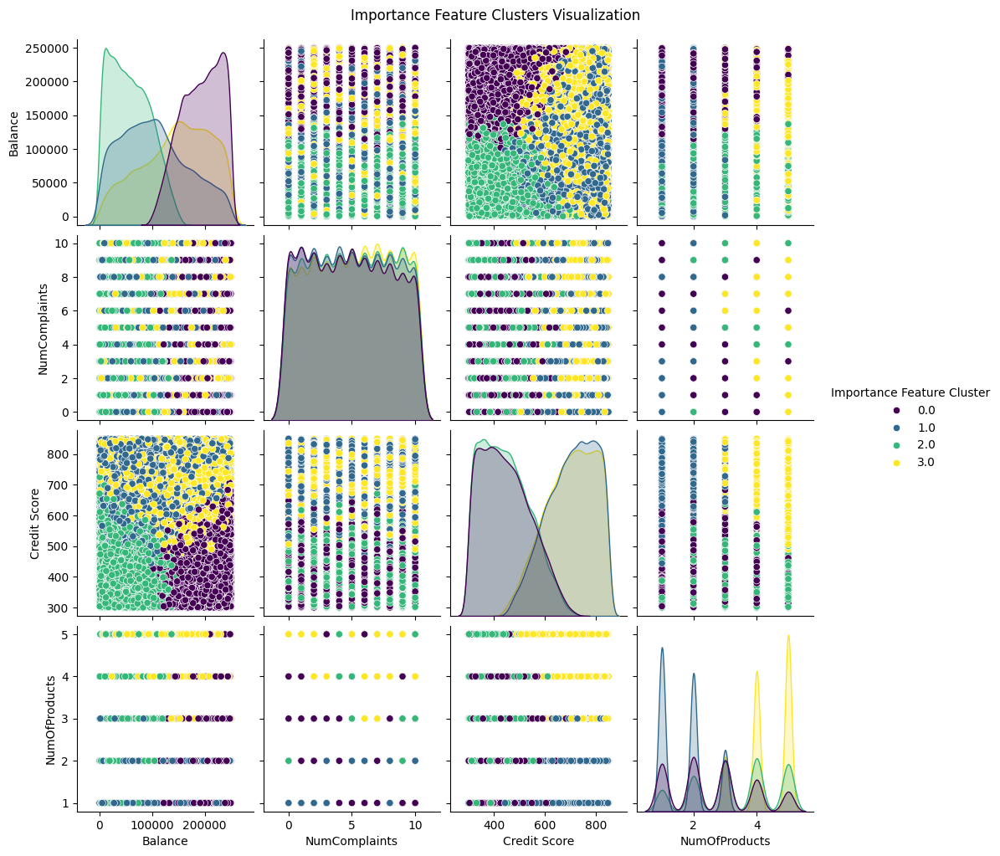

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans

df_importance = df.copy()
k_importance = 4

# If df_importance_features is a NumPy array:
df_importance_features = pd.DataFrame(df_importance_features)

# Impute missing values using the mean strategy
imputer = SimpleImputer(strategy='mean')  # You can choose other strategies like 'median'
df_importance_features_imputed = imputer.fit_transform(df_importance_features)

kmeans_importance = KMeans(n_clusters=k_importance, random_state=42, n_init=10)

# Use the imputed data for clustering
cluster_labels = kmeans_importance.fit_predict(df_importance_features_imputed)

# Create a new DataFrame with the cluster labels and the index of df_importance_features
cluster_df = pd.DataFrame({'Importance Feature Cluster': cluster_labels}, index=df_importance_features.index)

# Join the cluster_df with df_importance based on their indices
df_importance = df_importance.join(cluster_df, how='left')

# Visualize Clusters
sns.pairplot(df_importance, hue="Importance Feature Cluster", vars=importance_feature_clustering, palette='viridis')
plt.suptitle("Importance Feature Clusters Visualization", y=1.02)
plt.show()

#### **1. Define the label**

##### *A1. Detailed breakdown of insights and recommendations*

#### **2. EDA for the cluster**

##### **A. Cluster Summary**

##### **B. Customer Profiling**

##### **C. Churn Analysis**

##### **D. Feature Importance**

##### **E. Agg Group By Both Cluster**

## <font color=#FFA559>**5.6. Save the data**</font>

In [ ]:
# Save the clustered data
df_importance.to_csv("Bank_Botswana_with_Clusters_and_explaination_feature importance.csv", index=False)

In [ ]:
df_importance = df_importance_cluster.copy()

In [ ]:
df_importance.head()

,CustomerId,Surname,First Name,Date of Birth,Gender,Marital Status,Number of Dependents,Occupation,Income,Education Level,...,NumComplaints,Age,Debt-to-Income Ratio,Tenure Category,Occupation Category,zip_code,state,Predicted Churn,Churn Probability,Feature Importance Cluster
0,83ef0b54-35f6-4f84-af58-5653ac0c0dc4,Smith,Troy,1987-08-29,Male,Divorced,3,Information systems manager,77710.14,High School,...,0,37,0.539952,Lifetime,Engineering and Technology,14852,VI,0,0.182096,1
1,009f115a-e5ca-4cf4-97d6-530140545e4e,Sullivan,Katrina,2000-02-07,Female,Married,1,Charity fundraiser,58209.87,High School,...,1,25,0.153181,Lifetime,Business and Management,75805,RI,0,0.205163,2
2,66309fd3-5009-44d3-a3f7-1657c869d573,Fuller,Henry,1954-02-03,Female,Single,1,Television production assistant,9794.01,High School,...,6,71,4.418062,Veteran,Creative Arts and Design,69279,MH,0,0.149905,0
3,b02a30df-1a5f-4087-8075-2a35432da641,Young,Antonio,1991-01-15,Female,Divorced,5,Agricultural engineer,15088.98,High School,...,0,34,1.185478,Lifetime,Engineering and Technology,71940,AE,0,0.086010,0
4,0d932e5b-bb3a-4104-8c83-f84270f7f2ea,Andersen,John,1992-04-08,Female,Divorced,2,"Teacher, early years/pre",60726.56,Master's,...,6,32,0.538263,Lifetime,Education and Training,98290,MN,0,0.369375,3


# <font color=#FFE6C7>**6. K-Means Using PCA (Financial Cluster & Customer Activity)**</font>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA


df = pd.read_csv("Bank_Bostwana_predicted_Churn.csv")

In [ ]:
importance_feature_clustering = ['Balance', 'NumComplaints', 'Credit Score', 'NumOfProducts']

In [ ]:
# Standardize the data
ss_scalerscaler = StandardScaler()
df_importance_scaled = scaler.fit_transform(df[importance_feature_clustering])

In [ ]:
# Apply PCA for dimensionality reduction
pca_importance = PCA(n_components=2)
importance_pca = pca_importance.fit_transform(df_importance_scaled)

In [ ]:
# Apply KMeans with optimal clusters (assuming k=3 for both)
k_importance_pca = 4  # Adjust based on the elbow method output

kmeans_importance_pca = KMeans(n_clusters=k_importance_pca, random_state=42, n_init=10)

df['Importance Features Cluster PCA'] = kmeans_importance_pca.fit_predict(importance_pca)

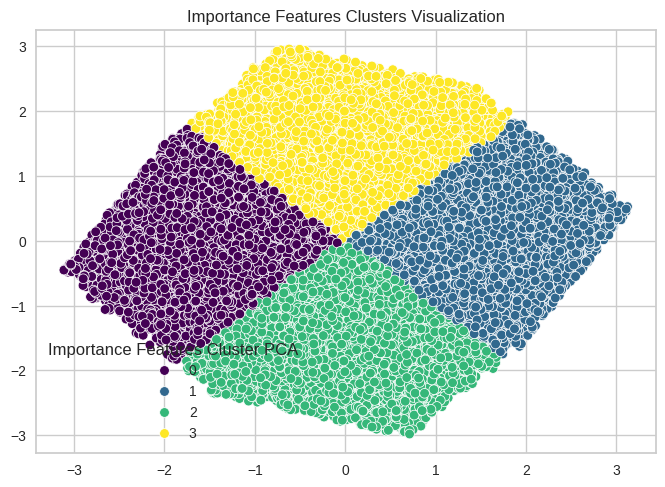

In [ ]:
# Visualize Clusters
sns.scatterplot(x=importance_pca[:,0], y=importance_pca[:,1], hue=df['Importance Features Cluster PCA'], palette='viridis')
plt.title("Importance Features Clusters Visualization")
plt.show()

In [ ]:
df

,CustomerId,Surname,First Name,Date of Birth,Gender,Marital Status,Number of Dependents,Occupation,Income,Education Level,...,NumComplaints,Age,Debt-to-Income Ratio,Tenure Category,Occupation Category,zip_code,state,Churn Probability,Predicted Churn,Importance Features Cluster PCA
0,83ef0b54-35f6-4f84-af58-5653ac0c0dc4,Smith,Troy,1987-08-29,Male,Divorced,3,Information systems manager,77710.14,High School,...,0,37,0.539952,Lifetime,Engineering and Technology,14852,VI,0.193891,0,3
1,009f115a-e5ca-4cf4-97d6-530140545e4e,Sullivan,Katrina,2000-02-07,Female,Married,1,Charity fundraiser,58209.87,High School,...,1,25,0.153181,Lifetime,Business and Management,75805,RI,0.213760,0,0
2,66309fd3-5009-44d3-a3f7-1657c869d573,Fuller,Henry,1954-02-03,Female,Single,1,Television production assistant,9794.01,High School,...,6,71,4.418062,Veteran,Creative Arts and Design,69279,MH,0.160935,0,3
3,b02a30df-1a5f-4087-8075-2a35432da641,Young,Antonio,1991-01-15,Female,Divorced,5,Agricultural engineer,15088.98,High School,...,0,34,1.185478,Lifetime,Engineering and Technology,71940,AE,0.112252,0,3
4,0d932e5b-bb3a-4104-8c83-f84270f7f2ea,Andersen,John,1992-04-08,Female,Divorced,2,"Teacher, early years/pre",60726.56,Master's,...,6,32,0.538263,Lifetime,Education and Training,98290,MN,0.358154,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115635,b4ef7eba-1a9e-4956-b827-50037a1087d5,Russell,Gregory,1965-03-09,Male,Divorced,2,Chemical engineer,15704.15,Diploma,...,7,60,1.679193,Loyal,Engineering and Technology,82178,MS,0.873007,1,0
115636,578e6b99-b42a-4af1-afb4-fd570ea0721f,Ramirez,Thomas,1955-01-10,Female,Single,3,Chartered legal executive (England and Wales),75792.62,High School,...,7,70,0.478010,Loyal,Business and Management,52386,OH,0.531959,1,0
115637,73a64c22-da8f-4c3e-8f62-d92f03636a1e,Clark,Tonya,1955-08-29,Male,Married,4,Field trials officer,30142.28,Diploma,...,4,69,0.213682,Lifetime,Science and Research,41106,GU,0.122313,0,3
115638,00affc66-75c4-43c4-9019-f28c434b5012,Stewart,Lisa,1992-12-27,Female,Married,0,Legal secretary,58636.06,High School,...,6,32,0.097893,Lifetime,Business and Management,2190,KS,0.132478,0,2


## **6.1. Save the Data**

In [ ]:
# Save the clustered data
df.to_csv("Bank_Botswana_with_Clusters_and_explaination_feature importance_pca.csv", index=False)

In [ ]:
df['Importance Features Cluster PCA'].value_counts()

,count
Importance Features Cluster PCA,
3,29438
2,29352
0,28504
1,28346


In [ ]:
df

,CustomerId,Surname,First Name,Date of Birth,Gender,Marital Status,Number of Dependents,Occupation,Income,Education Level,...,NumComplaints,Age,Debt-to-Income Ratio,Tenure Category,Occupation Category,zip_code,state,Churn Probability,Predicted Churn,Importance Features Cluster PCA
0,83ef0b54-35f6-4f84-af58-5653ac0c0dc4,Smith,Troy,1987-08-29,Male,Divorced,3,Information systems manager,77710.14,High School,...,0,37,0.539952,Lifetime,Engineering and Technology,14852,VI,0.193891,0,3
1,009f115a-e5ca-4cf4-97d6-530140545e4e,Sullivan,Katrina,2000-02-07,Female,Married,1,Charity fundraiser,58209.87,High School,...,1,25,0.153181,Lifetime,Business and Management,75805,RI,0.213760,0,0
2,66309fd3-5009-44d3-a3f7-1657c869d573,Fuller,Henry,1954-02-03,Female,Single,1,Television production assistant,9794.01,High School,...,6,71,4.418062,Veteran,Creative Arts and Design,69279,MH,0.160935,0,3
3,b02a30df-1a5f-4087-8075-2a35432da641,Young,Antonio,1991-01-15,Female,Divorced,5,Agricultural engineer,15088.98,High School,...,0,34,1.185478,Lifetime,Engineering and Technology,71940,AE,0.112252,0,3
4,0d932e5b-bb3a-4104-8c83-f84270f7f2ea,Andersen,John,1992-04-08,Female,Divorced,2,"Teacher, early years/pre",60726.56,Master's,...,6,32,0.538263,Lifetime,Education and Training,98290,MN,0.358154,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115635,b4ef7eba-1a9e-4956-b827-50037a1087d5,Russell,Gregory,1965-03-09,Male,Divorced,2,Chemical engineer,15704.15,Diploma,...,7,60,1.679193,Loyal,Engineering and Technology,82178,MS,0.873007,1,0
115636,578e6b99-b42a-4af1-afb4-fd570ea0721f,Ramirez,Thomas,1955-01-10,Female,Single,3,Chartered legal executive (England and Wales),75792.62,High School,...,7,70,0.478010,Loyal,Business and Management,52386,OH,0.531959,1,0
115637,73a64c22-da8f-4c3e-8f62-d92f03636a1e,Clark,Tonya,1955-08-29,Male,Married,4,Field trials officer,30142.28,Diploma,...,4,69,0.213682,Lifetime,Science and Research,41106,GU,0.122313,0,3
115638,00affc66-75c4-43c4-9019-f28c434b5012,Stewart,Lisa,1992-12-27,Female,Married,0,Legal secretary,58636.06,High School,...,6,32,0.097893,Lifetime,Business and Management,2190,KS,0.132478,0,2


In [ ]:
df[df['Churn Flag'] == 0].groupby('Importance Features Cluster PCA')['Predicted Churn'].value_counts().unstack()

Predicted Churn,0,1
Importance Features Cluster PCA,,
0,21066,1969
1,26909,170
2,24389,630
3,24937,1476


Predicted Churn                  Retained  At-Risk  Churn Risk (%)
Importance Features Cluster PCA                                   
0                                   21066     1969        8.547862
1                                   26909      170        0.627793
2                                   24389      630        2.518086
3                                   24937     1476        5.588157


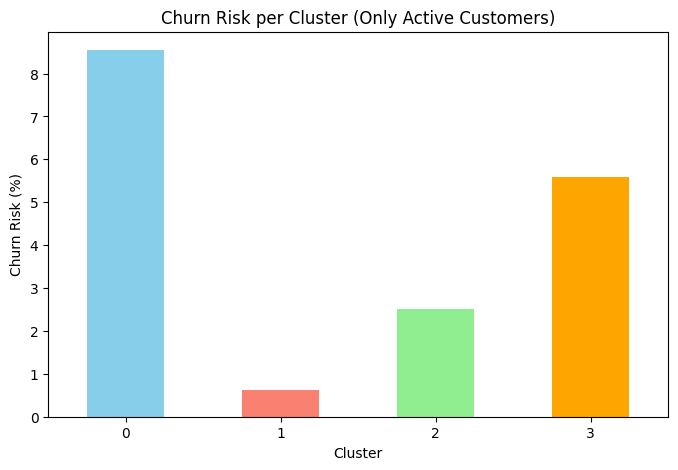

In [ ]:
# Filter only active (non-churned) customers
active_customers = df[df['Churn Flag'] == 0]

# Count predicted churn status per cluster
cluster_churn_summary = (
    active_customers.groupby('Importance Features Cluster PCA')['Predicted Churn']
    .value_counts()
    .unstack()
    .rename(columns={0: 'Retained', 1: 'At-Risk'})
    .fillna(0)
)

# Add churn risk percentage for better insights
cluster_churn_summary['Churn Risk (%)'] = (
    cluster_churn_summary['At-Risk'] /
    (cluster_churn_summary['Retained'] + cluster_churn_summary['At-Risk'])
) * 100

# Display result
print(cluster_churn_summary)

# Optional: Visualizing churn risk per cluster
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
cluster_churn_summary['Churn Risk (%)'].plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen', 'orange'])
plt.ylabel("Churn Risk (%)")
plt.xlabel("Cluster")
plt.title("Churn Risk per Cluster (Only Active Customers)")
plt.xticks(rotation=0)
plt.show()


<ipython-input-188-c111ceb04587>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df[feature], palette='viridis')


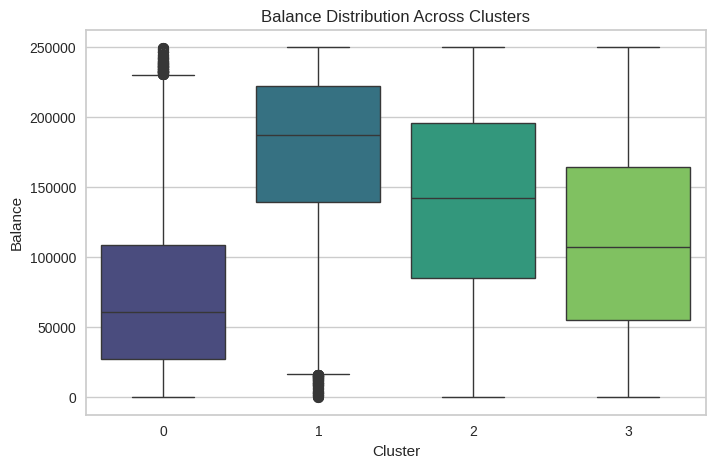

<ipython-input-188-c111ceb04587>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df[feature], palette='viridis')


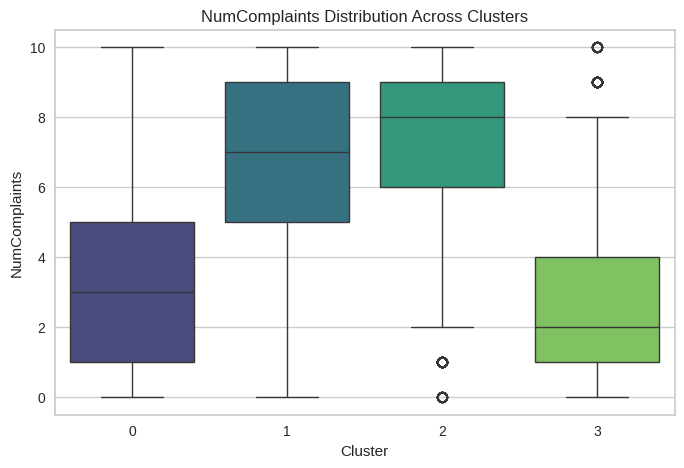

<ipython-input-188-c111ceb04587>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df[feature], palette='viridis')


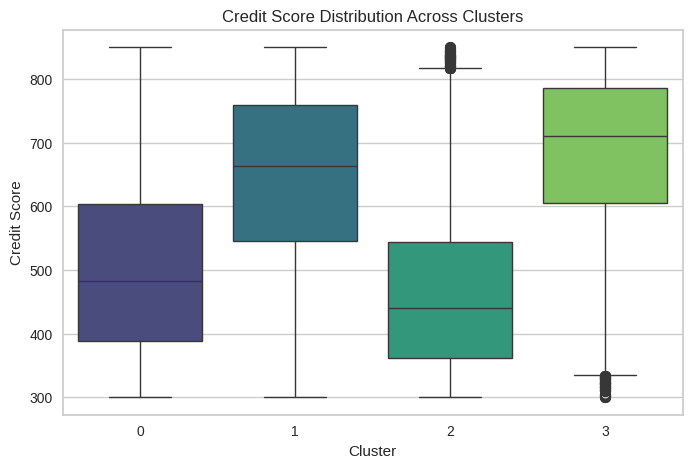

<ipython-input-188-c111ceb04587>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df[feature], palette='viridis')


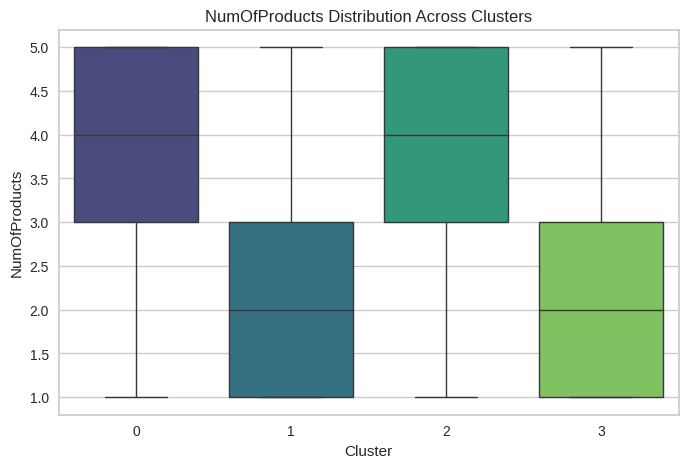

In [ ]:
# Analyze feature distributions per cluster
import seaborn as sns

for feature in importance_feature_clustering:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df['Importance Features Cluster PCA'], y=df[feature], palette='viridis')
    plt.title(f'{feature} Distribution Across Clusters')
    plt.xlabel('Cluster')
    plt.ylabel(feature)
    plt.show()



1. **NumOfProducts**:  
   - Cluster 0 & 2 have higher median values (customers own more products).
   - Cluster 1 & 3 have lower median values (customers own fewer products).

2. **Credit Score**:  
   - Cluster 3 has the highest credit scores.
   - Cluster 2 has the lowest scores.
   - Clusters 0 & 1 have moderate scores but with different spread.

3. **NumComplaints**:  
   - Cluster 1 & 2 have higher complaints.
   - Cluster 3 & 0 have lower complaints.

4. **Balance**:  
   - Cluster 1 & 2 have higher balance amounts.
   - Cluster 0 has the lowest balance.


---
---
---
---

## **Cluster Segmentation Analysis**  

Based on the clustering results from important features (`Balance`, `NumComplaints`, `Credit Score`, and `NumOfProducts`), we can define possible customer segments:

---

### **Cluster 0: Low Balance, Moderate Credit Score, Moderate Product Holding**
- **Balance:** Lowest among all clusters.
- **Credit Score:** Moderate, not the highest but also not the worst.
- **NumOfProducts:** Moderate (customers hold a decent number of products).
- **NumComplaints:** Low complaints.  
🡺 **Possible Segment:** **Budget-Conscious Customers**  
👉 Likely customers who manage their finances cautiously, avoiding excessive spending and credit risks.

---

### **Cluster 1: High Balance, High Complaints, High Credit Score**
- **Balance:** One of the highest.
- **Credit Score:** High.
- **NumOfProducts:** Moderate.
- **NumComplaints:** High (frequent complaints).  
🡺 **Possible Segment:** **High-Value, Dissatisfied Customers**  
👉 These are high-value customers who own multiple financial products but are not satisfied with the service.

---

### **Cluster 2: High Complaints, Low Credit Score, High Product Holding**
- **Balance:** Moderate to high.
- **Credit Score:** Lowest.
- **NumOfProducts:** Highest (customers own many products).
- **NumComplaints:** High.  
🡺 **Possible Segment:** **Risky, High-Engagement Customers**  
👉 Customers who engage a lot with financial products but may have poor financial management or bad credit behavior.

---

### **Cluster 3: High Credit Score, Low Complaints, Low Product Holding**
- **Balance:** Moderate.
- **Credit Score:** Highest.
- **NumOfProducts:** Lowest (customers hold fewer products).
- **NumComplaints:** Low.  
🡺 **Possible Segment:** **Stable, Selective Customers**  
👉 These customers are financially stable, make careful decisions, and prefer fewer but quality products.

---

### **Business Insights & Recommendations**  

1. **For Cluster 0 (Budget-Conscious Customers):**
   - Offer financial advisory services to increase their engagement.
   - Promote products that match their risk-averse behavior (e.g., savings plans).

2. **For Cluster 1 (High-Value, Dissatisfied Customers):**
   - Improve customer service to address complaints.
   - Provide premium benefits to retain them.

3. **For Cluster 2 (Risky, High-Engagement Customers):**
   - Implement financial education programs.
   - Closely monitor credit activities and provide risk-mitigation strategies.

4. **For Cluster 3 (Stable, Selective Customers):**
   - Offer personalized high-value investment options.
   - Encourage cross-selling of additional services.

---

---
---
---
---

## **1️⃣ Deeper Churn Analysis per Cluster**  

We already have the churn rate per cluster:  

| Cluster | Churn Rate |
|---------|------------|
| **0** | **19.19%** |
| **1** | **4.47%** |
| **2** | **14.76%** |
| **3** | **10.28%** |

### **Key Observations:**
- **Cluster 0 has the highest churn rate (19.19%)**  
  👉 Customers with low balances and moderate product ownership might leave due to limited financial flexibility.  
- **Cluster 1 has the lowest churn rate (4.47%)**  
  👉 Even though they complain a lot, they have a high balance and credit score, so they are likely to stay.  
- **Cluster 2 has a high churn rate (14.76%)**  
  👉 These customers own many products but have a low credit score, indicating financial struggles.  
- **Cluster 3 has a moderate churn rate (10.28%)**  
  👉 They are stable but selective, leaving when they find better alternatives.  

### **Next Action:**  
- **Would you like a breakdown of churn factors per cluster?** (e.g., churn reasons, tenure, product usage)  

---

## **2️⃣ Prediction Model for Retention Strategies**  

We can create a **churn prediction model** using features such as:  
✅ **Financial features:** Balance, Credit Score, Debt-to-Income Ratio  
✅ **Engagement features:** NumOfProducts, NumComplaints, Customer Tenure  
✅ **Demographic features:** Age, Occupation  

### **Approach:**
- **Feature Engineering**: Identify the most relevant predictors.  
- **Train a Machine Learning Model** (Random Forest / Logistic Regression).  
- **Provide recommendations on customer retention strategies.**  

👉 **Would you like the model to predict churn probability or customer lifetime value (CLV)?**  

---

## **3️⃣ Specific Business Questions & Insights**
Here are some strategic business questions we can answer:  

### **Customer Retention**
📌 **Which products are most likely to be associated with high churn?**  
📌 **Are there early warning signs before a customer churns?**  
📌 **Which customer segment has the highest risk and should be prioritized?**  

### **Revenue Optimization**
📌 **Which customer group generates the most revenue but is at risk of leaving?**  
📌 **How can we increase cross-selling to low-product customers (Cluster 3)?**  

### **Customer Experience & Service Improvement**
📌 **What are the most common complaints from high-value customers?**  
📌 **Do complaints correlate with churn, or do customers complain but stay?**  

👉 **Which questions are most important for your analysis?** Let me know, and I’ll generate insights accordingly! 🚀

---
---
---
---

---

## **🔍 Churn Factors Analysis per Cluster**
We'll examine:  
1️⃣ **Churn Reasons per Cluster**  
2️⃣ **Customer Tenure Distribution**  
3️⃣ **NumOfProducts Distribution**  

---

### **1️⃣ Churn Reasons per Cluster**  
To understand why customers are leaving, we can check the distribution of `Churn Reason` across clusters.  

👉 **Action:** Run this code to get a breakdown of churn reasons per cluster:  

```python
# Count churn reasons per cluster
churn_reasons_cluster = df[df['Churn Flag'] == 1].groupby('Importance Features Cluster PCA')['Churn Reason'].value_counts(normalize=True).unstack()

# Plot
plt.figure(figsize=(12, 6))
churn_reasons_cluster.plot(kind='bar', stacked=True, colormap='viridis', figsize=(12,6))
plt.title("Churn Reasons Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Proportion of Churn Reasons")
plt.legend(title="Churn Reason", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
```

**Insights to Look For:**  
✔️ Are some clusters leaving due to pricing issues?  
✔️ Are complaints linked to churn?  
✔️ Are high-balance customers churning due to service quality?  

---

### **2️⃣ Customer Tenure Distribution per Cluster**  
👉 **Run this to check how long customers stay before churning:**  

```python
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['Customer Tenure'], palette='viridis')
plt.title("Customer Tenure Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Customer Tenure (Months)")
plt.show()
```

**Insights:**  
✔️ Do high-churn clusters have shorter tenures?  
✔️ Are new customers more likely to churn?  

---

### **3️⃣ NumOfProducts Distribution per Cluster**  
Let's analyze product engagement across clusters.  

```python
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['NumOfProducts'], palette='viridis')
plt.title("NumOfProducts Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Number of Products")
plt.show()
```

**Insights:**  
✔️ Are customers with fewer products more likely to churn?  
✔️ Which clusters are heavily engaged but still leaving?  

---

### **📌 Next Steps**
Once you run the code and share the results, we can:  
✅ Identify key risk factors per cluster  
✅ Suggest **retention strategies** to reduce churn  
✅ Recommend personalized **marketing & product offers**  


Chat GPT Suggestion

## 1️⃣ Churn Reasons per Cluster

<Figure size 1200x600 with 0 Axes>

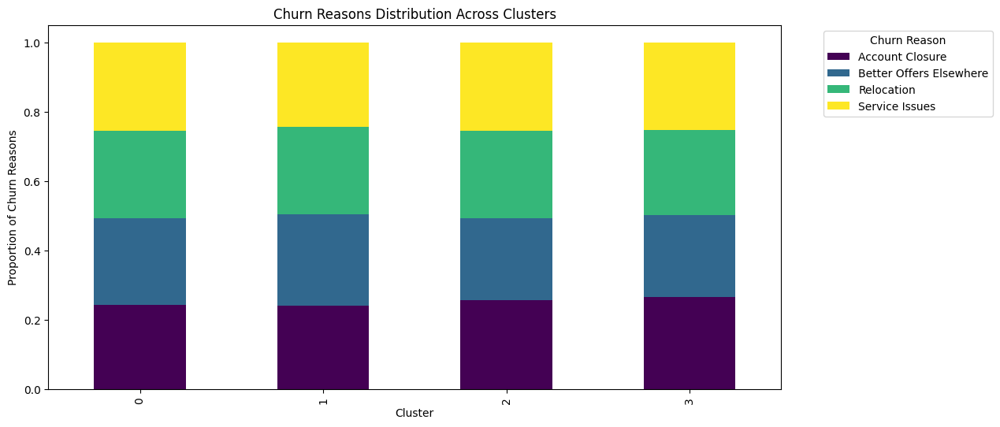

In [ ]:
# Count churn reasons per cluster
churn_reasons_cluster = df[df['Churn Flag'] == 1].groupby('Importance Features Cluster PCA')['Churn Reason'].value_counts(normalize=True).unstack()

# Plot
plt.figure(figsize=(12, 6))
churn_reasons_cluster.plot(kind='bar', stacked=True, colormap='viridis', figsize=(12,6))
plt.title("Churn Reasons Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Proportion of Churn Reasons")
plt.legend(title="Churn Reason", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


## 2️⃣ Customer Tenure Distribution per Cluster

<ipython-input-51-053a0560752c>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['Customer Tenure'], palette='viridis')


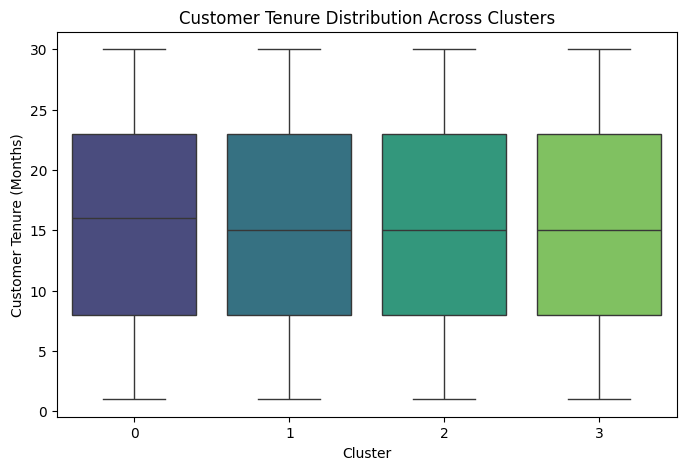

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['Customer Tenure'], palette='viridis')
plt.title("Customer Tenure Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Customer Tenure (Months)")
plt.show()


## 3️⃣ NumOfProducts Distribution per Cluster

<ipython-input-52-f709cd3d2f7e>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['NumOfProducts'], palette='viridis')


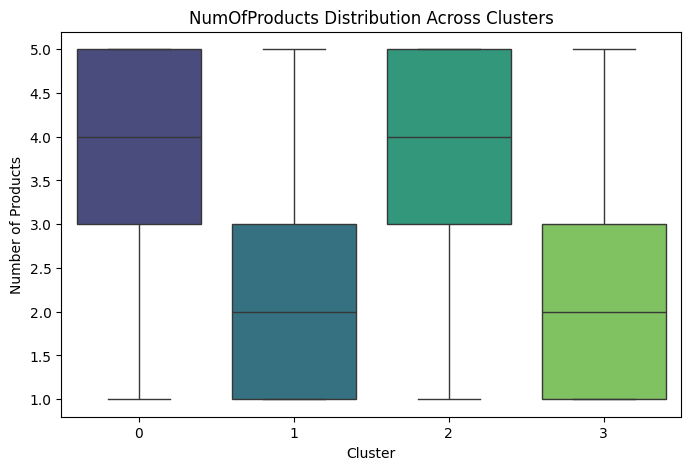

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['Importance Features Cluster PCA'], y=df['NumOfProducts'], palette='viridis')
plt.title("NumOfProducts Distribution Across Clusters")
plt.xlabel("Cluster")
plt.ylabel("Number of Products")
plt.show()


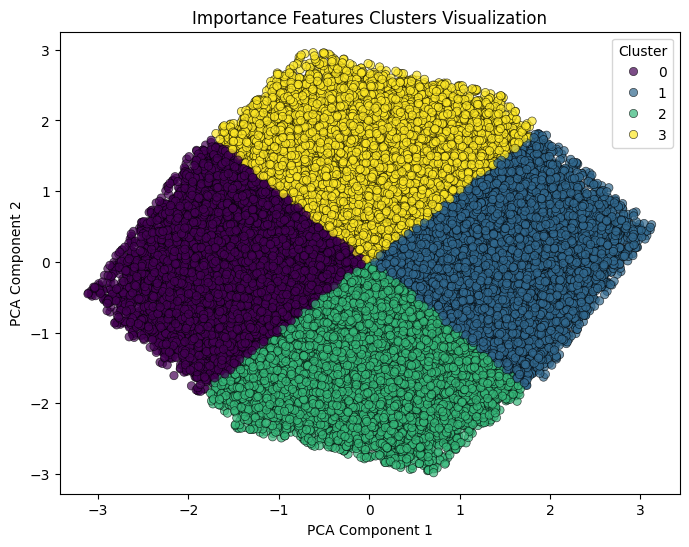

Cluster Count:
 Importance Features Cluster PCA
3    29438
2    29352
0    28504
1    28346
Name: count, dtype: int64

Churn Rate per Cluster:
 Importance Features Cluster PCA
0    0.191868
1    0.044698
2    0.147622
3    0.102758
Name: Churn Flag, dtype: float64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


# Visualize Clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=importance_pca[:, 0], y=importance_pca[:, 1],
                hue=df['Importance Features Cluster PCA'], palette='viridis', alpha=0.7, edgecolors='k')
plt.title("Importance Features Clusters Visualization")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()

# Count of customers per cluster
print("Cluster Count:\n", df['Importance Features Cluster PCA'].value_counts())

# Churn Rate per Cluster
churn_rate = df.groupby('Importance Features Cluster PCA')['Churn Flag'].mean()
print("\nChurn Rate per Cluster:\n", churn_rate)


## Profiling Customer

In [ ]:
import pandas as pd
import numpy as np

# Grouping by clusters and calculating summary statistics
cluster_summary = df.groupby('Importance Features Cluster PCA').agg({
    'Balance': ['mean', 'median', 'std'],
    'NumComplaints': ['mean', 'median', 'std'],
    'Credit Score': ['mean', 'median', 'std'],
    'NumOfProducts': ['mean', 'median', 'std'],
    'Churn Flag': ['mean', 'count']
})

# Renaming columns for better readability
cluster_summary.columns = ['_'.join(col).strip() for col in cluster_summary.columns.values]
cluster_summary = cluster_summary.rename(columns={'Churn Flag_mean': 'Churn Rate', 'Churn Flag_count': 'Customer Count'})

# Sorting by churn rate
cluster_summary = cluster_summary.sort_values(by='Churn Rate', ascending=False)

# Display cluster profiling summary
print("Cluster Profiling Summary:")
cluster_summary

Cluster Profiling Summary:


,Balance_mean,Balance_median,Balance_std,NumComplaints_mean,NumComplaints_median,NumComplaints_std,Credit Score_mean,Credit Score_median,Credit Score_std,NumOfProducts_mean,NumOfProducts_median,NumOfProducts_std,Churn Rate,Customer Count
Importance Features Cluster PCA,,,,,,,,,,,,,,
0,73531.257186,61217.375,55757.607844,2.893454,3.0,2.259934,503.428115,483.0,136.359806,3.693482,4.0,1.233486,0.191868,28504
2,138378.536658,142398.010,67414.020726,7.194876,8.0,2.361385,463.222404,440.0,120.584475,3.778277,4.0,1.178219,0.147622,29352
3,111405.309511,107560.165,67201.662807,2.796046,2.0,2.354561,686.313201,710.0,120.199304,2.220599,2.0,1.167517,0.102758,29438
1,175548.823506,187020.840,56167.835155,7.100614,7.0,2.268073,644.257356,663.0,136.802947,2.303217,2.0,1.231343,0.044698,28346


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115640 entries, 0 to 115639
Data columns (total 32 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   CustomerId                       115640 non-null  object 
 1   Surname                          115640 non-null  object 
 2   First Name                       115640 non-null  object 
 3   Date of Birth                    115640 non-null  object 
 4   Gender                           115640 non-null  object 
 5   Marital Status                   115640 non-null  object 
 6   Number of Dependents             115640 non-null  int64  
 7   Occupation                       115640 non-null  object 
 8   Income                           115640 non-null  float64
 9   Education Level                  115640 non-null  object 
 10  Contact Information              115640 non-null  object 
 11  Customer Tenure                  115640 non-null  int64  
 12  Cu

Churn Probability by Cluster:
Importance Features Cluster PCA
0    0.331670
1    0.200833
2    0.278593
3    0.245676
Name: Churn Probability, dtype: float64


<ipython-input-57-0d74f2b55fa7>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_churn_prob.index, y=cluster_churn_prob.values, palette='coolwarm')


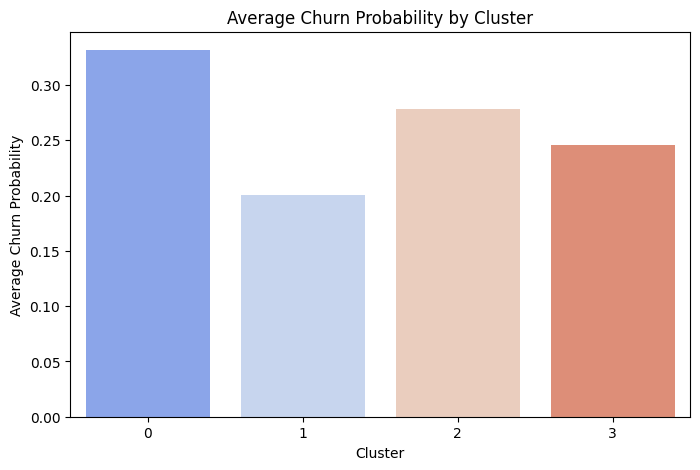

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98    101546
           1       0.77      0.99      0.87     14094

    accuracy                           0.96    115640
   macro avg       0.88      0.98      0.92    115640
weighted avg       0.97      0.96      0.96    115640



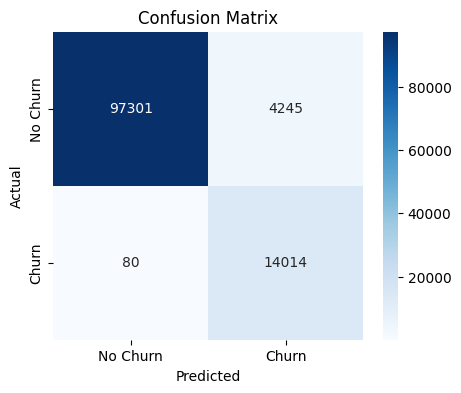

Cluster-Based Retention Insights:
                                 Churn_Probability_Mean  Churn_Rate  \
Importance Features Cluster PCA                                       
0                                              0.331670    0.191868   
2                                              0.278593    0.147622   
3                                              0.245676    0.102758   
1                                              0.200833    0.044698   

                                   Balance_Avg  Credit_Score_Avg  \
Importance Features Cluster PCA                                    
0                                 73531.257186        503.428115   
2                                138378.536658        463.222404   
3                                111405.309511        686.313201   
1                                175548.823506        644.257356   

                                 NumOfProducts_Avg  NumComplaints_Avg  \
Importance Features Cluster PCA                          

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Load Data (Assuming df is already loaded with clustering results and predictions)

# 1. Analyze Churn Probability by Cluster
cluster_churn_prob = df.groupby('Importance Features Cluster PCA')['Churn Probability'].mean()
print("Churn Probability by Cluster:")
print(cluster_churn_prob)

# Visualization
plt.figure(figsize=(8, 5))
sns.barplot(x=cluster_churn_prob.index, y=cluster_churn_prob.values, palette='coolwarm')
plt.xlabel("Cluster")
plt.ylabel("Average Churn Probability")
plt.title("Average Churn Probability by Cluster")
plt.show()

# 2. Compare Predicted Churn with Actual Churn
print("Classification Report:")
print(classification_report(df['Churn Flag'], df['Predicted Churn']))

# Confusion Matrix
cm = confusion_matrix(df['Churn Flag'], df['Predicted Churn'])
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["No Churn", "Churn"], yticklabels=["No Churn", "Churn"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# 3. Retention Strategy Insights
cluster_summary = df.groupby('Importance Features Cluster PCA').agg(
    Churn_Probability_Mean=('Churn Probability', 'mean'),
    Churn_Rate=('Churn Flag', 'mean'),
    Balance_Avg=('Balance', 'mean'),
    Credit_Score_Avg=('Credit Score', 'mean'),
    NumOfProducts_Avg=('NumOfProducts', 'mean'),
    NumComplaints_Avg=('NumComplaints', 'mean'),
    Customer_Count=('CustomerId', 'count')
)
print("Cluster-Based Retention Insights:")
print(cluster_summary.sort_values(by='Churn_Probability_Mean', ascending=False))


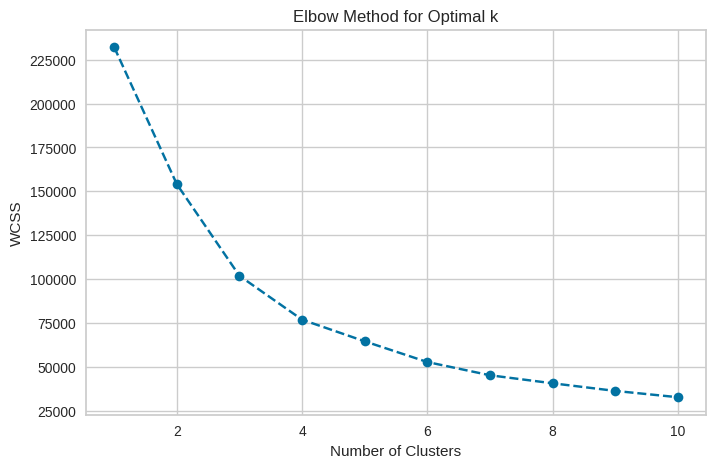

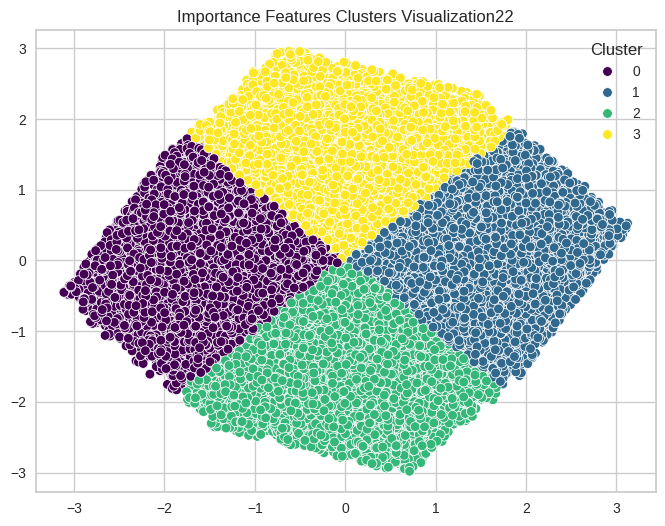


Customer Count per Cluster:
 Importance Features Cluster PCA22
3    29438
2    29352
0    28504
1    28346
Name: count, dtype: int64

Churn Rate per Cluster:
 Importance Features Cluster PCA22
0    0.191868
1    0.044698
2    0.147622
3    0.102758
Name: Churn Flag, dtype: float64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Load dataset
df = data_original.copy()
# Select important features
importance_features = ['Balance', 'NumComplaints', 'Credit Score', 'NumOfProducts']

# Standardize the data
scaler = StandardScaler()
df_importance_scaled = scaler.fit_transform(df[importance_features])

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)  # Reduce to 2D for visualization
importance_pca = pca.fit_transform(df_importance_scaled)

# Determine optimal clusters using Elbow Method
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(importance_pca)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method for Optimal k')
plt.show()

# Set optimal k (adjust based on elbow method)
optimal_k = 4  # Adjust this based on your elbow method output

# Apply KMeans clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df['Importance Features Cluster PCA22'] = kmeans.fit_predict(importance_pca)

# Visualize Clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=importance_pca[:, 0], y=importance_pca[:, 1], hue=df['Importance Features Cluster PCA22'], palette='viridis')
plt.title("Importance Features Clusters Visualization22")
plt.legend(title="Cluster")
plt.show()

# Count customers per cluster
cluster_counts = df['Importance Features Cluster PCA22'].value_counts()
print("\nCustomer Count per Cluster:\n", cluster_counts)

# Analyze Churn Rate per Cluster
churn_rate = df.groupby('Importance Features Cluster PCA22')['Churn Flag'].mean()
print("\nChurn Rate per Cluster:\n", churn_rate)
